# DATA SCRAPING

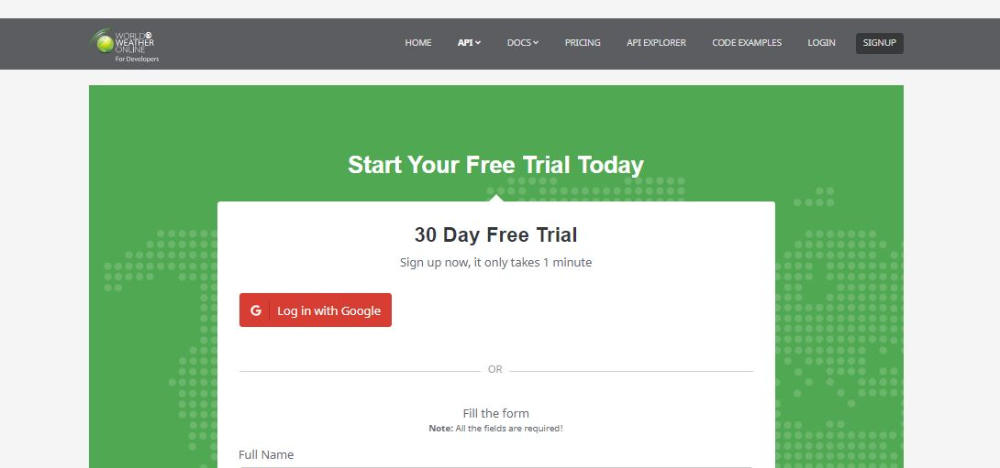

In [5]:
from IPython.display import Image
Image(filename="Doc_img/Capture.jpg", height=300)

[API Documentation](https://www.worldweatheronline.com/weather-api/api/docs/local-city-town-weather-api.aspx)

In [6]:
import os
import glob
import random
import requests
import numpy as np
import pandas as pd

In [7]:
_date = '2010-01-01'
index = 0

for ind in range(130):
    x = requests.get(f'https://api.worldweatheronline.com/premium/v1/past-weather.ashx?key=aa863bfc074f43ddbb2154333210112&q=nasik&format=csv&date={_date}&enddate=2021-12-01&tp=1')
    txt = x.text
    f = open('csvfile.csv','w')
    f.write(txt) 
    f.close()
    df = pd.read_csv(r'csvfile.csv', skiprows=5, header=None)  # sep=",", error_bad_lines=False
    filename = df[0][3].replace('-','')
    _date = df[0][len(df)-1]
    df.to_csv('part1\\'+str(index)+'_'+filename+'.csv', index=False)
    index += 1
    df = 0
    os.remove("csvfile.csv")    

EmptyDataError: No columns to parse from file

In [ ]:
for file_list in range(len(glob.glob('part1//*.csv'))):
    for all_path in glob.glob('part1//*.csv'):
        if str(file_list) == all_path.split('\\')[1].split('_')[0]:
            df = pd.read_csv(all_path)
            cols_name = list(df.iloc[0])
            drop_row = [0,1,2]
            for ind in range(len(df)):
                if df['1'][ind] == '0':
                    drop_row.append(ind-1)
            update_df = df.drop(drop_row)
            update_df = update_df.reset_index(drop=True)
            update_df.columns = cols_name
            update_df.to_csv('part2//'+str(file_list)+'.csv', index=False)

In [ ]:
df0 = pd.DataFrame(columns=cols_name)

for file_list in range(len(glob.glob('part2//*.csv'))):
    for all_path in glob.glob('part2//*.csv'):
        if str(file_list) == all_path.split('\\')[1].split('.')[0]:
            print(file_list, all_path.split('\\')[1].split('.')[0], all_path)
            dfn = pd.read_csv(all_path)
            df0 = pd.concat([df0, dfn], axis=0)

df0.reset_index(drop=True)
df0.shape

In [ ]:
df0.shape

In [ ]:
df0.reset_index(drop=True)

In [ ]:
print(len(df0))
# dropping duplicate values
df0.drop_duplicates(subset = cols_name, keep = False, inplace = True)
print(len(df0))

In [ ]:
df0.to_csv('part3//2010-2021.csv', index=False)

In [ ]:
df0.head(2)

In [ ]:
df0.shape

In [ ]:
df0.info()

In [ ]:
# Type Casting
df0['time'] = df0['time'].astype(int)
df0["tempC"] = pd.to_numeric(df0["tempC"])
df0["windspeedKmph"] = pd.to_numeric(df0["windspeedKmph"])
df0[['precipMM']] = df0[['precipMM']].astype(float)
df0["humidity"] = pd.to_numeric(df0["humidity"])
df0["pressureMB"] = pd.to_numeric(df0["pressureMB"])

In [ ]:
df = pd.read_csv(r'part3//2010-2021.csv')
df.head(3)

In [ ]:
observation = [] 
tempC_7to8, tempC_1to2, tempC_6to7 = [],[],[] 
humidity_7to8, humidity_1to2, humidity_6to7 = [],[],[]
windspeedKmph_7to8, windspeedKmph_1to2, windspeedKmph_6to7 = [],[],[]
pressureMB_7to8, pressureMB_1to2, pressureMB_6to7 = [],[],[]
precipMM_7to8, precipMM_1to2, precipMM_6to7 = [],[],[]
weatherDesc_7to8, weatherDesc_1to2, weatherDesc_6to7 = [],[],[]

for ind in range(len(df)):
    if df['time'][ind] == 700:
        print('At 7 to 8 : ', df['#date'][ind], df['tempC'][ind], df['humidity'][ind], df['windspeedKmph'][ind],
             df['pressureMB'][ind], df['precipMM'][ind], df['weatherDesc'][ind])
        
        observation.append(df['#date'][ind])
        tempC_7to8.append(df['tempC'][ind])
        humidity_7to8.append(df['humidity'][ind])
        windspeedKmph_7to8.append(df['windspeedKmph'][ind])
        pressureMB_7to8.append(df['pressureMB'][ind])
        precipMM_7to8.append(df['precipMM'][ind])
        weatherDesc_7to8.append(df['weatherDesc'][ind])
        
        
    if df['time'][ind] == 1300:
        print('At 1 to 2 : ', df['#date'][ind], df['tempC'][ind], df['humidity'][ind], df['windspeedKmph'][ind],
             df['pressureMB'][ind], df['precipMM'][ind], df['weatherDesc'][ind])
        
        tempC_1to2.append(df['tempC'][ind])
        humidity_1to2.append(df['humidity'][ind])
        windspeedKmph_1to2.append(df['windspeedKmph'][ind])
        pressureMB_1to2.append(df['pressureMB'][ind])
        precipMM_1to2.append(df['precipMM'][ind])
        weatherDesc_1to2.append(df['weatherDesc'][ind])
        
        
    if df['time'][ind] == 1800:
        print('At 6 to 7 : ', df['#date'][ind], df['tempC'][ind], df['humidity'][ind], df['windspeedKmph'][ind],
             df['pressureMB'][ind], df['precipMM'][ind], df['weatherDesc'][ind])
        
        tempC_6to7.append(df['tempC'][ind])
        humidity_6to7.append(df['humidity'][ind])
        windspeedKmph_6to7.append(df['windspeedKmph'][ind])
        pressureMB_6to7.append(df['pressureMB'][ind])
        precipMM_6to7.append(df['precipMM'][ind])
        weatherDesc_6to7.append(df['weatherDesc'][ind])
        

In [ ]:
print(len(observation))
print(len(tempC_7to8))
print(len(humidity_7to8))
print(len(windspeedKmph_7to8))
print(len(pressureMB_7to8))
print(len(precipMM_7to8))
print(len(weatherDesc_7to8))

print(len(observation))
print(len(tempC_1to2))
print(len(humidity_1to2))
print(len(windspeedKmph_1to2))
print(len(pressureMB_1to2))
print(len(precipMM_1to2))
print(len(weatherDesc_1to2))

print(len(observation))
print(len(tempC_6to7))
print(len(humidity_6to7))
print(len(windspeedKmph_6to7))
print(len(pressureMB_6to7))
print(len(precipMM_6to7))
print(len(weatherDesc_6to7))


In [ ]:
df_main = pd.DataFrame()

df_main['observation'] = observation

df_main['tempC_7to8'] = tempC_7to8
df_main['tempC_1to2'] = tempC_1to2
df_main['tempC_6to7'] = tempC_6to7

df_main['humidity_7to8'] = humidity_7to8
df_main['humidity_1to2'] = humidity_1to2
df_main['humidity_6to7'] = humidity_6to7

df_main['windspeedKmph_7to8'] = windspeedKmph_7to8
df_main['windspeedKmph_1to2'] = windspeedKmph_1to2
df_main['windspeedKmph_6to7'] = windspeedKmph_6to7

df_main['pressureMB_7to8'] = pressureMB_7to8
df_main['pressureMB_1to2'] = pressureMB_1to2
df_main['pressureMB_6to7'] = pressureMB_6to7

df_main['precipMM_7to8'] = precipMM_7to8
df_main['precipMM_1to2'] = precipMM_1to2
df_main['precipMM_6to7'] = precipMM_6to7

df_main['weatherDesc_7to8'] = weatherDesc_7to8
df_main['weatherDesc_1to2'] = weatherDesc_1to2
df_main['weatherDesc_6to7'] = weatherDesc_6to7

df_main.head()

In [ ]:
df_main.to_csv('part4//2010-2021.csv', index=False)

In [ ]:
df = pd.read_csv(r'part4/2010-2021.csv')
df.head()

In [ ]:
from statistics import mean

tempC_avg, humidity_avg, windspeedKmph_avg, pressureMB_avg, precipMM_avg = [],[],[],[],[]

for ind in range(len(df)):
    tempC_avg.append(mean([df['tempC_7to8'][ind],df['tempC_1to2'][ind],df['tempC_6to7'][ind]]))     
    humidity_avg.append(mean([df['humidity_7to8'][ind],df['humidity_1to2'][ind],df['humidity_6to7'][ind]]))
    windspeedKmph_avg.append(mean([df['windspeedKmph_7to8'][ind],df['windspeedKmph_1to2'][ind],df['windspeedKmph_6to7'][ind]]))
    pressureMB_avg.append(mean([df['pressureMB_7to8'][ind],df['pressureMB_1to2'][ind],df['pressureMB_6to7'][ind]]))
    precipMM_avg.append(mean([df['precipMM_7to8'][ind],df['precipMM_1to2'][ind],df['precipMM_6to7'][ind]]))

df['tempC_avg'] = tempC_avg 
df['humidity_avg'] = humidity_avg
df['windspeedKmph_avg'] = windspeedKmph_avg
df['pressureMB_avg'] = pressureMB_avg
df['precipMM_avg'] = precipMM_avg

column_names = ['observation', 'tempC_7to8', 'tempC_1to2', 'tempC_6to7', 'tempC_avg',
                'humidity_7to8', 'humidity_1to2', 'humidity_6to7', 'humidity_avg',
                'windspeedKmph_7to8', 'windspeedKmph_1to2', 'windspeedKmph_6to7', 'windspeedKmph_avg',
                'pressureMB_7to8', 'pressureMB_1to2', 'pressureMB_6to7', 'pressureMB_avg',
                'precipMM_7to8', 'precipMM_1to2', 'precipMM_6to7', 'precipMM_avg',
                'weatherDesc_7to8', 'weatherDesc_1to2','weatherDesc_6to7']

df = df.reindex(columns=column_names)

df.head()

In [ ]:
# adding artificial values / data augmentation

soil_moisure, soil_pH, water_pH, water_TDS_mgpl  = [],[],[],[]

for ind in range(len(df)):
    if int(df['observation'][ind].split('-')[1]) == 1 or int(df['observation'][ind].split('-')[1]) == 2 or \
    int(df['observation'][ind].split('-')[1]) == 11 or int(df['observation'][ind].split('-')[1]) == 12:
        soil_moisure.append(random.randint(40,45))
    
    elif int(df['observation'][ind].split('-')[1]) == 3 or int(df['observation'][ind].split('-')[1]) == 4 or \
    int(df['observation'][ind].split('-')[1]) == 5 or int(df['observation'][ind].split('-')[1]) == 6:
        soil_moisure.append(random.randint(30,35))
        
    elif int(df['observation'][ind].split('-')[1]) == 7 or int(df['observation'][ind].split('-')[1]) == 8:
        soil_moisure.append(random.randint(45,50))
        
    elif int(df['observation'][ind].split('-')[1]) == 9 or int(df['observation'][ind].split('-')[1]) == 10:
        soil_moisure.append(random.randint(50,55))
    
    else: pass
    
    soil_pH.append(round(random.uniform(6.5, 7.5),2)) 
    water_pH.append(round(random.uniform(6.5, 8.5),2))
    
    if int(df['observation'][ind].split('-')[2])%15 == 0:
        val = random.randint(1710,1720)
        water_TDS_mgpl.append(val-(val*0.05))
    else:
        val = random.randint(1707,1710)
        water_TDS_mgpl.append(val)
        
df['%_soil_moisure'] = soil_moisure
df['soil_pH'] = soil_pH
df['water_pH'] = water_pH
df['water_TDS_mgpl'] = water_TDS_mgpl

df.head()

In [ ]:
df.tail()

In [ ]:
df.head(20)

In [ ]:
df.to_csv('part5//2010-2021.csv', index=False)

Submitted to ma'am and get new added data file for classification

# EDA

In [8]:
import numpy as np
import pandas as pd
import seaborn as sns
sns.set(font_scale=2.4)
from matplotlib import pyplot as plt
%matplotlib inline

import warnings
warnings.filterwarnings("ignore", category=FutureWarning)

from pylab import figure, axes, pie, title, show

In [9]:
df = pd.read_excel(r'part6\\Final Dataset 2018-2021.xlsx', sheet_name='2018-2021')
df.head()

,observation,tempC_7to8,tempC_1to2,tempC_6to7,tempC_avg,Relative humidity_7to8,humidity_1to2,humidity_6to7,humidity_avg,windspeedKmph_7to8,...,%_soil_moisure,soil_pH,water_pH,water_TDS_mgpl,Label (Disease Yes_No),Anthracnose,Bactorial Blight,Fruit Borer_Blight Blora,Fruit Spot_Rot,Fusarium Wilt
0,2018-01-01,22,26,20,22,38,28,44,36,5,...,44,7.2,7.6,1709.0,NO,NaN,NaN,NaN,NaN,NaN
1,2018-01-02,21,28,21,23,39,25,38,34,10,...,43,7.2,7.6,1708.0,NO,NaN,NaN,NaN,NaN,NaN
2,2018-01-03,20,28,22,23,41,27,45,37,12,...,42,7.2,7.6,1707.0,NO,NaN,NaN,NaN,NaN,NaN
3,2018-01-04,22,28,21,23,39,26,49,38,6,...,42,7.2,7.6,1709.0,NO,NaN,NaN,NaN,NaN,NaN
4,2018-01-05,22,27,20,23,43,27,44,38,4,...,43,7.2,7.6,1708.0,NO,NaN,NaN,NaN,NaN,NaN


In [10]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1190 entries, 0 to 1189
Data columns (total 35 columns):
 #   Column                    Non-Null Count  Dtype         
---  ------                    --------------  -----         
 0   observation               1190 non-null   datetime64[ns]
 1   tempC_7to8                1190 non-null   int64         
 2   tempC_1to2                1190 non-null   int64         
 3   tempC_6to7                1190 non-null   int64         
 4   tempC_avg                 1190 non-null   int64         
 5   Relative humidity_7to8    1190 non-null   int64         
 6   humidity_1to2             1190 non-null   int64         
 7   humidity_6to7             1190 non-null   int64         
 8   humidity_avg              1190 non-null   int64         
 9   windspeedKmph_7to8        1190 non-null   int64         
 10  windspeedKmph_1to2        1190 non-null   int64         
 11  windspeedKmph_6to7        1190 non-null   int64         
 12  windspeedKmph_avg   

In [11]:
df['Label (Disease Yes_No)'] = np.where(df['Label (Disease Yes_No)'] == 'NO',0,1)
df.head()

,observation,tempC_7to8,tempC_1to2,tempC_6to7,tempC_avg,Relative humidity_7to8,humidity_1to2,humidity_6to7,humidity_avg,windspeedKmph_7to8,...,%_soil_moisure,soil_pH,water_pH,water_TDS_mgpl,Label (Disease Yes_No),Anthracnose,Bactorial Blight,Fruit Borer_Blight Blora,Fruit Spot_Rot,Fusarium Wilt
0,2018-01-01,22,26,20,22,38,28,44,36,5,...,44,7.2,7.6,1709.0,0,NaN,NaN,NaN,NaN,NaN
1,2018-01-02,21,28,21,23,39,25,38,34,10,...,43,7.2,7.6,1708.0,0,NaN,NaN,NaN,NaN,NaN
2,2018-01-03,20,28,22,23,41,27,45,37,12,...,42,7.2,7.6,1707.0,0,NaN,NaN,NaN,NaN,NaN
3,2018-01-04,22,28,21,23,39,26,49,38,6,...,42,7.2,7.6,1709.0,0,NaN,NaN,NaN,NaN,NaN
4,2018-01-05,22,27,20,23,43,27,44,38,4,...,43,7.2,7.6,1708.0,0,NaN,NaN,NaN,NaN,NaN


In [12]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1190 entries, 0 to 1189
Data columns (total 35 columns):
 #   Column                    Non-Null Count  Dtype         
---  ------                    --------------  -----         
 0   observation               1190 non-null   datetime64[ns]
 1   tempC_7to8                1190 non-null   int64         
 2   tempC_1to2                1190 non-null   int64         
 3   tempC_6to7                1190 non-null   int64         
 4   tempC_avg                 1190 non-null   int64         
 5   Relative humidity_7to8    1190 non-null   int64         
 6   humidity_1to2             1190 non-null   int64         
 7   humidity_6to7             1190 non-null   int64         
 8   humidity_avg              1190 non-null   int64         
 9   windspeedKmph_7to8        1190 non-null   int64         
 10  windspeedKmph_1to2        1190 non-null   int64         
 11  windspeedKmph_6to7        1190 non-null   int64         
 12  windspeedKmph_avg   

In [13]:
df['Label (Disease Yes_No)'].value_counts()

0    728
1    462
Name: Label (Disease Yes_No), dtype: int64

In [14]:
df.columns

Index(['observation', 'tempC_7to8', 'tempC_1to2', 'tempC_6to7', 'tempC_avg',
       'Relative humidity_7to8', 'humidity_1to2', 'humidity_6to7',
       'humidity_avg', 'windspeedKmph_7to8', 'windspeedKmph_1to2',
       'windspeedKmph_6to7', 'windspeedKmph_avg', 'pressureMB_7to8',
       'pressureMB_1to2', 'pressureMB_6to7', 'pressureMB_avg', 'precipMM_7to8',
       'precipMM_1to2', 'precipMM_6to7', 'precipMM_avg', 'weatherDesc_7to8',
       'weatherDesc_1to2', 'weatherDesc_6to7', 'Sunshine Hours',
       '%_soil_moisure', 'soil_pH', 'water_pH', 'water_TDS_mgpl',
       'Label (Disease Yes_No)', 'Anthracnose', 'Bactorial Blight',
       'Fruit Borer_Blight Blora', 'Fruit Spot_Rot', 'Fusarium Wilt'],
      dtype='object')

In [15]:
X = df[['tempC_avg', 'humidity_avg', 'windspeedKmph_avg', 'pressureMB_avg', 'precipMM_avg', 
        'weatherDesc_7to8', 'weatherDesc_1to2', 'weatherDesc_6to7', 'Sunshine Hours', 
        '%_soil_moisure', 'soil_pH', 'water_pH', 'water_TDS_mgpl']]
y = df['Label (Disease Yes_No)']

In [16]:
for ind in df.columns:
    print(ind, ' : ', len(df[ind].unique()))

observation  :  1190
tempC_7to8  :  24
tempC_1to2  :  24
tempC_6to7  :  24
tempC_avg  :  21
Relative humidity_7to8  :  87
humidity_1to2  :  91
humidity_6to7  :  90
humidity_avg  :  88
windspeedKmph_7to8  :  39
windspeedKmph_1to2  :  40
windspeedKmph_6to7  :  38
windspeedKmph_avg  :  38
pressureMB_7to8  :  24
pressureMB_1to2  :  22
pressureMB_6to7  :  25
pressureMB_avg  :  23
precipMM_7to8  :  21
precipMM_1to2  :  23
precipMM_6to7  :  53
precipMM_avg  :  65
weatherDesc_7to8  :  17
weatherDesc_1to2  :  17
weatherDesc_6to7  :  17
Sunshine Hours  :  13
%_soil_moisure  :  38
soil_pH  :  3
water_pH  :  5
water_TDS_mgpl  :  15
Label (Disease Yes_No)  :  2
Anthracnose  :  5
Bactorial Blight  :  2
Fruit Borer_Blight Blora  :  2
Fruit Spot_Rot  :  6
Fusarium Wilt  :  2


In [17]:
df.isnull().sum()

observation                    0
tempC_7to8                     0
tempC_1to2                     0
tempC_6to7                     0
tempC_avg                      0
Relative humidity_7to8         0
humidity_1to2                  0
humidity_6to7                  0
humidity_avg                   0
windspeedKmph_7to8             0
windspeedKmph_1to2             0
windspeedKmph_6to7             0
windspeedKmph_avg              0
pressureMB_7to8                0
pressureMB_1to2                0
pressureMB_6to7                0
pressureMB_avg                 0
precipMM_7to8                  0
precipMM_1to2                  0
precipMM_6to7                  0
precipMM_avg                   0
weatherDesc_7to8               0
weatherDesc_1to2               0
weatherDesc_6to7               0
Sunshine Hours               126
%_soil_moisure                 0
soil_pH                        0
water_pH                       0
water_TDS_mgpl                 0
Label (Disease Yes_No)         0
Anthracnos

In [19]:
# Check which columns in DataFrame are Categorical
df.select_dtypes(include=['category']).head(3)

""
0
1
2


In [20]:
df.select_dtypes(include=['object']).head(3)

,weatherDesc_7to8,weatherDesc_1to2,weatherDesc_6to7,Anthracnose,Bactorial Blight,Fruit Borer_Blight Blora,Fruit Spot_Rot,Fusarium Wilt
0,Sunny,Sunny,Clear,NaN,NaN,NaN,NaN,NaN
1,Sunny,Sunny,Clear,NaN,NaN,NaN,NaN,NaN
2,Sunny,Sunny,Clear,NaN,NaN,NaN,NaN,NaN


In [21]:
df.select_dtypes(include=['object']).dtypes

weatherDesc_7to8            object
weatherDesc_1to2            object
weatherDesc_6to7            object
Anthracnose                 object
Bactorial Blight            object
Fruit Borer_Blight Blora    object
Fruit Spot_Rot              object
Fusarium Wilt               object
dtype: object

In [22]:
df.select_dtypes(include=['category','int']).dtypes

tempC_7to8                int64
tempC_1to2                int64
tempC_6to7                int64
tempC_avg                 int64
Relative humidity_7to8    int64
humidity_1to2             int64
humidity_6to7             int64
humidity_avg              int64
windspeedKmph_7to8        int64
windspeedKmph_1to2        int64
windspeedKmph_6to7        int64
windspeedKmph_avg         int64
pressureMB_7to8           int64
pressureMB_1to2           int64
pressureMB_6to7           int64
pressureMB_avg            int64
%_soil_moisure            int64
Label (Disease Yes_No)    int32
dtype: object

In [23]:
df.select_dtypes(include=['category','int','float']).dtypes

tempC_7to8                  int64
tempC_1to2                  int64
tempC_6to7                  int64
tempC_avg                   int64
Relative humidity_7to8      int64
humidity_1to2               int64
humidity_6to7               int64
humidity_avg                int64
windspeedKmph_7to8          int64
windspeedKmph_1to2          int64
windspeedKmph_6to7          int64
windspeedKmph_avg           int64
pressureMB_7to8             int64
pressureMB_1to2             int64
pressureMB_6to7             int64
pressureMB_avg              int64
precipMM_7to8             float64
precipMM_1to2             float64
precipMM_6to7             float64
precipMM_avg              float64
Sunshine Hours            float64
%_soil_moisure              int64
soil_pH                   float64
water_pH                  float64
water_TDS_mgpl            float64
Label (Disease Yes_No)      int32
dtype: object

# FEATURE SELECTION

- Dropping constant features method

---

### f1 f2 f3 f4 
### 23 4 6 7
### 12 3 6 7
### 10 2 6 7 

In [24]:
col_list = list(df.select_dtypes(include=['category','int','float']))
col_list[:-1]

['tempC_7to8',
 'tempC_1to2',
 'tempC_6to7',
 'tempC_avg',
 'Relative humidity_7to8',
 'humidity_1to2',
 'humidity_6to7',
 'humidity_avg',
 'windspeedKmph_7to8',
 'windspeedKmph_1to2',
 'windspeedKmph_6to7',
 'windspeedKmph_avg',
 'pressureMB_7to8',
 'pressureMB_1to2',
 'pressureMB_6to7',
 'pressureMB_avg',
 'precipMM_7to8',
 'precipMM_1to2',
 'precipMM_6to7',
 'precipMM_avg',
 'Sunshine Hours',
 '%_soil_moisure',
 'soil_pH',
 'water_pH',
 'water_TDS_mgpl']

In [25]:
df1 = df[col_list[:-1]]
df1

,tempC_7to8,tempC_1to2,tempC_6to7,tempC_avg,Relative humidity_7to8,humidity_1to2,humidity_6to7,humidity_avg,windspeedKmph_7to8,windspeedKmph_1to2,...,pressureMB_avg,precipMM_7to8,precipMM_1to2,precipMM_6to7,precipMM_avg,Sunshine Hours,%_soil_moisure,soil_pH,water_pH,water_TDS_mgpl
0,22,26,20,22,38,28,44,36,5,11,...,1010,0.0,0.0,0.0,0.000000,9.8,44,7.2,7.6,1709.0
1,21,28,21,23,39,25,38,34,10,4,...,1011,0.0,0.0,0.0,0.000000,9.8,43,7.2,7.6,1708.0
2,20,28,22,23,41,27,45,37,12,5,...,1012,0.0,0.0,0.0,0.000000,9.8,42,7.2,7.6,1707.0
3,22,28,21,23,39,26,49,38,6,4,...,1013,0.0,0.0,0.0,0.000000,9.8,42,7.2,7.6,1709.0
4,22,27,20,23,43,27,44,38,4,7,...,1012,0.0,0.0,0.0,0.000000,9.8,43,7.2,7.6,1708.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1185,26,34,34,31,50,25,28,34,10,15,...,1008,0.0,0.0,0.0,0.000000,NaN,35,7.2,7.6,1708.0
1186,26,34,33,31,51,26,33,36,11,13,...,1008,0.0,0.0,0.2,0.066667,NaN,40,7.2,7.6,1708.0
1187,26,35,34,31,59,25,32,38,14,14,...,1009,0.0,0.0,0.0,0.000000,NaN,34,7.2,7.6,1707.0
1188,27,34,34,31,53,27,31,37,12,12,...,1008,0.0,0.0,0.0,0.000000,NaN,31,7.2,7.6,1710.0


In [26]:
### It will zero variance features
from sklearn.feature_selection import VarianceThreshold
var_thres=VarianceThreshold(threshold=0.1)
var_thres.fit(df1)

VarianceThreshold(threshold=0.1)

In [27]:
var_thres.get_support()

array([ True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True, False, False,  True])

In [28]:
### Finding non constant features
sum(var_thres.get_support())

23

In [29]:
# Lets Find non-constant features 
len(df1.columns[var_thres.get_support()])

23

In [30]:
constant_columns = [column for column in df1.columns if column not in df1.columns[var_thres.get_support()]]
print(len(constant_columns))

2


In [31]:
for column in constant_columns:
    print(column)

soil_pH
water_pH


In [32]:
df1_out = df1.drop(constant_columns,axis=1)
df1_out.head(10)

,tempC_7to8,tempC_1to2,tempC_6to7,tempC_avg,Relative humidity_7to8,humidity_1to2,humidity_6to7,humidity_avg,windspeedKmph_7to8,windspeedKmph_1to2,...,pressureMB_1to2,pressureMB_6to7,pressureMB_avg,precipMM_7to8,precipMM_1to2,precipMM_6to7,precipMM_avg,Sunshine Hours,%_soil_moisure,water_TDS_mgpl
0,22,26,20,22,38,28,44,36,5,11,...,1009,1010,1010,0.0,0.0,0.0,0.0,9.8,44,1709.0
1,21,28,21,23,39,25,38,34,10,4,...,1010,1011,1011,0.0,0.0,0.0,0.0,9.8,43,1708.0
2,20,28,22,23,41,27,45,37,12,5,...,1011,1013,1012,0.0,0.0,0.0,0.0,9.8,42,1707.0
3,22,28,21,23,39,26,49,38,6,4,...,1012,1013,1013,0.0,0.0,0.0,0.0,9.8,42,1709.0
4,22,27,20,23,43,27,44,38,4,7,...,1011,1012,1012,0.0,0.0,0.0,0.0,9.8,43,1708.0
5,22,26,19,22,40,29,43,37,4,11,...,1011,1012,1012,0.0,0.0,0.0,0.0,9.8,41,1708.0
6,21,25,19,21,40,26,35,33,4,7,...,1012,1013,1013,0.0,0.0,0.0,0.0,9.8,42,1709.0
7,20,27,21,22,34,28,38,33,10,8,...,1012,1014,1013,0.0,0.0,0.0,0.0,9.8,45,1709.0
8,20,27,21,22,39,28,36,34,11,10,...,1014,1015,1015,0.0,0.0,0.0,0.0,9.8,42,1710.0
9,21,27,22,23,42,30,41,37,15,11,...,1014,1016,1015,0.0,0.0,0.0,0.0,9.8,44,1710.0


# FEATURE SELECTION

- With Correlation (pearson correlation)

In [33]:
df.columns

Index(['observation', 'tempC_7to8', 'tempC_1to2', 'tempC_6to7', 'tempC_avg',
       'Relative humidity_7to8', 'humidity_1to2', 'humidity_6to7',
       'humidity_avg', 'windspeedKmph_7to8', 'windspeedKmph_1to2',
       'windspeedKmph_6to7', 'windspeedKmph_avg', 'pressureMB_7to8',
       'pressureMB_1to2', 'pressureMB_6to7', 'pressureMB_avg', 'precipMM_7to8',
       'precipMM_1to2', 'precipMM_6to7', 'precipMM_avg', 'weatherDesc_7to8',
       'weatherDesc_1to2', 'weatherDesc_6to7', 'Sunshine Hours',
       '%_soil_moisure', 'soil_pH', 'water_pH', 'water_TDS_mgpl',
       'Label (Disease Yes_No)', 'Anthracnose', 'Bactorial Blight',
       'Fruit Borer_Blight Blora', 'Fruit Spot_Rot', 'Fusarium Wilt'],
      dtype='object')

In [34]:
X = df[['tempC_avg', 'humidity_avg', 'windspeedKmph_avg', 'pressureMB_avg', 'precipMM_avg', 
        'weatherDesc_7to8', 'weatherDesc_1to2', 'weatherDesc_6to7', 'Sunshine Hours', 
        '%_soil_moisure', 'soil_pH', 'water_pH', 'water_TDS_mgpl']]
y = df['Label (Disease Yes_No)']

In [35]:
X.isnull().sum()

tempC_avg              0
humidity_avg           0
windspeedKmph_avg      0
pressureMB_avg         0
precipMM_avg           0
weatherDesc_7to8       0
weatherDesc_1to2       0
weatherDesc_6to7       0
Sunshine Hours       126
%_soil_moisure         0
soil_pH                0
water_pH               0
water_TDS_mgpl         0
dtype: int64

In [36]:
X['Sunshine Hours'] # .mean()

0       9.8
1       9.8
2       9.8
3       9.8
4       9.8
       ... 
1185    NaN
1186    NaN
1187    NaN
1188    NaN
1189    NaN
Name: Sunshine Hours, Length: 1190, dtype: float64

In [37]:
X['Sunshine Hours'].fillna(X['Sunshine Hours'].mean(), inplace = True)
X.isnull().sum()

C:\Users\munge\AppData\Local\Temp\ipykernel_20912\2292408368.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X['Sunshine Hours'].fillna(X['Sunshine Hours'].mean(), inplace = True)


tempC_avg            0
humidity_avg         0
windspeedKmph_avg    0
pressureMB_avg       0
precipMM_avg         0
weatherDesc_7to8     0
weatherDesc_1to2     0
weatherDesc_6to7     0
Sunshine Hours       0
%_soil_moisure       0
soil_pH              0
water_pH             0
water_TDS_mgpl       0
dtype: int64

In [38]:
# separate dataset into train and test
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, stratify=y) # random_state=0,

X_train.shape, X_test.shape

((833, 13), (357, 13))

In [39]:
X_train.corr()

,tempC_avg,humidity_avg,windspeedKmph_avg,pressureMB_avg,precipMM_avg,Sunshine Hours,%_soil_moisure,soil_pH,water_pH,water_TDS_mgpl
tempC_avg,1.000000,-0.559235,-0.007241,-0.192509,-0.194663,0.371376,-0.613461,0.589753,-0.124142,0.021255
humidity_avg,-0.559235,1.000000,0.493441,-0.547699,0.434037,-0.803793,0.855391,-0.695274,-0.386742,-0.013959
windspeedKmph_avg,-0.007241,0.493441,1.000000,-0.673182,0.206086,-0.574523,0.325923,-0.145901,-0.399679,-0.024422
pressureMB_avg,-0.192509,-0.547699,-0.673182,1.000000,-0.361474,0.649812,-0.417410,0.194247,0.522227,0.010238
precipMM_avg,-0.194663,0.434037,0.206086,-0.361474,1.000000,-0.375237,0.513021,-0.267121,-0.141852,-0.005853
Sunshine Hours,0.371376,-0.803793,-0.574523,0.649812,-0.375237,1.000000,-0.768614,0.653982,0.465995,0.000254
%_soil_moisure,-0.613461,0.855391,0.325923,-0.417410,0.513021,-0.768614,1.000000,-0.738783,-0.276536,-0.004295
soil_pH,0.589753,-0.695274,-0.145901,0.194247,-0.267121,0.653982,-0.738783,1.000000,0.211955,-0.009531
water_pH,-0.124142,-0.386742,-0.399679,0.522227,-0.141852,0.465995,-0.276536,0.211955,1.000000,0.001901
water_TDS_mgpl,0.021255,-0.013959,-0.024422,0.010238,-0.005853,0.000254,-0.004295,-0.009531,0.001901,1.000000


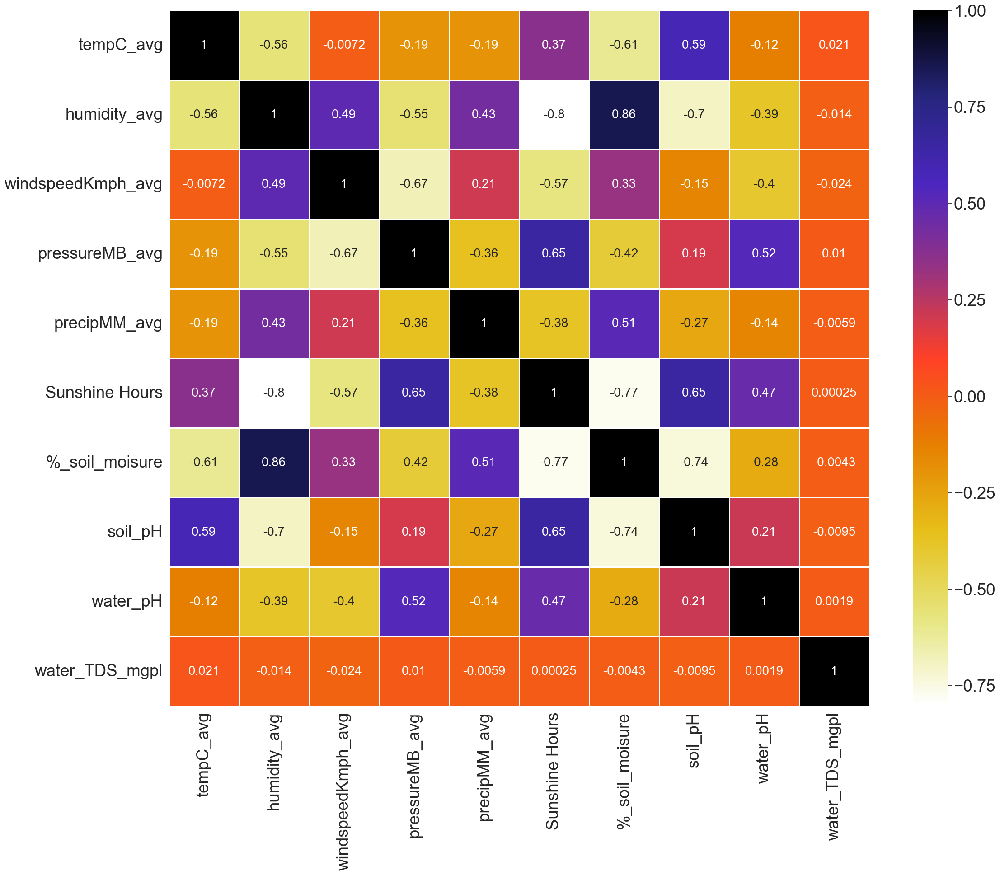

In [40]:
#Using Pearson Correlation
plt.figure(figsize=(25,20))
cor = X_train.corr()
sns.set(font_scale=2.4)

sns.heatmap(cor, annot=True, cmap=plt.cm.CMRmap_r, linewidths=1, linecolor='white',annot_kws={"size": 20})
plt.savefig('heatmap.jpeg', dpi=500, bbox_inches='tight', facecolor='grey', edgecolor='blue',)
plt.show()

In [41]:
# with the following function we can select highly correlated features
# it will remove the first feature that is correlated with anything other feature

def correlation(dataset, threshold):
    col_corr = set()  # Set of all the names of correlated columns
    corr_matrix = dataset.corr()
    for i in range(len(corr_matrix.columns)):
        for j in range(i):
            if abs(corr_matrix.iloc[i, j]) > threshold: # we are interested in absolute coeff value
                colname = corr_matrix.columns[i]  # getting the name of column
                col_corr.add(colname)
    return col_corr

In [42]:
corr_features = correlation(X_train, 0.85)
len(set(corr_features))

1

In [43]:
corr_features

{'%_soil_moisure'}

In [44]:
X_train.drop(corr_features,axis=1)
X_test.drop(corr_features,axis=1)

,tempC_avg,humidity_avg,windspeedKmph_avg,pressureMB_avg,precipMM_avg,weatherDesc_7to8,weatherDesc_1to2,weatherDesc_6to7,Sunshine Hours,soil_pH,water_pH,water_TDS_mgpl
800,32,23,14,1009,0.000000,Partly cloudy,Sunny,Clear,11.200000,7.2,7.5,1710.0
1172,31,25,12,1010,0.000000,Cloudy,Partly cloudy,Partly cloudy,8.303853,7.1,7.6,1709.0
265,29,53,6,1009,0.500000,Sunny,Sunny,Moderate or heavy rain shower,9.100000,7.0,7.4,1710.0
1087,25,33,10,1011,0.000000,Sunny,Sunny,Clear,8.303853,7.0,7.5,1710.0
858,22,78,17,1007,1.366667,Moderate rain at times,Patchy light rain,Heavy rain,6.200000,7.2,7.4,1708.0
...,...,...,...,...,...,...,...,...,...,...,...,...
342,21,29,10,1016,0.000000,Sunny,Sunny,Clear,9.600000,7.1,7.5,1709.0
1182,30,37,10,1009,0.100000,Partly cloudy,Partly cloudy,Patchy rain possible,8.303853,7.2,7.6,1709.0
70,28,14,12,1010,0.000000,Sunny,Sunny,Clear,10.700000,7.2,7.4,1709.0
181,26,75,22,1004,0.133333,Light rain shower,Light rain shower,Patchy rain possible,3.800000,7.0,7.2,1707.0


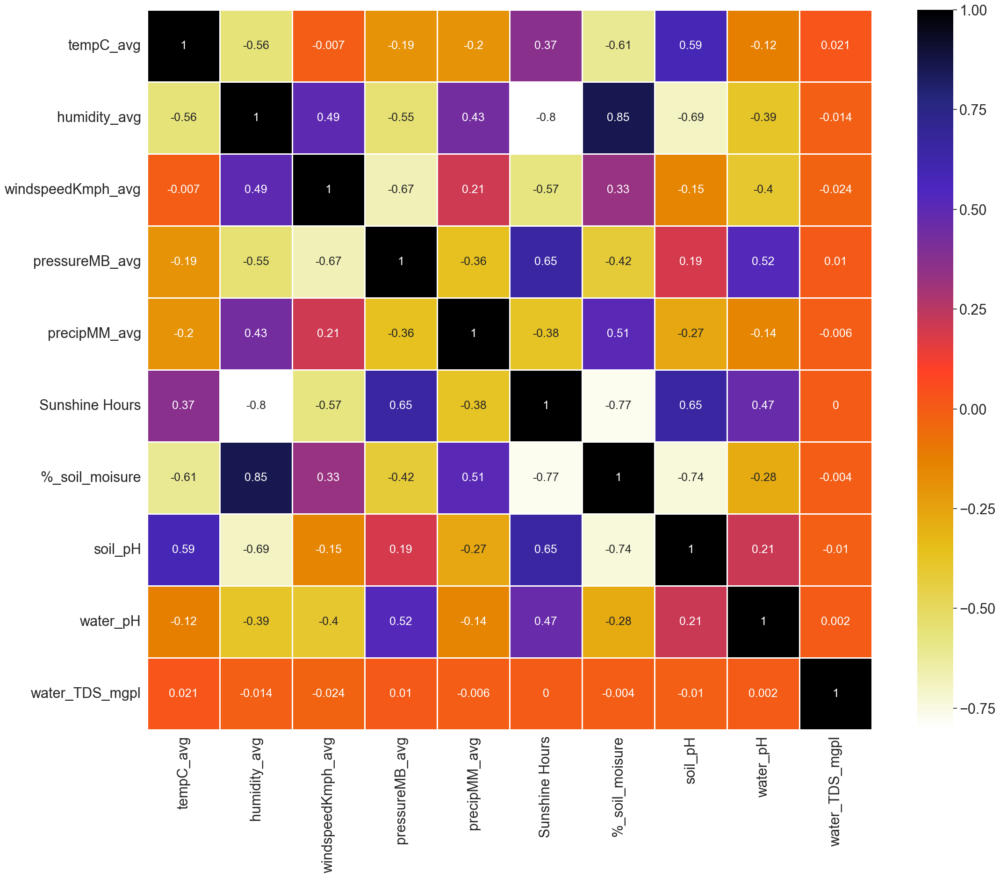

In [47]:
#Using Pearson Correlation
plt.figure(figsize=(25,20))
cor = X_train.corr()
sns.set(font_scale=2)

sns.heatmap(round(cor,3), annot=True, cmap=plt.cm.CMRmap_r, linewidths=1, linecolor='white',annot_kws={"size": 18})
# plt.savefig('heatmap1.jpeg', dpi=500, bbox_inches='tight', facecolor='grey', edgecolor='blue',)
plt.show()

# Test 2

In [48]:
X = df[['tempC_7to8', 'tempC_1to2', 'tempC_6to7', 'tempC_avg',
       'Relative humidity_7to8', 'humidity_1to2', 'humidity_6to7',
       'humidity_avg', 'windspeedKmph_7to8', 'windspeedKmph_1to2',
       'windspeedKmph_6to7', 'windspeedKmph_avg', 'pressureMB_7to8',
       'pressureMB_1to2', 'pressureMB_6to7', 'pressureMB_avg', 'precipMM_7to8',
       'precipMM_1to2', 'precipMM_6to7', 'precipMM_avg', 'weatherDesc_7to8',
       'weatherDesc_1to2', 'weatherDesc_6to7', 'Sunshine Hours',
       '%_soil_moisure', 'soil_pH', 'water_pH', 'water_TDS_mgpl']]
y = df['Label (Disease Yes_No)']

In [49]:
X.head(3)

,tempC_7to8,tempC_1to2,tempC_6to7,tempC_avg,Relative humidity_7to8,humidity_1to2,humidity_6to7,humidity_avg,windspeedKmph_7to8,windspeedKmph_1to2,...,precipMM_6to7,precipMM_avg,weatherDesc_7to8,weatherDesc_1to2,weatherDesc_6to7,Sunshine Hours,%_soil_moisure,soil_pH,water_pH,water_TDS_mgpl
0,22,26,20,22,38,28,44,36,5,11,...,0.0,0.0,Sunny,Sunny,Clear,9.8,44,7.2,7.6,1709.0
1,21,28,21,23,39,25,38,34,10,4,...,0.0,0.0,Sunny,Sunny,Clear,9.8,43,7.2,7.6,1708.0
2,20,28,22,23,41,27,45,37,12,5,...,0.0,0.0,Sunny,Sunny,Clear,9.8,42,7.2,7.6,1707.0


In [50]:
X.isnull().sum()

tempC_7to8                  0
tempC_1to2                  0
tempC_6to7                  0
tempC_avg                   0
Relative humidity_7to8      0
humidity_1to2               0
humidity_6to7               0
humidity_avg                0
windspeedKmph_7to8          0
windspeedKmph_1to2          0
windspeedKmph_6to7          0
windspeedKmph_avg           0
pressureMB_7to8             0
pressureMB_1to2             0
pressureMB_6to7             0
pressureMB_avg              0
precipMM_7to8               0
precipMM_1to2               0
precipMM_6to7               0
precipMM_avg                0
weatherDesc_7to8            0
weatherDesc_1to2            0
weatherDesc_6to7            0
Sunshine Hours            126
%_soil_moisure              0
soil_pH                     0
water_pH                    0
water_TDS_mgpl              0
dtype: int64

In [51]:
X['Sunshine Hours'].fillna(X['Sunshine Hours'].mean(), inplace = True)
X.isnull().sum()

C:\Users\munge\AppData\Local\Temp\ipykernel_20912\2292408368.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X['Sunshine Hours'].fillna(X['Sunshine Hours'].mean(), inplace = True)


tempC_7to8                0
tempC_1to2                0
tempC_6to7                0
tempC_avg                 0
Relative humidity_7to8    0
humidity_1to2             0
humidity_6to7             0
humidity_avg              0
windspeedKmph_7to8        0
windspeedKmph_1to2        0
windspeedKmph_6to7        0
windspeedKmph_avg         0
pressureMB_7to8           0
pressureMB_1to2           0
pressureMB_6to7           0
pressureMB_avg            0
precipMM_7to8             0
precipMM_1to2             0
precipMM_6to7             0
precipMM_avg              0
weatherDesc_7to8          0
weatherDesc_1to2          0
weatherDesc_6to7          0
Sunshine Hours            0
%_soil_moisure            0
soil_pH                   0
water_pH                  0
water_TDS_mgpl            0
dtype: int64

In [52]:
# separate dataset into train and test
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, stratify=y) # random_state=0,

X_train.shape, X_test.shape

((833, 28), (357, 28))

In [53]:
X_train.corr()

,tempC_7to8,tempC_1to2,tempC_6to7,tempC_avg,Relative humidity_7to8,humidity_1to2,humidity_6to7,humidity_avg,windspeedKmph_7to8,windspeedKmph_1to2,...,pressureMB_avg,precipMM_7to8,precipMM_1to2,precipMM_6to7,precipMM_avg,Sunshine Hours,%_soil_moisure,soil_pH,water_pH,water_TDS_mgpl
tempC_7to8,1.000000,0.746797,0.490734,0.827579,-0.282355,-0.192720,-0.105103,-0.194393,0.076632,0.057655,...,-0.353058,-0.057413,-0.051990,-0.041373,-0.056244,0.118010,-0.288333,0.404121,-0.331942,0.030824
tempC_1to2,0.746797,1.000000,0.816298,0.959793,-0.669941,-0.709361,-0.638548,-0.686847,-0.227963,-0.203511,...,-0.001486,-0.189072,-0.305488,-0.212846,-0.271208,0.546645,-0.721489,0.694293,0.038659,0.055136
tempC_6to7,0.490734,0.816298,1.000000,0.870707,-0.448750,-0.534655,-0.560167,-0.528026,-0.128967,-0.066489,...,-0.180865,-0.100743,-0.199668,-0.120895,-0.157889,0.331119,-0.563316,0.465749,0.072354,0.024937
tempC_avg,0.827579,0.959793,0.870707,1.000000,-0.527463,-0.543911,-0.496404,-0.533575,-0.109542,-0.083120,...,-0.198109,-0.127704,-0.213690,-0.141535,-0.183039,0.375454,-0.592293,0.585471,-0.075932,0.043982
Relative humidity_7to8,-0.282355,-0.669941,-0.448750,-0.527463,1.000000,0.932199,0.907844,0.965570,0.501280,0.494054,...,-0.528162,0.212482,0.362330,0.311484,0.363378,-0.758441,0.786579,-0.656475,-0.370373,-0.055769
humidity_1to2,-0.192720,-0.709361,-0.534655,-0.543911,0.932199,1.000000,0.966344,0.988067,0.534641,0.493726,...,-0.557342,0.249206,0.441428,0.350715,0.418599,-0.836944,0.879292,-0.706297,-0.438628,-0.063392
humidity_6to7,-0.105103,-0.638548,-0.560167,-0.496404,0.907844,0.966344,1.000000,0.980830,0.493814,0.460967,...,-0.542228,0.203739,0.389878,0.322197,0.375093,-0.793152,0.834039,-0.664099,-0.469969,-0.058355
humidity_avg,-0.194393,-0.686847,-0.528026,-0.533575,0.965570,0.988067,0.980830,1.000000,0.520505,0.492591,...,-0.554215,0.226804,0.406875,0.335343,0.394249,-0.814174,0.852366,-0.690526,-0.436696,-0.060726
windspeedKmph_7to8,0.076632,-0.227963,-0.128967,-0.109542,0.501280,0.534641,0.493814,0.520505,1.000000,0.843938,...,-0.550914,0.168144,0.209178,0.087588,0.151272,-0.582429,0.373363,-0.229582,-0.388830,-0.047790
windspeedKmph_1to2,0.057655,-0.203511,-0.066489,-0.083120,0.494054,0.493726,0.460967,0.492591,0.843938,1.000000,...,-0.579378,0.138127,0.173685,0.074837,0.126835,-0.537665,0.311174,-0.208848,-0.369741,-0.053651


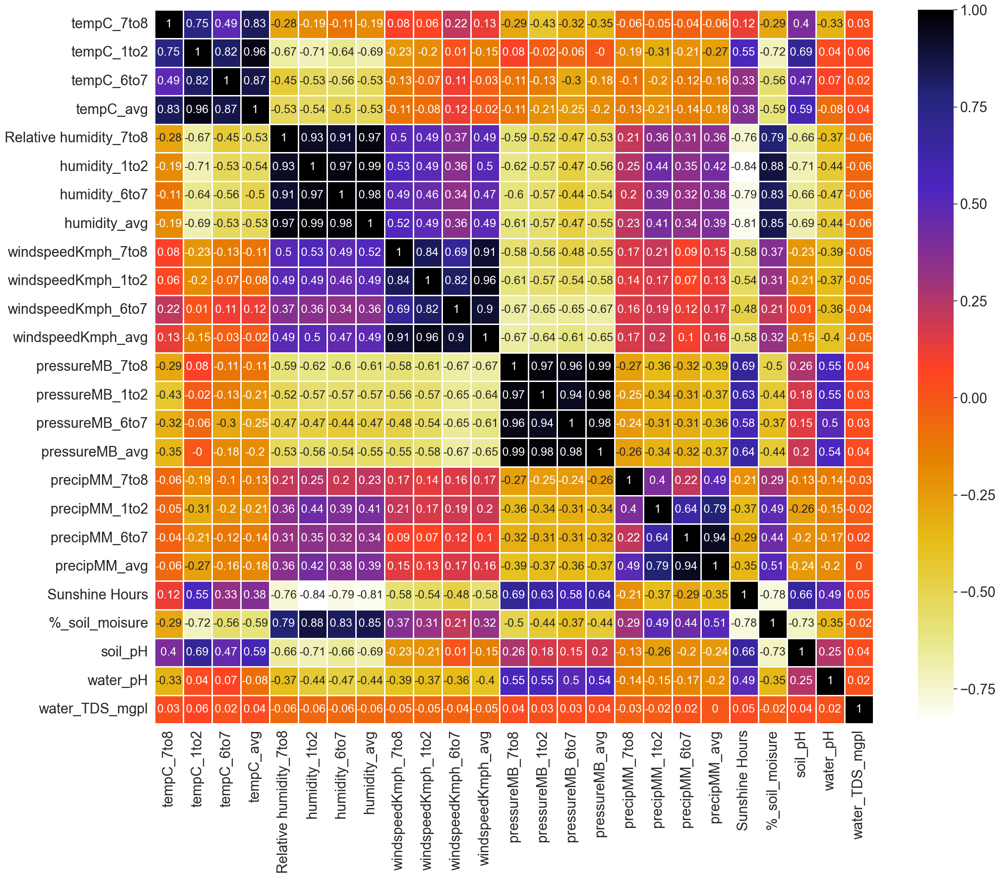

In [55]:
#Using Pearson Correlation
plt.figure(figsize=(25,20))
cor = X_train.corr()
sns.set(font_scale=2)

sns.heatmap(round(cor,2), annot=True, cmap=plt.cm.CMRmap_r, linewidths=1, linecolor='white',annot_kws={"size": 18})
plt.savefig('heatmap1.jpeg', dpi=500, bbox_inches='tight', facecolor='grey', edgecolor='blue',)
plt.show()

In [56]:
# with the following function we can select highly correlated features
# it will remove the first feature that is correlated with anything other feature

def correlation(dataset, threshold):
    col_corr = set()  # Set of all the names of correlated columns
    corr_matrix = dataset.corr()
    for i in range(len(corr_matrix.columns)):
        for j in range(i):
            if abs(corr_matrix.iloc[i, j]) > threshold: # we are interested in absolute coeff value
                colname = corr_matrix.columns[i]  # getting the name of column
                col_corr.add(colname)
    return col_corr

In [57]:
corr_features = correlation(X_train, 0.85)
len(set(corr_features))

10

In [58]:
corr_features

{'%_soil_moisure',
 'humidity_1to2',
 'humidity_6to7',
 'humidity_avg',
 'precipMM_avg',
 'pressureMB_1to2',
 'pressureMB_6to7',
 'pressureMB_avg',
 'tempC_avg',
 'windspeedKmph_avg'}

In [59]:
X_train.drop(corr_features,axis=1)
X_test.drop(corr_features,axis=1)

,tempC_7to8,tempC_1to2,tempC_6to7,Relative humidity_7to8,windspeedKmph_7to8,windspeedKmph_1to2,windspeedKmph_6to7,pressureMB_7to8,precipMM_7to8,precipMM_1to2,precipMM_6to7,weatherDesc_7to8,weatherDesc_1to2,weatherDesc_6to7,Sunshine Hours,soil_pH,water_pH,water_TDS_mgpl
590,25,27,23,86,18,25,28,1003,0.0,1.2,0.1,Overcast,Moderate or heavy rain shower,Light rain shower,3.900000,7.0,7.5,1710.00
503,29,35,29,62,23,28,25,1007,0.0,0.0,0.0,Sunny,Sunny,Clear,6.200000,7.1,7.1,1709.00
546,27,29,25,73,27,28,25,1007,0.1,0.2,0.1,Light rain shower,Light rain shower,Patchy rain possible,3.800000,7.0,7.4,1709.00
483,30,37,30,39,16,20,23,1009,0.0,0.0,0.0,Sunny,Sunny,Clear,10.400000,7.2,7.2,1710.00
289,27,31,26,40,15,10,9,1015,0.0,0.0,0.0,Sunny,Partly cloudy,Clear,9.100000,7.0,7.4,1710.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
188,24,25,23,86,23,25,28,1002,0.4,0.0,0.2,Light rain,Patchy rain possible,Light drizzle,3.800000,7.0,7.2,1709.00
991,23,28,25,77,6,11,12,1008,0.0,0.0,0.1,Partly cloudy,Partly cloudy,Mist,9.100000,7.0,7.4,1710.00
633,25,28,23,63,13,22,14,1014,0.0,0.0,0.0,Sunny,Sunny,Clear,9.100000,7.0,7.5,1631.15
353,17,25,18,29,12,12,12,1019,0.0,0.0,0.0,Sunny,Sunny,Clear,9.600000,7.1,7.5,1625.45


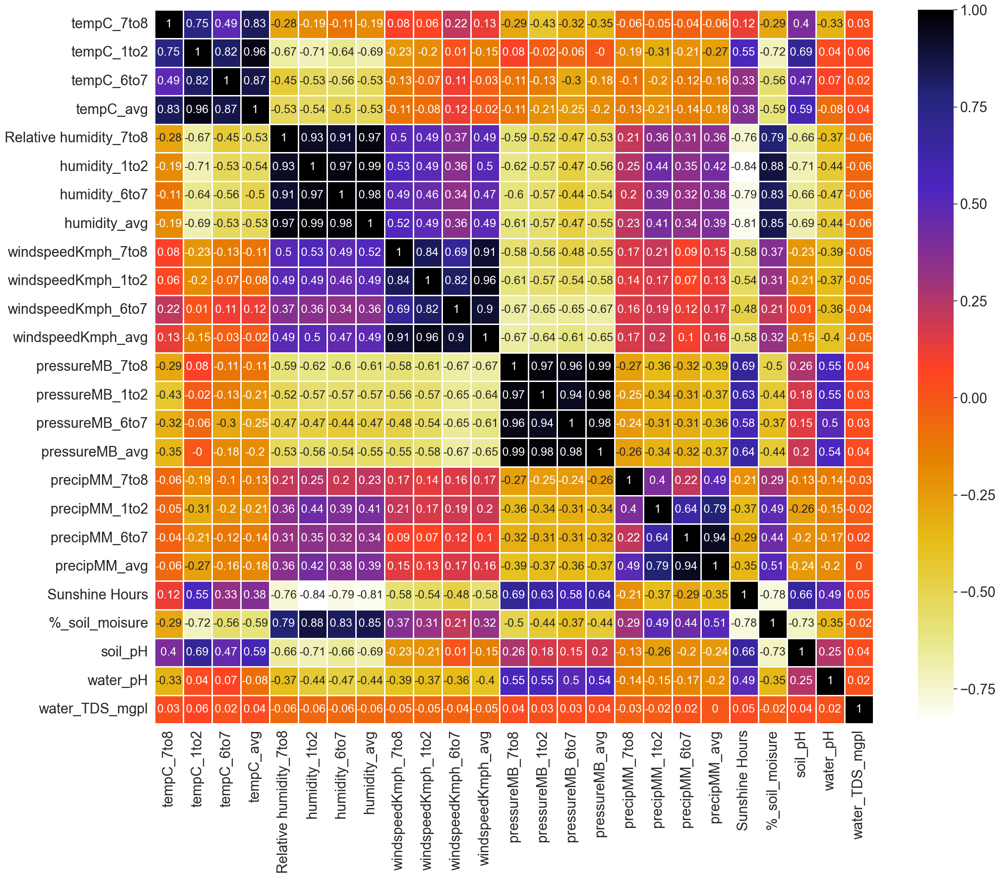

In [61]:
#Using Pearson Correlation
plt.figure(figsize=(25,20))
cor = X_train.corr()
sns.set(font_scale=2)

sns.heatmap(round(cor,2), annot=True, cmap=plt.cm.CMRmap_r, linewidths=1, linecolor='white',annot_kws={"size": 18})
# plt.savefig('heatmap1.jpeg', dpi=500, bbox_inches='tight', facecolor='grey', edgecolor='blue',)
plt.show()

# FEATURE SELECTION

- Information gain - mutual information

#### I(X ; Y) = H(X) – H(X | Y) Where I(X ; Y) is the mutual information for X and Y, H(X) is the entropy for X and H(X | Y) is the conditional entropy for X given Y. The result has the units of bits.

In [62]:
# Train test split to avoid overfitting
X = df[['tempC_avg', 'humidity_avg', 'windspeedKmph_avg', 'pressureMB_avg', 'precipMM_avg', 
        'Sunshine Hours', 
        '%_soil_moisure', 'soil_pH', 'water_pH', 'water_TDS_mgpl']]
y = df['Label (Disease Yes_No)']

X.isnull().sum()

tempC_avg              0
humidity_avg           0
windspeedKmph_avg      0
pressureMB_avg         0
precipMM_avg           0
Sunshine Hours       126
%_soil_moisure         0
soil_pH                0
water_pH               0
water_TDS_mgpl         0
dtype: int64

In [63]:
X['Sunshine Hours'].fillna(X['Sunshine Hours'].mean(), inplace = True)
X.isnull().sum()

C:\Users\munge\AppData\Local\Temp\ipykernel_20912\2292408368.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X['Sunshine Hours'].fillna(X['Sunshine Hours'].mean(), inplace = True)


tempC_avg            0
humidity_avg         0
windspeedKmph_avg    0
pressureMB_avg       0
precipMM_avg         0
Sunshine Hours       0
%_soil_moisure       0
soil_pH              0
water_pH             0
water_TDS_mgpl       0
dtype: int64

In [64]:
# separate dataset into train and test
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, stratify=y) # random_state=0,

X_train.shape, X_test.shape

((833, 10), (357, 10))

In [65]:
from sklearn.feature_selection import mutual_info_classif
# determine the mutual information
mutual_info = mutual_info_classif(X_train, y_train)
mutual_info

array([0.08690023, 0.25407302, 0.13644898, 0.16980746, 0.2292524 ,
       0.24227593, 0.2496172 , 0.08942809, 0.05429214, 0.00688142])

In [66]:
mutual_info = pd.Series(mutual_info)
mutual_info.index = X_train.columns
mutual_info.sort_values(ascending=False)

humidity_avg         0.254073
%_soil_moisure       0.249617
Sunshine Hours       0.242276
precipMM_avg         0.229252
pressureMB_avg       0.169807
windspeedKmph_avg    0.136449
soil_pH              0.089428
tempC_avg            0.086900
water_pH             0.054292
water_TDS_mgpl       0.006881
dtype: float64

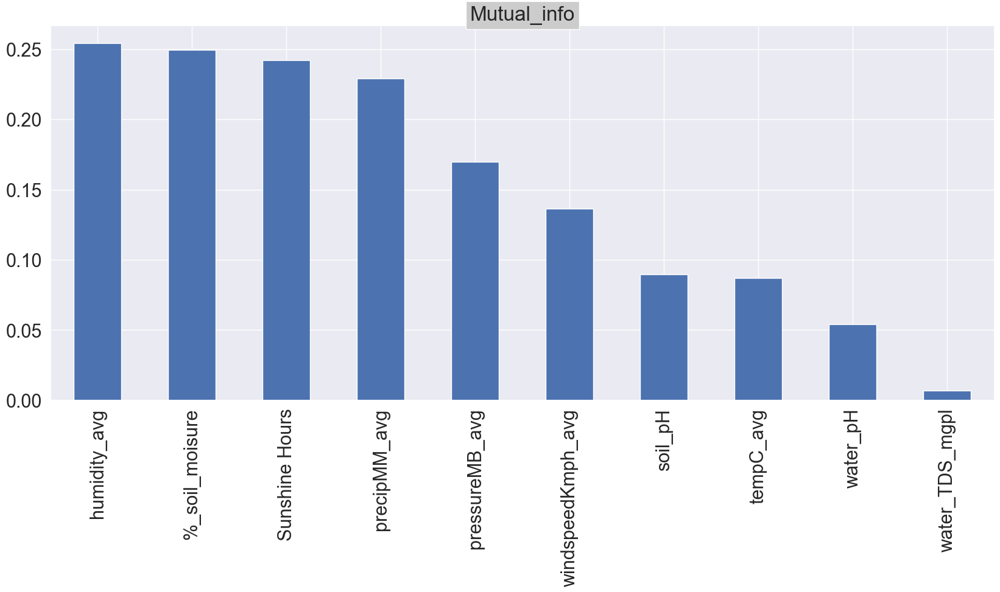

In [67]:
title('Mutual_info', bbox={'facecolor': '0.8', 'pad': 5})
#let's plot the ordered mutual_info values per feature
mutual_info.sort_values(ascending=False).plot.bar(figsize=(20, 8))
plt.savefig('mutual_info_classif.jpeg', dpi=500, bbox_inches='tight') # , facecolor='grey', edgecolor='blue',

In [68]:
from sklearn.feature_selection import SelectKBest

#No we Will select the  top 5 important features
sel_five_cols = SelectKBest(mutual_info_classif, k=5)
sel_five_cols.fit(X_train, y_train)
print(sel_five_cols)
X_train.columns[sel_five_cols.get_support()]

SelectKBest(k=5,
            score_func=<function mutual_info_classif at 0x000001DAE570C160>)


Index(['humidity_avg', 'pressureMB_avg', 'precipMM_avg', 'Sunshine Hours',
       '%_soil_moisure'],
      dtype='object')

# FEATURE SELECTION

- Fisher Score - Chisquare Test 

In [69]:
# Train test split to avoid overfitting
X = df[['tempC_avg', 'humidity_avg', 'windspeedKmph_avg', 'pressureMB_avg', 'precipMM_avg', 
        'Sunshine Hours', 
        '%_soil_moisure', 'soil_pH', 'water_pH', 'water_TDS_mgpl']]
y = df['Label (Disease Yes_No)']

X.isnull().sum()

tempC_avg              0
humidity_avg           0
windspeedKmph_avg      0
pressureMB_avg         0
precipMM_avg           0
Sunshine Hours       126
%_soil_moisure         0
soil_pH                0
water_pH               0
water_TDS_mgpl         0
dtype: int64

In [70]:
X['Sunshine Hours'].fillna(X['Sunshine Hours'].mean(), inplace = True)
X.isnull().sum()

C:\Users\munge\AppData\Local\Temp\ipykernel_20912\2292408368.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X['Sunshine Hours'].fillna(X['Sunshine Hours'].mean(), inplace = True)


tempC_avg            0
humidity_avg         0
windspeedKmph_avg    0
pressureMB_avg       0
precipMM_avg         0
Sunshine Hours       0
%_soil_moisure       0
soil_pH              0
water_pH             0
water_TDS_mgpl       0
dtype: int64

In [71]:
# separate dataset into train and test
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, stratify=y) # random_state=0,

X_train.shape, X_test.shape

((833, 10), (357, 10))

In [72]:
## Perform chi2 test
### chi2 returns 2 values
### Fscore and the pvalue
from sklearn.feature_selection import chi2
f_p_values=chi2(X_train,y_train)
f_p_values

(array([1.72040935e+01, 4.75184367e+03, 5.57943887e+02, 4.27989083e+00,
        1.51749541e+02, 2.32045869e+02, 9.21174740e+02, 1.46260583e-01,
        2.33737949e-01, 1.27981853e-01]),
 array([3.35712195e-005, 0.00000000e+000, 2.35447597e-123, 3.85658251e-002,
        7.18730347e-035, 2.13393473e-052, 2.44762909e-202, 7.02134803e-001,
        6.28765941e-001, 7.20533768e-001]))

In [73]:
p_values=pd.Series(f_p_values[1])
p_values.index=X_train.columns
p_values

tempC_avg             3.357122e-05
humidity_avg          0.000000e+00
windspeedKmph_avg    2.354476e-123
pressureMB_avg        3.856583e-02
precipMM_avg          7.187303e-35
Sunshine Hours        2.133935e-52
%_soil_moisure       2.447629e-202
soil_pH               7.021348e-01
water_pH              6.287659e-01
water_TDS_mgpl        7.205338e-01
dtype: float64

In [74]:
p_values.sort_index(ascending=False)

windspeedKmph_avg    2.354476e-123
water_pH              6.287659e-01
water_TDS_mgpl        7.205338e-01
tempC_avg             3.357122e-05
soil_pH               7.021348e-01
pressureMB_avg        3.856583e-02
precipMM_avg          7.187303e-35
humidity_avg          0.000000e+00
Sunshine Hours        2.133935e-52
%_soil_moisure       2.447629e-202
dtype: float64

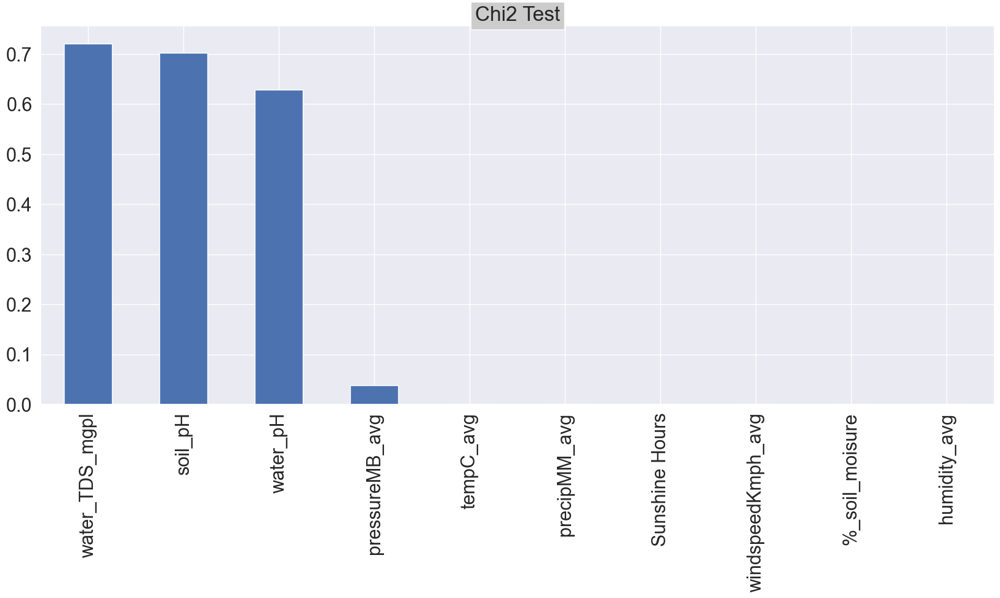

In [75]:
# giving labels to x-axis and y-axis
# sns.set(xlabel ='Labels', ylabel ='p_values')
title('Chi2 Test', bbox={'facecolor': '0.8', 'pad': 5})
#let's plot the ordered p_values per feature
p_values.sort_values(ascending=False).plot.bar(figsize=(20, 8))
plt.savefig('p_values.jpeg', dpi=500, bbox_inches='tight') # , facecolor='grey', edgecolor='blue',

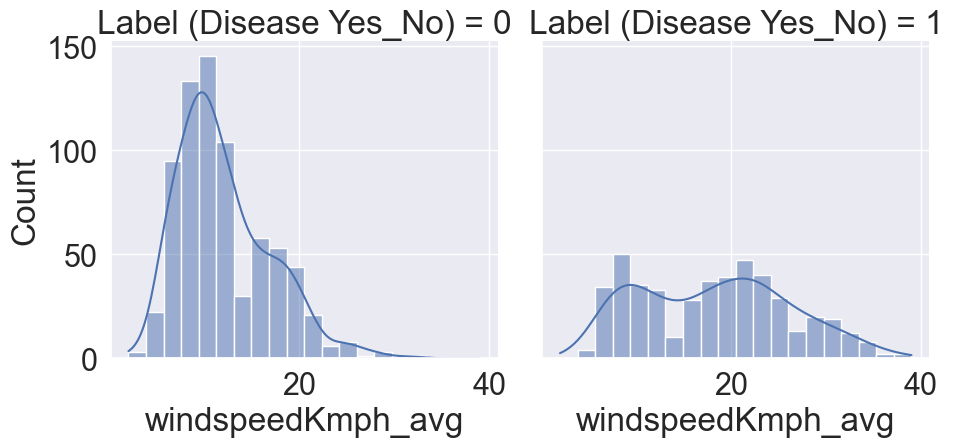

In [76]:
sns.displot(data=df, x="windspeedKmph_avg", col="Label (Disease Yes_No)", kde=True)

C:\Users\munge\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\categorical.py:3544: UserWarning: 24.1% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
C:\Users\munge\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\categorical.py:3544: UserWarning: 19.7% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
C:\Users\munge\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\categorical.py:3544: UserWarning: 20.0% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
C:\Users\munge\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\categorical.py:3544: UserWarning: 33.1% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(ms

<Figure size 800x400 with 0 Axes>

C:\Users\munge\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\categorical.py:3544: UserWarning: 39.6% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
C:\Users\munge\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\categorical.py:3544: UserWarning: 35.8% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
C:\Users\munge\AppData\Local\Programs\Python\Python310\lib\site-packages\seaborn\categorical.py:3544: UserWarning: 44.4% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


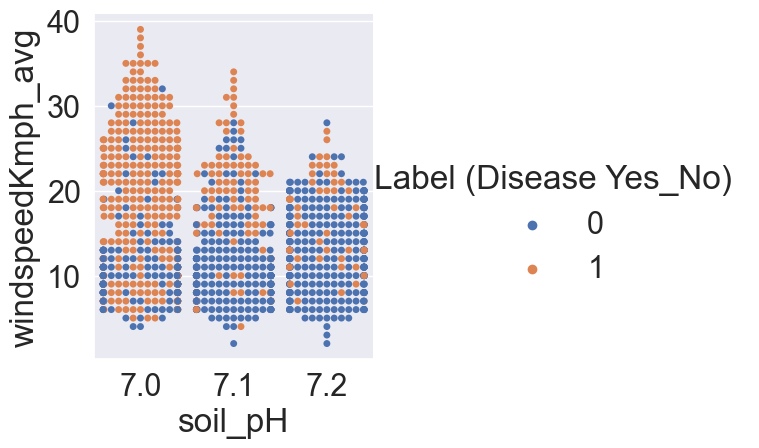

In [79]:
plt.figure(figsize=(8,4))
sns.catplot(data=df, kind="swarm", x="soil_pH", y="windspeedKmph_avg", hue="Label (Disease Yes_No)")
plt.show()

<Figure size 1200x600 with 0 Axes>

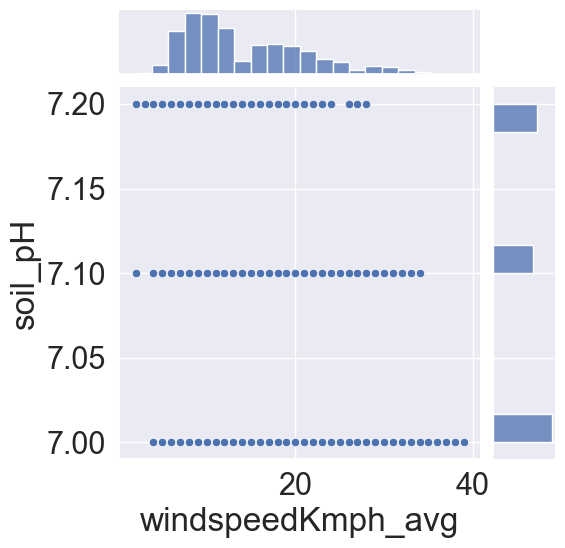

In [80]:
plt.figure(figsize=(12,6))
sns.jointplot(data=df, x="windspeedKmph_avg", y="soil_pH")

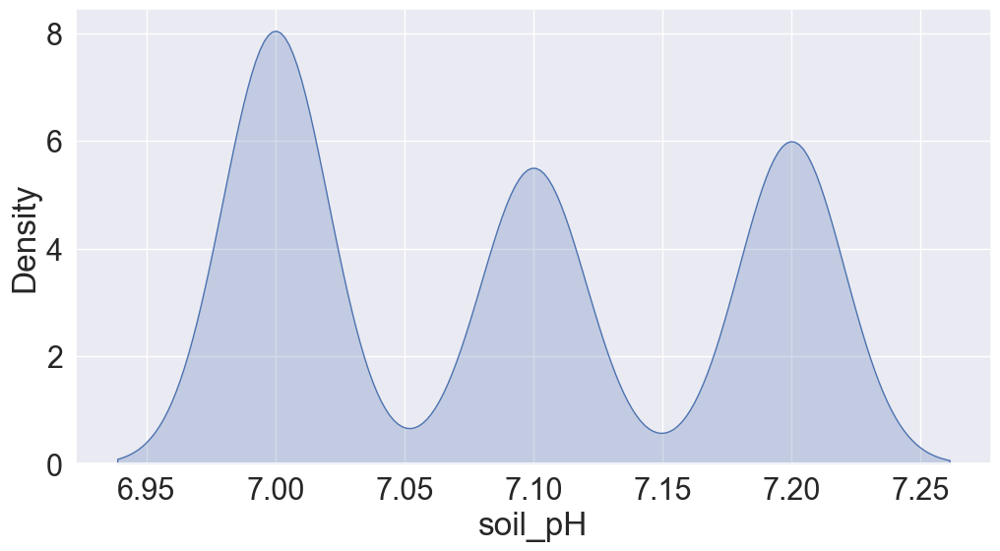

In [81]:
plt.figure(figsize=(12,6))
# plotting both distibutions on the same figure
# fig = sns.kdeplot(df['windspeedKmph_avg'], shade=True, color="r")
fig = sns.kdeplot(df['soil_pH'], shade=True, color="b")
plt.show()

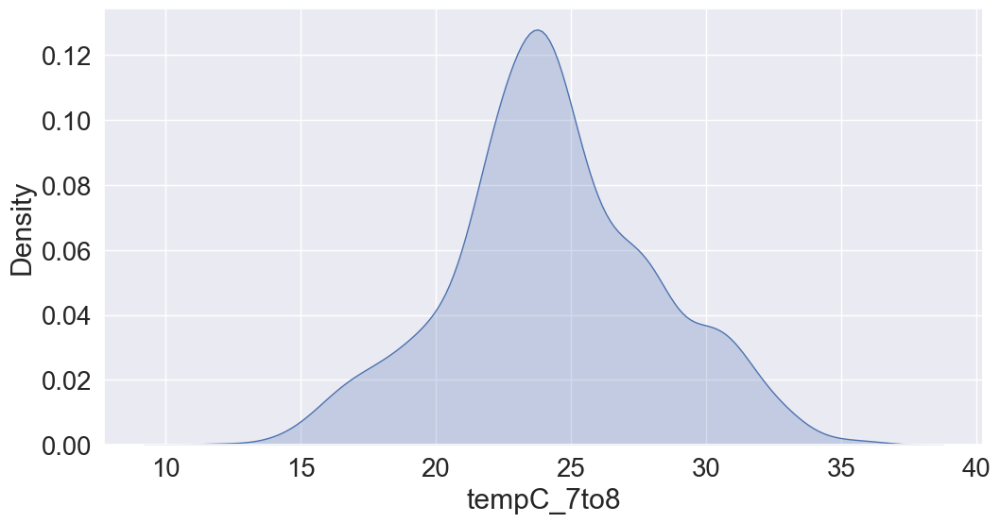

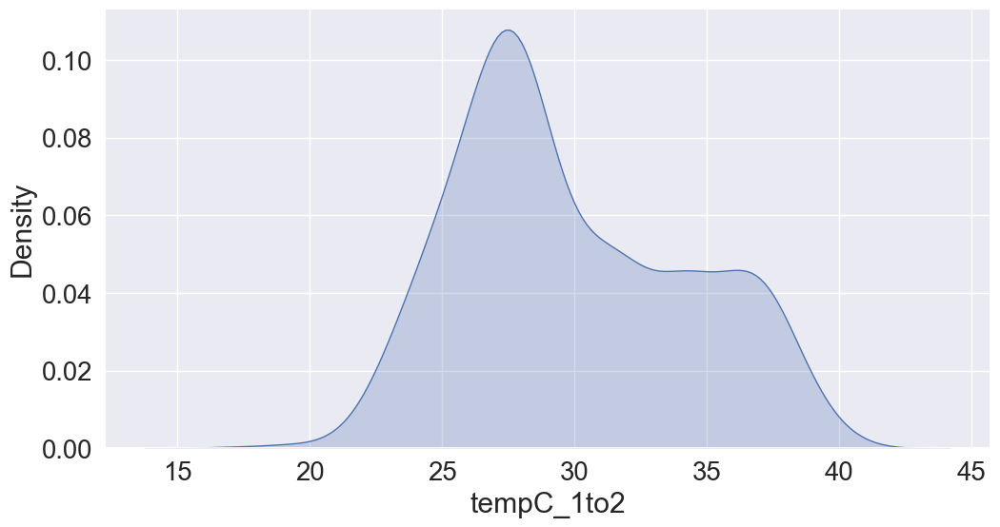

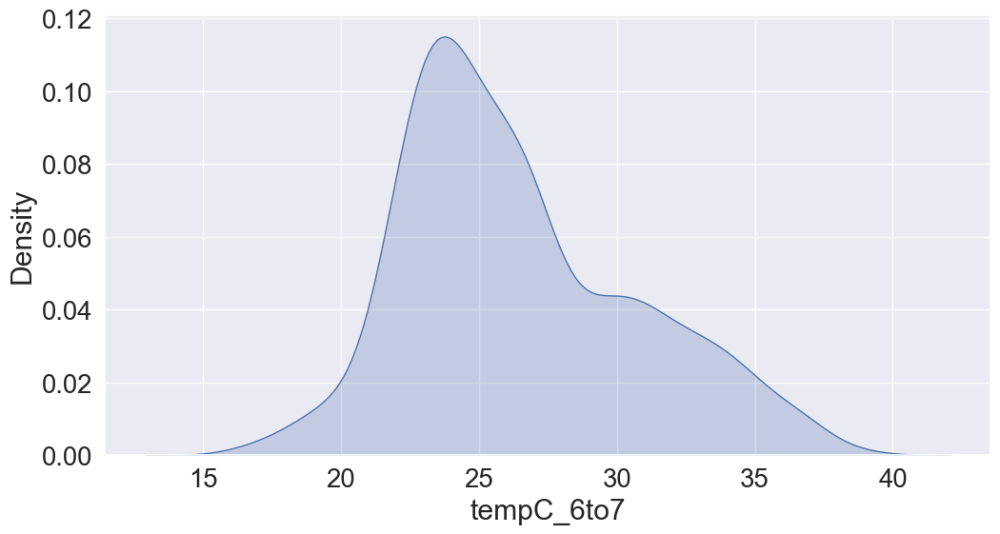

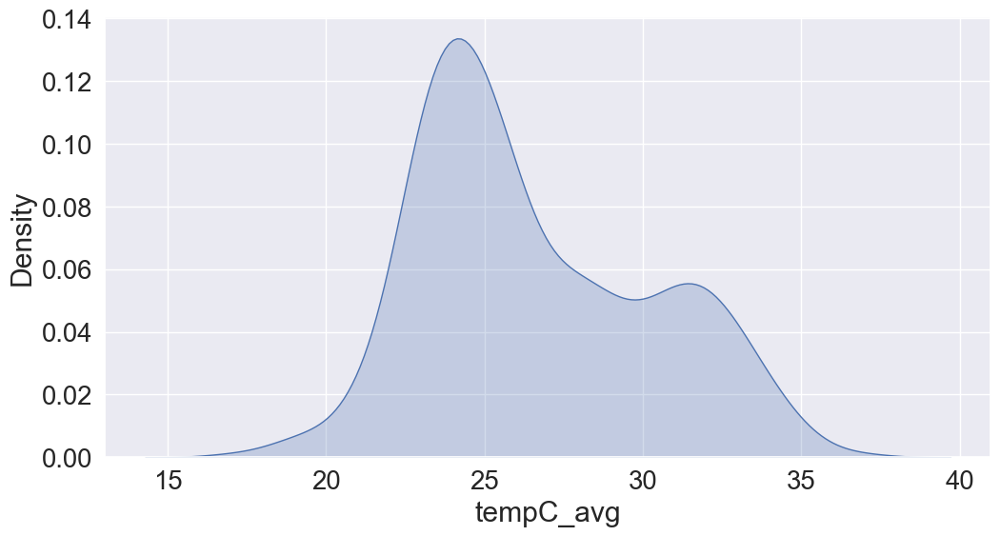

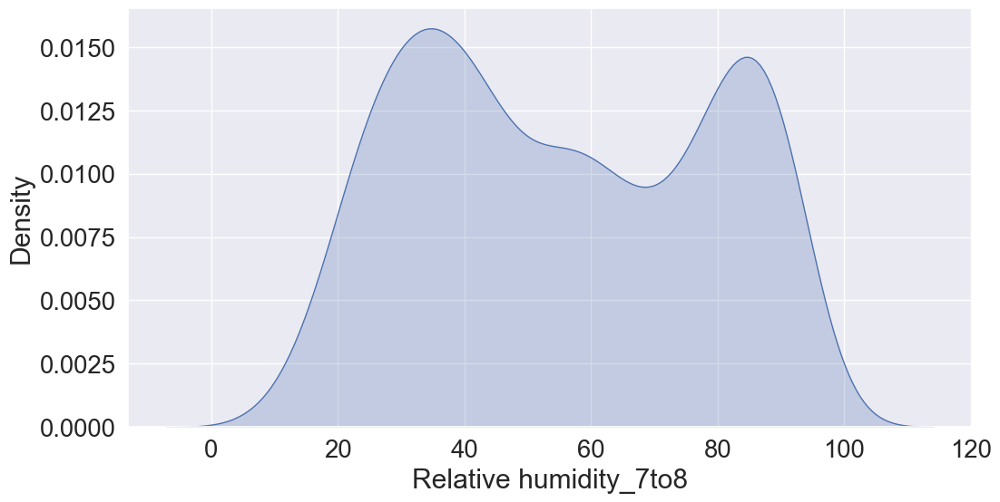

...

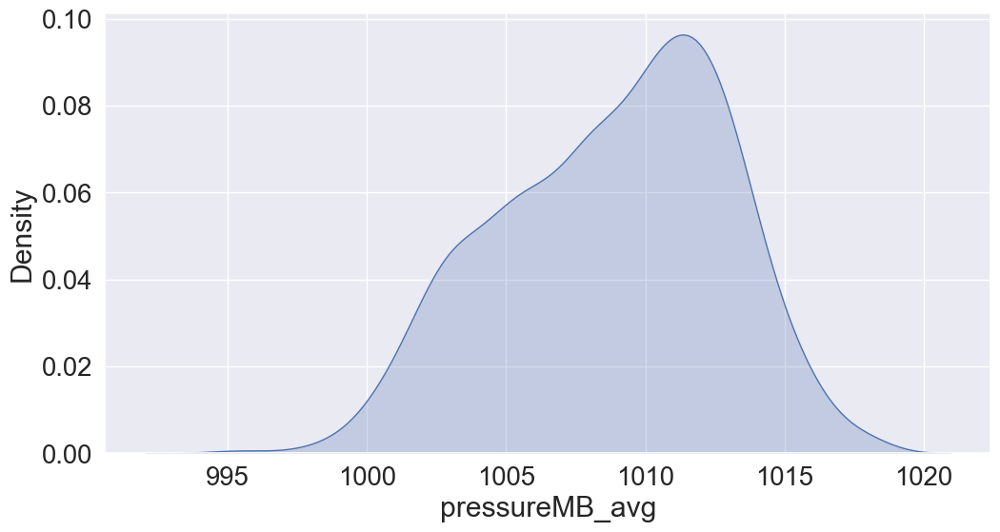

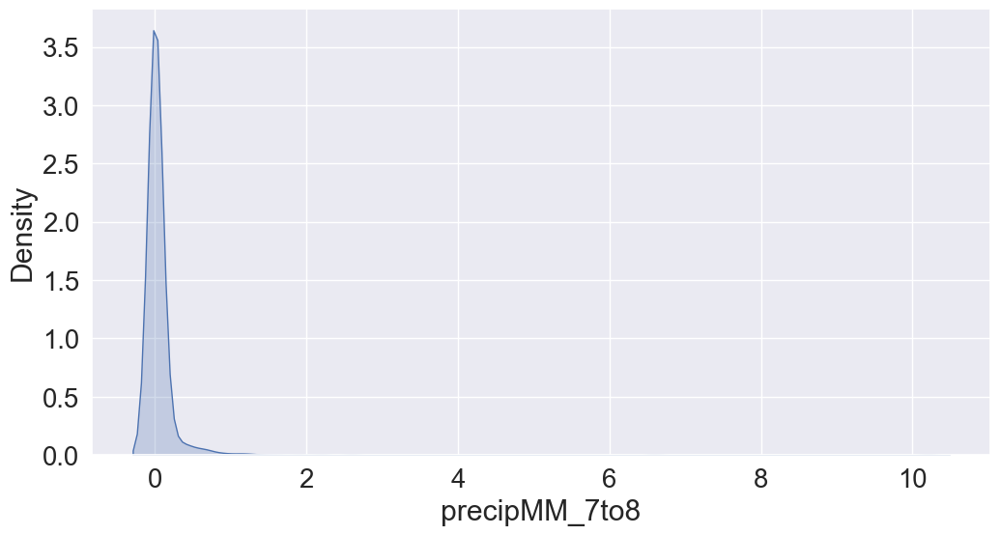

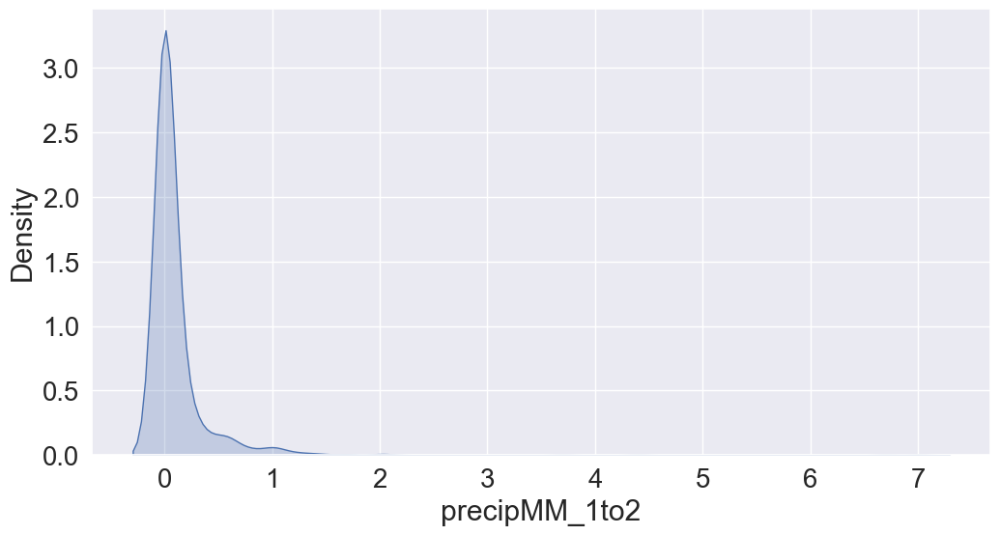

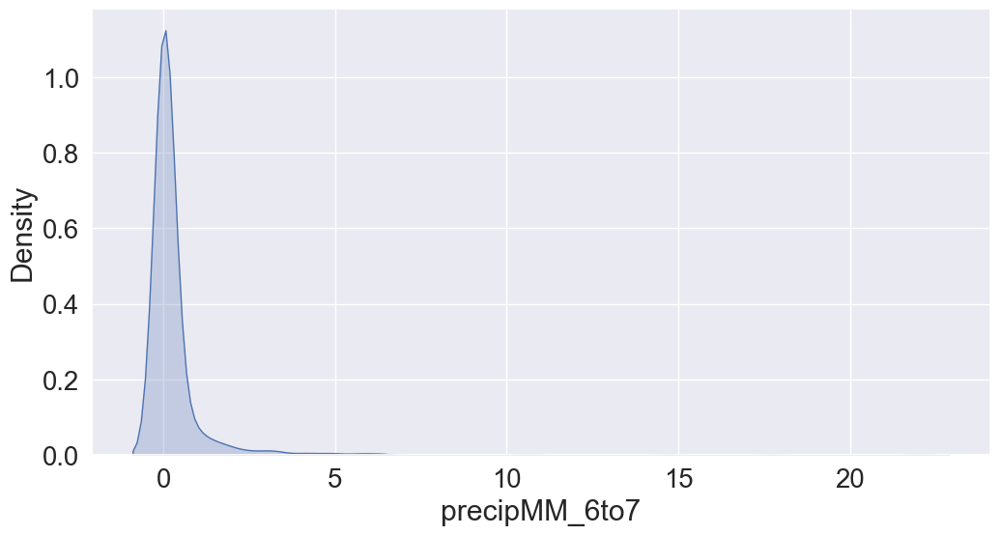

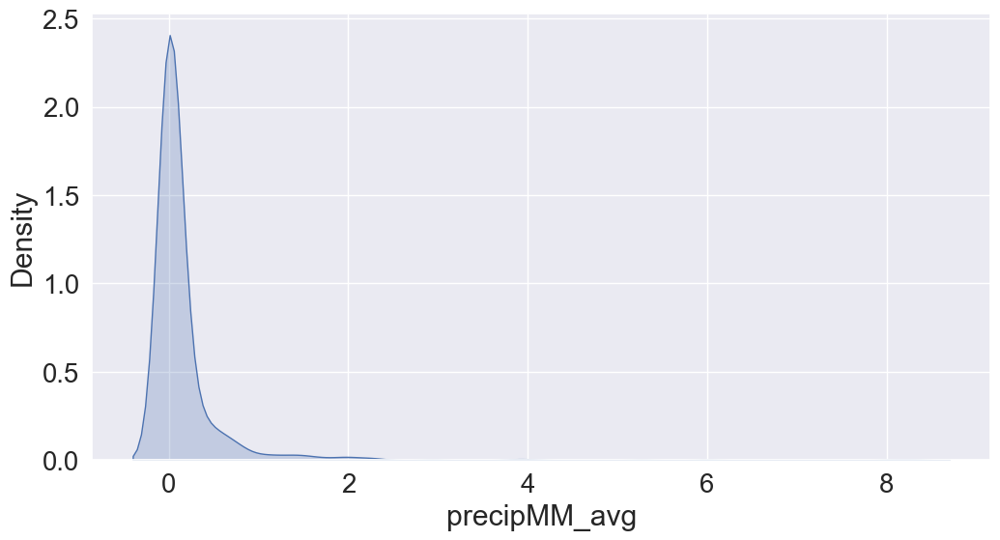

TypeError: The x variable is categorical, but one of ['numeric', 'datetime'] is required

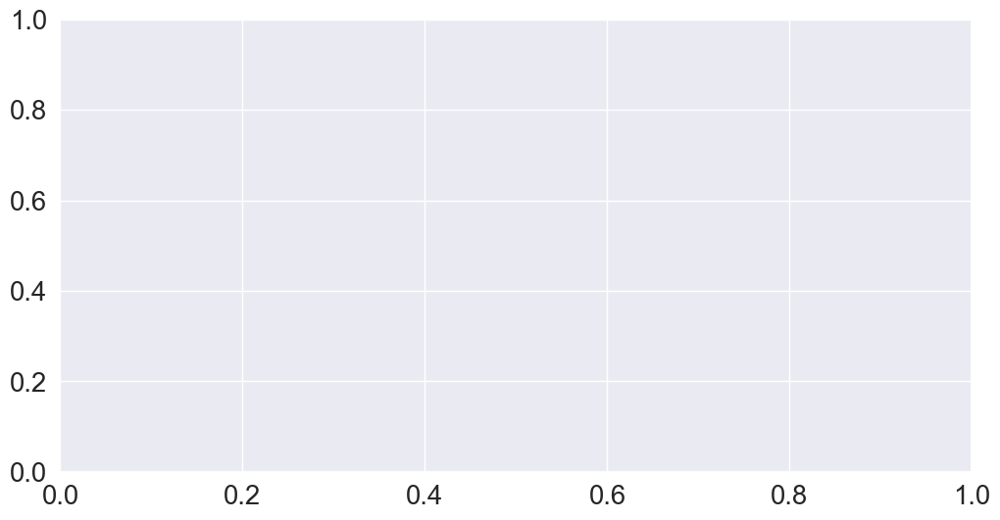

In [82]:
for col in df.columns[1:]:
    sns.set(font_scale=1.8)
    plt.figure(figsize=(12,6))
    # fig = sns.kdeplot(df['windspeedKmph_avg'], shade=True, color="r")
    fig = sns.kdeplot(df[col], shade=True, color="b")
    plt.show()

In [83]:
df['Fusarium Wilt'].value_counts()

Fusarium Wilt    56
Name: Fusarium Wilt, dtype: int64

In [84]:
df['Fusarium Wilt'] = np.where(df['Fusarium Wilt'] == 'Fusarium Wilt',1,0)
df['Fusarium Wilt'].unique()

array([0, 1])

In [85]:
df['Fusarium Wilt'].value_counts()

0    1134
1      56
Name: Fusarium Wilt, dtype: int64

In [87]:
df1 = df[['tempC_7to8', 'tempC_1to2', 'tempC_6to7', 'tempC_avg',
       'Relative humidity_7to8', 'humidity_1to2', 'humidity_6to7',
       'humidity_avg', 'windspeedKmph_7to8', 'windspeedKmph_1to2',
       'windspeedKmph_6to7', 'windspeedKmph_avg', 'pressureMB_7to8',
       'pressureMB_1to2', 'pressureMB_6to7', 'pressureMB_avg', 'precipMM_7to8',
       'precipMM_1to2', 'precipMM_6to7', 'precipMM_avg', 'weatherDesc_7to8',
       'weatherDesc_1to2', 'weatherDesc_6to7', 'Sunshine Hours',
       '%_soil_moisure', 'soil_pH', 'water_pH', 'water_TDS_mgpl', 'Fusarium Wilt']]
df1.head()

,tempC_7to8,tempC_1to2,tempC_6to7,tempC_avg,Relative humidity_7to8,humidity_1to2,humidity_6to7,humidity_avg,windspeedKmph_7to8,windspeedKmph_1to2,...,precipMM_avg,weatherDesc_7to8,weatherDesc_1to2,weatherDesc_6to7,Sunshine Hours,%_soil_moisure,soil_pH,water_pH,water_TDS_mgpl,Fusarium Wilt
0,22,26,20,22,38,28,44,36,5,11,...,0.0,Sunny,Sunny,Clear,9.8,44,7.2,7.6,1709.0,0
1,21,28,21,23,39,25,38,34,10,4,...,0.0,Sunny,Sunny,Clear,9.8,43,7.2,7.6,1708.0,0
2,20,28,22,23,41,27,45,37,12,5,...,0.0,Sunny,Sunny,Clear,9.8,42,7.2,7.6,1707.0,0
3,22,28,21,23,39,26,49,38,6,4,...,0.0,Sunny,Sunny,Clear,9.8,42,7.2,7.6,1709.0,0
4,22,27,20,23,43,27,44,38,4,7,...,0.0,Sunny,Sunny,Clear,9.8,43,7.2,7.6,1708.0,0


# FEATURE SELECTION 

- With Correlation (pearson correlation) with Y

In [88]:
print(df1.isnull().sum())
print('\n')
df1['Sunshine Hours'].fillna(df1['Sunshine Hours'].mean(), inplace = True)
print(df1.isnull().sum())

tempC_7to8                  0
tempC_1to2                  0
tempC_6to7                  0
tempC_avg                   0
Relative humidity_7to8      0
humidity_1to2               0
humidity_6to7               0
humidity_avg                0
windspeedKmph_7to8          0
windspeedKmph_1to2          0
windspeedKmph_6to7          0
windspeedKmph_avg           0
pressureMB_7to8             0
pressureMB_1to2             0
pressureMB_6to7             0
pressureMB_avg              0
precipMM_7to8               0
precipMM_1to2               0
precipMM_6to7               0
precipMM_avg                0
weatherDesc_7to8            0
weatherDesc_1to2            0
weatherDesc_6to7            0
Sunshine Hours            126
%_soil_moisure              0
soil_pH                     0
water_pH                    0
water_TDS_mgpl              0
Fusarium Wilt               0
dtype: int64


tempC_7to8                0
tempC_1to2                0
tempC_6to7                0
tempC_avg                 0
Rel

C:\Users\munge\AppData\Local\Temp\ipykernel_20912\1414325398.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df1['Sunshine Hours'].fillna(df1['Sunshine Hours'].mean(), inplace = True)


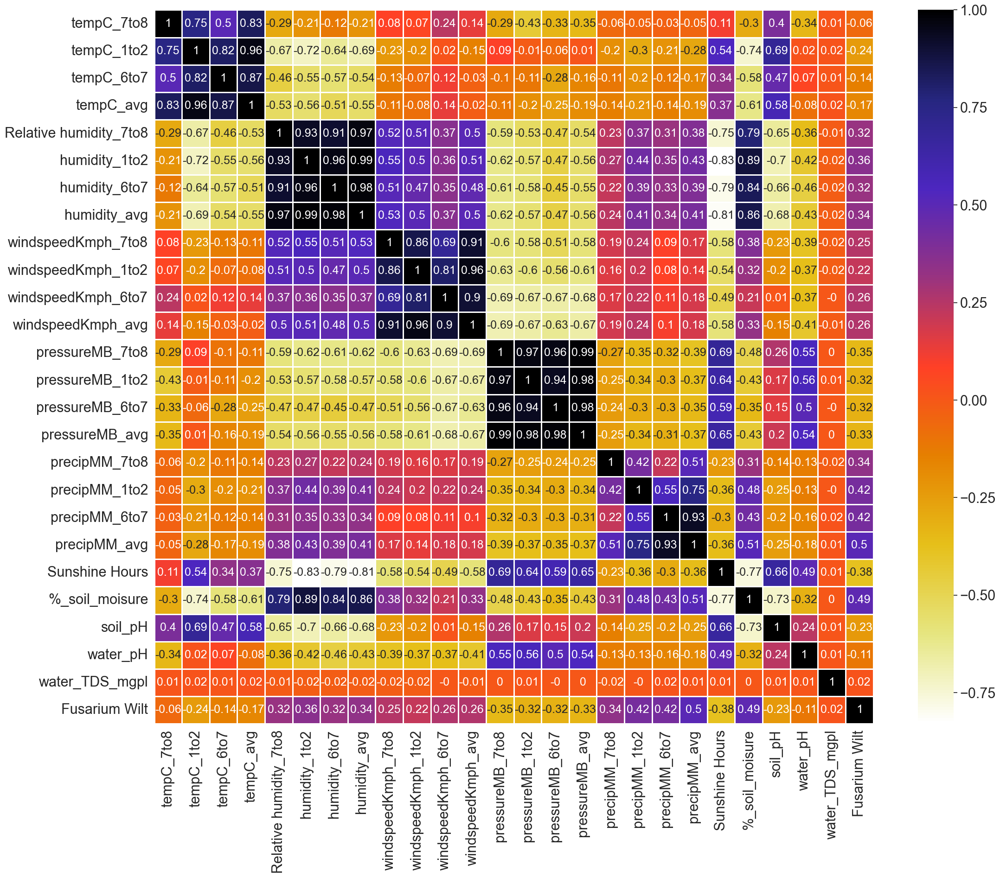

In [89]:
#Using Pearson Correlation
plt.figure(figsize=(25,20))
cor = df1.corr()
sns.set(font_scale=2)

sns.heatmap(round(cor,2), annot=True, cmap=plt.cm.CMRmap_r, linewidths=1, linecolor='white',annot_kws={"size": 18})
plt.savefig('heatmap1.jpeg', dpi=500, bbox_inches='tight', facecolor='grey', edgecolor='blue',)
plt.show()

In [90]:
# Feature Selection-Information gain - mutual information
df1.columns
# # Train test split to avoid overfitting
X = df1[['tempC_7to8', 'tempC_1to2', 'tempC_6to7', 'tempC_avg',
       'Relative humidity_7to8', 'humidity_1to2', 'humidity_6to7',
       'humidity_avg', 'windspeedKmph_7to8', 'windspeedKmph_1to2',
       'windspeedKmph_6to7', 'windspeedKmph_avg', 'pressureMB_7to8',
       'pressureMB_1to2', 'pressureMB_6to7', 'pressureMB_avg', 'precipMM_7to8',
       'precipMM_1to2', 'precipMM_6to7', 'precipMM_avg', 'Sunshine Hours',
       '%_soil_moisure', 'soil_pH', 'water_pH', 'water_TDS_mgpl']]
y = df1['Fusarium Wilt']

X.isnull().sum()

tempC_7to8                0
tempC_1to2                0
tempC_6to7                0
tempC_avg                 0
Relative humidity_7to8    0
humidity_1to2             0
humidity_6to7             0
humidity_avg              0
windspeedKmph_7to8        0
windspeedKmph_1to2        0
windspeedKmph_6to7        0
windspeedKmph_avg         0
pressureMB_7to8           0
pressureMB_1to2           0
pressureMB_6to7           0
pressureMB_avg            0
precipMM_7to8             0
precipMM_1to2             0
precipMM_6to7             0
precipMM_avg              0
Sunshine Hours            0
%_soil_moisure            0
soil_pH                   0
water_pH                  0
water_TDS_mgpl            0
dtype: int64

In [91]:
# separate dataset into train and test
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, stratify=y) # random_state=0,

print(X_train.shape, X_test.shape)

from sklearn.feature_selection import mutual_info_classif
# determine the mutual information
mutual_info = mutual_info_classif(X_train, y_train)
mutual_info

(833, 25) (357, 25)


array([0.03618986, 0.04376514, 0.03088861, 0.02192897, 0.07502078,
       0.07346794, 0.06633409, 0.07927597, 0.0326534 , 0.02433165,
       0.05083055, 0.02757184, 0.05928315, 0.0629057 , 0.05962827,
       0.06055716, 0.04403607, 0.07081283, 0.06210873, 0.08662163,
       0.07098458, 0.16558268, 0.04047409, 0.02857762, 0.        ])

In [92]:
mutual_info = pd.Series(mutual_info)
mutual_info.index = X_train.columns
mutual_info.sort_values(ascending=False)

%_soil_moisure            0.165583
precipMM_avg              0.086622
humidity_avg              0.079276
Relative humidity_7to8    0.075021
humidity_1to2             0.073468
Sunshine Hours            0.070985
precipMM_1to2             0.070813
humidity_6to7             0.066334
pressureMB_1to2           0.062906
precipMM_6to7             0.062109
pressureMB_avg            0.060557
pressureMB_6to7           0.059628
pressureMB_7to8           0.059283
windspeedKmph_6to7        0.050831
precipMM_7to8             0.044036
tempC_1to2                0.043765
soil_pH                   0.040474
tempC_7to8                0.036190
windspeedKmph_7to8        0.032653
tempC_6to7                0.030889
water_pH                  0.028578
windspeedKmph_avg         0.027572
windspeedKmph_1to2        0.024332
tempC_avg                 0.021929
water_TDS_mgpl            0.000000
dtype: float64

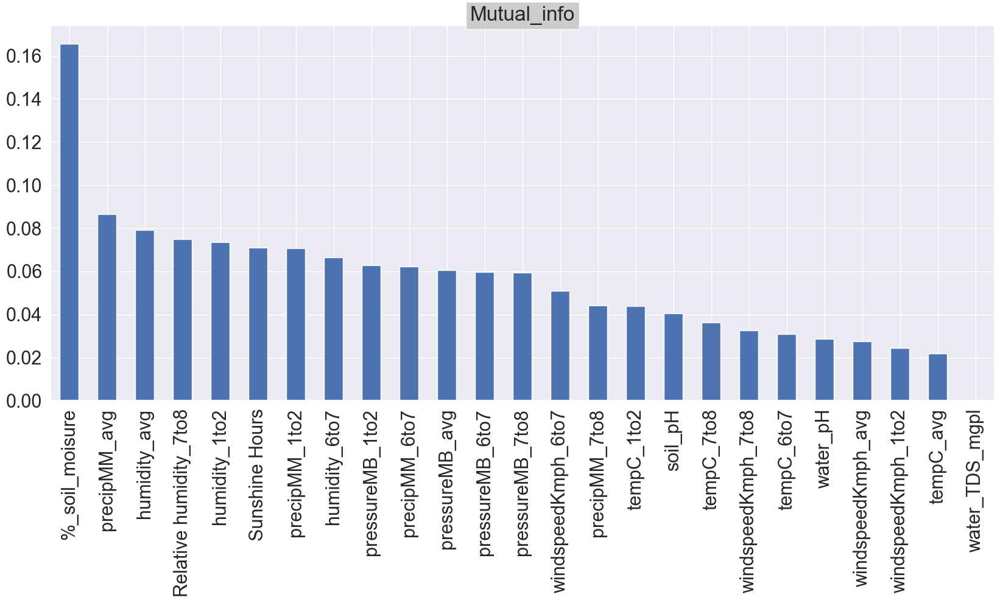

In [93]:
title('Mutual_info', bbox={'facecolor': '0.8', 'pad': 5})
#let's plot the ordered mutual_info values per feature
mutual_info.sort_values(ascending=False).plot.bar(figsize=(20, 8))
plt.savefig('mutual_info_classif1.jpeg', dpi=500, bbox_inches='tight') # , facecolor='grey', edgecolor='blue',

In [95]:
df2 = df[['tempC_avg','humidity_avg', 'windspeedKmph_avg', 'pressureMB_avg', 'precipMM_avg', 'weatherDesc_7to8', 
          'weatherDesc_1to2', 'weatherDesc_6to7', 'Sunshine Hours', '%_soil_moisure', 'soil_pH', 'water_pH', 
          'water_TDS_mgpl', 'Fusarium Wilt']]
df2.head()

,tempC_avg,humidity_avg,windspeedKmph_avg,pressureMB_avg,precipMM_avg,weatherDesc_7to8,weatherDesc_1to2,weatherDesc_6to7,Sunshine Hours,%_soil_moisure,soil_pH,water_pH,water_TDS_mgpl,Fusarium Wilt
0,22,36,8,1010,0.0,Sunny,Sunny,Clear,9.8,44,7.2,7.6,1709.0,0
1,23,34,6,1011,0.0,Sunny,Sunny,Clear,9.8,43,7.2,7.6,1708.0,0
2,23,37,7,1012,0.0,Sunny,Sunny,Clear,9.8,42,7.2,7.6,1707.0,0
3,23,38,6,1013,0.0,Sunny,Sunny,Clear,9.8,42,7.2,7.6,1709.0,0
4,23,38,7,1012,0.0,Sunny,Sunny,Clear,9.8,43,7.2,7.6,1708.0,0


In [96]:
print(df2.isnull().sum())
print('\n')
df2['Sunshine Hours'].fillna(df2['Sunshine Hours'].mean(), inplace = True)
print(df2.isnull().sum())

tempC_avg              0
humidity_avg           0
windspeedKmph_avg      0
pressureMB_avg         0
precipMM_avg           0
weatherDesc_7to8       0
weatherDesc_1to2       0
weatherDesc_6to7       0
Sunshine Hours       126
%_soil_moisure         0
soil_pH                0
water_pH               0
water_TDS_mgpl         0
Fusarium Wilt          0
dtype: int64


tempC_avg            0
humidity_avg         0
windspeedKmph_avg    0
pressureMB_avg       0
precipMM_avg         0
weatherDesc_7to8     0
weatherDesc_1to2     0
weatherDesc_6to7     0
Sunshine Hours       0
%_soil_moisure       0
soil_pH              0
water_pH             0
water_TDS_mgpl       0
Fusarium Wilt        0
dtype: int64


C:\Users\munge\AppData\Local\Temp\ipykernel_20912\1470565273.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df2['Sunshine Hours'].fillna(df2['Sunshine Hours'].mean(), inplace = True)


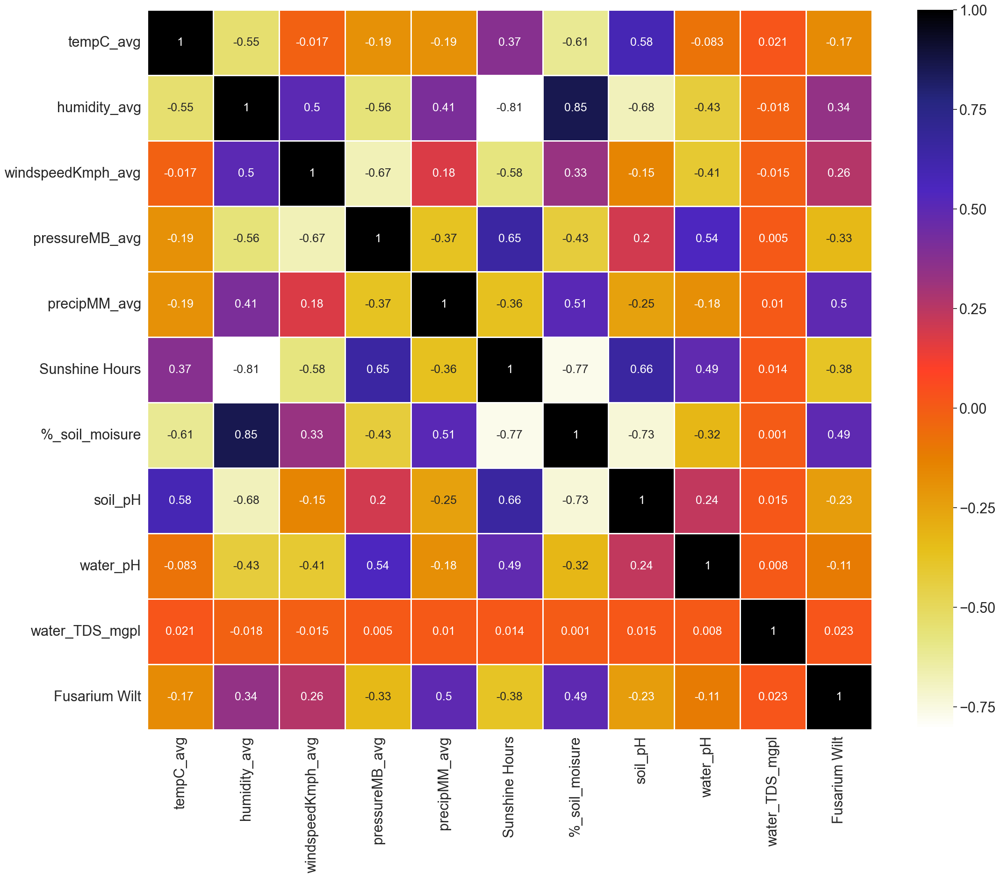

In [98]:
#Using Pearson Correlation
plt.figure(figsize=(25,20))
cor = df2.corr()
sns.set(font_scale=2)

sns.heatmap(round(cor,3), annot=True, cmap=plt.cm.CMRmap_r, linewidths=1, linecolor='white',annot_kws={"size": 18})
plt.savefig('heatmap2.jpeg', dpi=500, bbox_inches='tight', facecolor='grey', edgecolor='blue',)
plt.show()

In [99]:
# Feature Selection-Information gain - mutual information
df1.columns

X = df2[['tempC_avg','humidity_avg', 'windspeedKmph_avg', 'pressureMB_avg', 'precipMM_avg', 'Sunshine Hours',
       '%_soil_moisure', 'soil_pH', 'water_pH', 'water_TDS_mgpl']]
y = df2['Fusarium Wilt']

X.isnull().sum()

tempC_avg            0
humidity_avg         0
windspeedKmph_avg    0
pressureMB_avg       0
precipMM_avg         0
Sunshine Hours       0
%_soil_moisure       0
soil_pH              0
water_pH             0
water_TDS_mgpl       0
dtype: int64

In [100]:
# separate dataset into train and test
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, stratify=y) # random_state=0,

print(X_train.shape, X_test.shape)

from sklearn.feature_selection import mutual_info_classif
# determine the mutual information
mutual_info = mutual_info_classif(X_train, y_train)
print(mutual_info)

mutual_info = pd.Series(mutual_info)
mutual_info.index = X_train.columns
mutual_info.sort_values(ascending=False)

(833, 10) (357, 10)
[0.02414639 0.08034175 0.02023508 0.07229744 0.08327389 0.07717028
 0.17335251 0.03237834 0.02270576 0.01372808]


%_soil_moisure       0.173353
precipMM_avg         0.083274
humidity_avg         0.080342
Sunshine Hours       0.077170
pressureMB_avg       0.072297
soil_pH              0.032378
tempC_avg            0.024146
water_pH             0.022706
windspeedKmph_avg    0.020235
water_TDS_mgpl       0.013728
dtype: float64

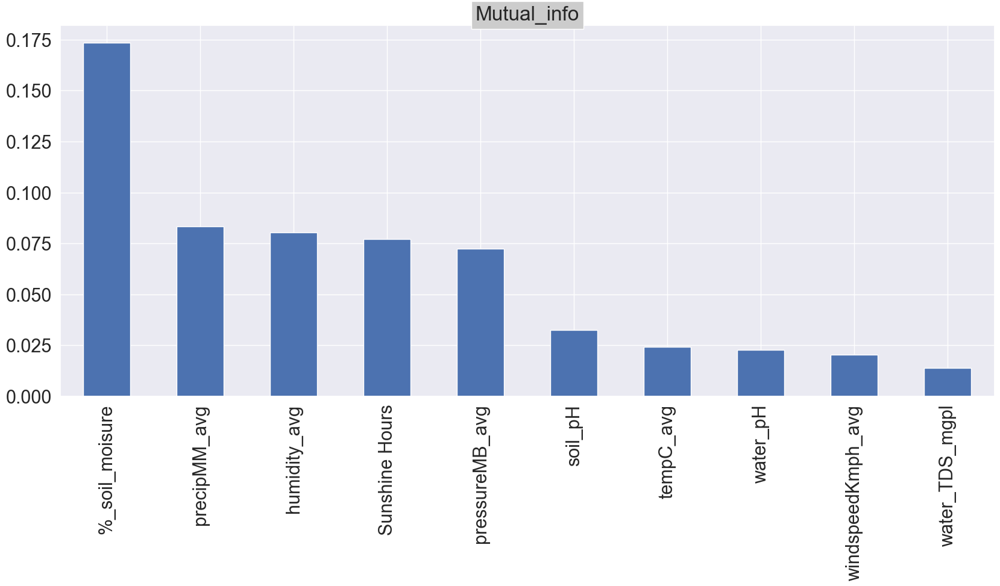

In [101]:
title('Mutual_info', bbox={'facecolor': '0.8', 'pad': 5})
#let's plot the ordered mutual_info values per feature
mutual_info.sort_values(ascending=False).plot.bar(figsize=(20, 8))
plt.savefig('mutual_info_classif2.jpeg', dpi=500, bbox_inches='tight') # , facecolor='grey', edgecolor='blue',

# EDA 2

In [102]:
df = pd.read_excel(r'part6\Historical Weather Data 2010-2021.xlsx', sheet_name='201021')
df.head()

,observation,tempC_7to8,tempC_1to2,tempC_6to7,tempC_avg(0C),Relative humidity_7to8,Relative humidity_1to2,Relative humidity_6to7,Relative humidity_avg(%),windspeedKmph_7to8,...,%_soil_moisure,soil_pH,water_pH,water_TDS_mgpl,Label (Disease Yes/No),Type of Disease (Bacterial Blight/Telya),Anthracnose,Fruit Spot/ Rot,Fusarium Wilt,Fruit Borer / Blight Blora
0,2010-01-01,20,30,20,23,42,33,59,44,9,...,45,6.91,7.18,1709.0,NO,NaN,NaN,NaN,NaN,NaN
1,2010-01-02,23,29,23,25,49,40,62,50,9,...,45,6.77,7.66,1707.0,YES,Bacterial Blight,Anthracnose,NaN,NaN,NaN
2,2010-01-03,24,27,21,24,61,50,78,63,4,...,41,6.76,7.44,1707.0,NO,NaN,NaN,NaN,NaN,NaN
3,2010-01-04,23,29,20,24,57,30,52,46,5,...,43,7.10,7.43,1708.0,NO,NaN,NaN,NaN,NaN,NaN
4,2010-01-05,22,30,21,24,48,34,54,45,6,...,44,6.53,8.05,1709.0,NO,NaN,NaN,NaN,NaN,NaN


In [103]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4227 entries, 0 to 4226
Data columns (total 35 columns):
 #   Column                                    Non-Null Count  Dtype         
---  ------                                    --------------  -----         
 0   observation                               4227 non-null   datetime64[ns]
 1   tempC_7to8                                4227 non-null   int64         
 2   tempC_1to2                                4227 non-null   int64         
 3   tempC_6to7                                4227 non-null   int64         
 4   tempC_avg(0C)                             4227 non-null   int64         
 5   Relative humidity_7to8                    4227 non-null   int64         
 6   Relative humidity_1to2                    4227 non-null   int64         
 7   Relative humidity_6to7                    4227 non-null   int64         
 8   Relative humidity_avg(%)                  4227 non-null   int64         
 9   windspeedKmph_7to8            

In [104]:
df['Label (Disease Yes/No)'] = np.where(df['Label (Disease Yes/No)'] == 'NO',0,1)
df.head(10)

,observation,tempC_7to8,tempC_1to2,tempC_6to7,tempC_avg(0C),Relative humidity_7to8,Relative humidity_1to2,Relative humidity_6to7,Relative humidity_avg(%),windspeedKmph_7to8,...,%_soil_moisure,soil_pH,water_pH,water_TDS_mgpl,Label (Disease Yes/No),Type of Disease (Bacterial Blight/Telya),Anthracnose,Fruit Spot/ Rot,Fusarium Wilt,Fruit Borer / Blight Blora
0,2010-01-01,20,30,20,23,42,33,59,44,9,...,45,6.91,7.18,1709.0,0,NaN,NaN,NaN,NaN,NaN
1,2010-01-02,23,29,23,25,49,40,62,50,9,...,45,6.77,7.66,1707.0,1,Bacterial Blight,Anthracnose,NaN,NaN,NaN
2,2010-01-03,24,27,21,24,61,50,78,63,4,...,41,6.76,7.44,1707.0,0,NaN,NaN,NaN,NaN,NaN
3,2010-01-04,23,29,20,24,57,30,52,46,5,...,43,7.10,7.43,1708.0,0,NaN,NaN,NaN,NaN,NaN
4,2010-01-05,22,30,21,24,48,34,54,45,6,...,44,6.53,8.05,1709.0,0,NaN,NaN,NaN,NaN,NaN
5,2010-01-06,22,31,21,24,40,24,42,35,8,...,43,7.49,7.49,1708.0,0,NaN,NaN,NaN,NaN,NaN
6,2010-01-07,21,30,19,23,39,27,50,38,8,...,40,6.94,7.68,1708.0,0,NaN,NaN,NaN,NaN,NaN
7,2010-01-08,22,29,18,23,36,25,53,38,7,...,41,7.42,7.06,1709.0,0,NaN,NaN,NaN,NaN,NaN
8,2010-01-09,21,29,18,22,36,27,49,37,8,...,41,6.80,7.70,1708.0,0,NaN,NaN,NaN,NaN,NaN
9,2010-01-10,22,29,22,24,40,32,48,40,10,...,44,6.85,6.83,1708.0,0,NaN,NaN,NaN,NaN,NaN


In [105]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4227 entries, 0 to 4226
Data columns (total 35 columns):
 #   Column                                    Non-Null Count  Dtype         
---  ------                                    --------------  -----         
 0   observation                               4227 non-null   datetime64[ns]
 1   tempC_7to8                                4227 non-null   int64         
 2   tempC_1to2                                4227 non-null   int64         
 3   tempC_6to7                                4227 non-null   int64         
 4   tempC_avg(0C)                             4227 non-null   int64         
 5   Relative humidity_7to8                    4227 non-null   int64         
 6   Relative humidity_1to2                    4227 non-null   int64         
 7   Relative humidity_6to7                    4227 non-null   int64         
 8   Relative humidity_avg(%)                  4227 non-null   int64         
 9   windspeedKmph_7to8            

In [106]:
df['Label (Disease Yes/No)'].value_counts()

0    2470
1    1757
Name: Label (Disease Yes/No), dtype: int64

In [107]:
X = df[['tempC_avg(0C)', 'Relative humidity_avg(%)', 'windspeedKmph_avg(Km/h)', 'pressureMB_avg', 'precipMM_avg(mm)', 
        'weatherDesc_7to8', 'weatherDesc_1to2', 'weatherDesc_6to7', 'Sunshine Hours', 
        '%_soil_moisure', 'soil_pH', 'water_pH', 'water_TDS_mgpl']]
y = df['Label (Disease Yes/No)']

In [108]:
for ind in df.columns:
    print(ind, ' : ', len(df[ind].unique()))

observation  :  4227
tempC_7to8  :  24
tempC_1to2  :  26
tempC_6to7  :  25
tempC_avg(0C)  :  21
Relative humidity_7to8  :  93
Relative humidity_1to2  :  95
Relative humidity_6to7  :  92
Relative humidity_avg(%)  :  93
windspeedKmph_7to8  :  39
windspeedKmph_1to2  :  40
windspeedKmph_6to7  :  39
windspeedKmph_avg(Km/h)  :  38
pressureMB_7to8  :  25
pressureMB_1to2  :  23
pressureMB_6to7  :  25
pressureMB_avg  :  24
precipMM_7to8  :  30
precipMM_1to2  :  34
precipMM_6to7  :  62
precipMM_avg(mm)  :  84
weatherDesc_7to8  :  21
weatherDesc_1to2  :  18
weatherDesc_6to7  :  20
Sunshine Hours  :  14
%_soil_moisure  :  43
soil_pH  :  101
water_pH  :  201
water_TDS_mgpl  :  15
Label (Disease Yes/No)  :  2
Type of Disease (Bacterial Blight/Telya)  :  3
Anthracnose  :  5
Fruit Spot/ Rot  :  6
Fusarium Wilt  :  2
Fruit Borer / Blight Blora  :  3


In [109]:
df.isnull().sum()

observation                                    0
tempC_7to8                                     0
tempC_1to2                                     0
tempC_6to7                                     0
tempC_avg(0C)                                  0
Relative humidity_7to8                         0
Relative humidity_1to2                         0
Relative humidity_6to7                         0
Relative humidity_avg(%)                       0
windspeedKmph_7to8                             0
windspeedKmph_1to2                             0
windspeedKmph_6to7                             0
windspeedKmph_avg(Km/h)                        0
pressureMB_7to8                                0
pressureMB_1to2                                0
pressureMB_6to7                                0
pressureMB_avg                                 0
precipMM_7to8                                  0
precipMM_1to2                                  0
precipMM_6to7                                  0
precipMM_avg(mm)    

In [110]:
# Check which columns in DataFrame are Categorical
df.select_dtypes(include=['category']).head(3)

""
0
1
2


In [112]:
df.select_dtypes(include=['object']).head(3)

,weatherDesc_7to8,weatherDesc_1to2,weatherDesc_6to7,Type of Disease (Bacterial Blight/Telya),Anthracnose,Fruit Spot/ Rot,Fusarium Wilt,Fruit Borer / Blight Blora
0,Clear,Sunny,Sunny,NaN,NaN,NaN,NaN,NaN
1,Clear,Partly cloudy,Partly cloudy,Bacterial Blight,Anthracnose,NaN,NaN,NaN
2,Partly cloudy,Partly cloudy,Partly cloudy,NaN,NaN,NaN,NaN,NaN


In [113]:
df.select_dtypes(include=['object']).dtypes

weatherDesc_7to8                            object
weatherDesc_1to2                            object
weatherDesc_6to7                            object
Type of Disease (Bacterial Blight/Telya)    object
Anthracnose                                 object
Fruit Spot/ Rot                             object
Fusarium Wilt                               object
Fruit Borer / Blight Blora                  object
dtype: object

In [114]:
df.select_dtypes(include=['category','int']).dtypes

tempC_7to8                  int64
tempC_1to2                  int64
tempC_6to7                  int64
tempC_avg(0C)               int64
Relative humidity_7to8      int64
Relative humidity_1to2      int64
Relative humidity_6to7      int64
Relative humidity_avg(%)    int64
windspeedKmph_7to8          int64
windspeedKmph_1to2          int64
windspeedKmph_6to7          int64
windspeedKmph_avg(Km/h)     int64
pressureMB_7to8             int64
pressureMB_1to2             int64
pressureMB_6to7             int64
pressureMB_avg              int64
%_soil_moisure              int64
Label (Disease Yes/No)      int32
dtype: object

In [115]:
df.select_dtypes(include=['category','int','float']).dtypes

tempC_7to8                    int64
tempC_1to2                    int64
tempC_6to7                    int64
tempC_avg(0C)                 int64
Relative humidity_7to8        int64
Relative humidity_1to2        int64
Relative humidity_6to7        int64
Relative humidity_avg(%)      int64
windspeedKmph_7to8            int64
windspeedKmph_1to2            int64
windspeedKmph_6to7            int64
windspeedKmph_avg(Km/h)       int64
pressureMB_7to8               int64
pressureMB_1to2               int64
pressureMB_6to7               int64
pressureMB_avg                int64
precipMM_7to8               float64
precipMM_1to2               float64
precipMM_6to7               float64
precipMM_avg(mm)            float64
Sunshine Hours              float64
%_soil_moisure                int64
soil_pH                     float64
water_pH                    float64
water_TDS_mgpl              float64
Label (Disease Yes/No)        int32
dtype: object

# Feature Selection

- Dropping constant features

### f1 f2 f3 f4 
### 23 4 6 7
### 12 3 6 7
### 10 2 6 7 

In [116]:
col_list = list(df.select_dtypes(include=['category','int','float']))
col_list[:-1]

['tempC_7to8',
 'tempC_1to2',
 'tempC_6to7',
 'tempC_avg(0C)',
 'Relative humidity_7to8',
 'Relative humidity_1to2',
 'Relative humidity_6to7',
 'Relative humidity_avg(%)',
 'windspeedKmph_7to8',
 'windspeedKmph_1to2',
 'windspeedKmph_6to7',
 'windspeedKmph_avg(Km/h)',
 'pressureMB_7to8',
 'pressureMB_1to2',
 'pressureMB_6to7',
 'pressureMB_avg',
 'precipMM_7to8',
 'precipMM_1to2',
 'precipMM_6to7',
 'precipMM_avg(mm)',
 'Sunshine Hours',
 '%_soil_moisure',
 'soil_pH',
 'water_pH',
 'water_TDS_mgpl']

In [118]:
df1 = df[col_list[:-1]]
df1.head()

,tempC_7to8,tempC_1to2,tempC_6to7,tempC_avg(0C),Relative humidity_7to8,Relative humidity_1to2,Relative humidity_6to7,Relative humidity_avg(%),windspeedKmph_7to8,windspeedKmph_1to2,...,pressureMB_avg,precipMM_7to8,precipMM_1to2,precipMM_6to7,precipMM_avg(mm),Sunshine Hours,%_soil_moisure,soil_pH,water_pH,water_TDS_mgpl
0,20,30,20,23,42,33,59,44,9,2,...,1013,0.0,0.0,0.0,0.0,9.8,45,6.91,7.18,1709.0
1,23,29,23,25,49,40,62,50,9,3,...,1014,0.0,0.0,0.0,0.0,9.8,45,6.77,7.66,1707.0
2,24,27,21,24,61,50,78,63,4,8,...,1015,0.0,0.0,0.0,0.0,9.8,41,6.76,7.44,1707.0
3,23,29,20,24,57,30,52,46,5,7,...,1013,0.0,0.0,0.0,0.0,9.8,43,7.10,7.43,1708.0
4,22,30,21,24,48,34,54,45,6,2,...,1011,0.0,0.0,0.0,0.0,9.8,44,6.53,8.05,1709.0


In [119]:
### It will zero variance features
from sklearn.feature_selection import VarianceThreshold
var_thres=VarianceThreshold(threshold=0.1)
var_thres.fit(df1)

VarianceThreshold(threshold=0.1)

In [120]:
var_thres.get_support()

array([ True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True, False,  True,
        True,  True,  True,  True, False,  True,  True])

In [121]:
### Finding non constant features
sum(var_thres.get_support())

23

In [122]:
# Lets Find non-constant features 
len(df1.columns[var_thres.get_support()])

23

In [123]:
constant_columns = [column for column in df1.columns if column not in df1.columns[var_thres.get_support()]]
print(len(constant_columns))

2


In [124]:
for column in constant_columns:
    print(column)

precipMM_7to8
soil_pH


In [125]:
df1_out = df1.drop(constant_columns,axis=1)

In [126]:
df1_out.head()

,tempC_7to8,tempC_1to2,tempC_6to7,tempC_avg(0C),Relative humidity_7to8,Relative humidity_1to2,Relative humidity_6to7,Relative humidity_avg(%),windspeedKmph_7to8,windspeedKmph_1to2,...,pressureMB_1to2,pressureMB_6to7,pressureMB_avg,precipMM_1to2,precipMM_6to7,precipMM_avg(mm),Sunshine Hours,%_soil_moisure,water_pH,water_TDS_mgpl
0,20,30,20,23,42,33,59,44,9,2,...,1012,1013,1013,0.0,0.0,0.0,9.8,45,7.18,1709.0
1,23,29,23,25,49,40,62,50,9,3,...,1013,1015,1014,0.0,0.0,0.0,9.8,45,7.66,1707.0
2,24,27,21,24,61,50,78,63,4,8,...,1014,1015,1015,0.0,0.0,0.0,9.8,41,7.44,1707.0
3,23,29,20,24,57,30,52,46,5,7,...,1012,1013,1013,0.0,0.0,0.0,9.8,43,7.43,1708.0
4,22,30,21,24,48,34,54,45,6,2,...,1010,1012,1011,0.0,0.0,0.0,9.8,44,8.05,1709.0


# Observation : 
- Remove constant features (precipMM_7to8, soil_pH)

# Feature Selection

- With Correlation (pearson correlation)

In [127]:
X = df[['tempC_avg(0C)', 'Relative humidity_avg(%)', 'windspeedKmph_avg(Km/h)', 'pressureMB_avg', 'precipMM_avg(mm)', 
        'weatherDesc_7to8', 'weatherDesc_1to2', 'weatherDesc_6to7', 'Sunshine Hours', 
        '%_soil_moisure', 'soil_pH', 'water_pH', 'water_TDS_mgpl']]
y = df['Label (Disease Yes/No)']

In [128]:
X.isnull().sum()

tempC_avg(0C)               0
Relative humidity_avg(%)    0
windspeedKmph_avg(Km/h)     0
pressureMB_avg              0
precipMM_avg(mm)            0
weatherDesc_7to8            0
weatherDesc_1to2            0
weatherDesc_6to7            0
Sunshine Hours              0
%_soil_moisure              0
soil_pH                     0
water_pH                    0
water_TDS_mgpl              0
dtype: int64

In [129]:
# separate dataset into train and test
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, stratify=y) # random_state=0,

X_train.shape, X_test.shape

((2958, 13), (1269, 13))

In [130]:
X_train.corr()

,tempC_avg(0C),Relative humidity_avg(%),windspeedKmph_avg(Km/h),pressureMB_avg,precipMM_avg(mm),Sunshine Hours,%_soil_moisure,soil_pH,water_pH,water_TDS_mgpl
tempC_avg(0C),1.000000,-0.497191,-0.042127,-0.168188,-0.187539,0.413320,-0.594591,0.061318,-0.029524,-0.012526
Relative humidity_avg(%),-0.497191,1.000000,0.419609,-0.598608,0.460488,-0.858384,0.826852,-0.068900,-0.035920,-0.006603
windspeedKmph_avg(Km/h),-0.042127,0.419609,1.000000,-0.542387,0.146569,-0.470326,0.218347,0.024176,-0.100734,0.004741
pressureMB_avg,-0.168188,-0.598608,-0.542387,1.000000,-0.395402,0.637758,-0.401417,0.025109,0.055991,0.002971
precipMM_avg(mm),-0.187539,0.460488,0.146569,-0.395402,1.000000,-0.396679,0.546617,-0.041787,-0.006955,0.007166
Sunshine Hours,0.413320,-0.858384,-0.470326,0.637758,-0.396679,1.000000,-0.765085,0.067914,0.042261,0.007849
%_soil_moisure,-0.594591,0.826852,0.218347,-0.401417,0.546617,-0.765085,1.000000,-0.084568,-0.021137,0.006769
soil_pH,0.061318,-0.068900,0.024176,0.025109,-0.041787,0.067914,-0.084568,1.000000,-0.023859,-0.025629
water_pH,-0.029524,-0.035920,-0.100734,0.055991,-0.006955,0.042261,-0.021137,-0.023859,1.000000,-0.002150
water_TDS_mgpl,-0.012526,-0.006603,0.004741,0.002971,0.007166,0.007849,0.006769,-0.025629,-0.002150,1.000000


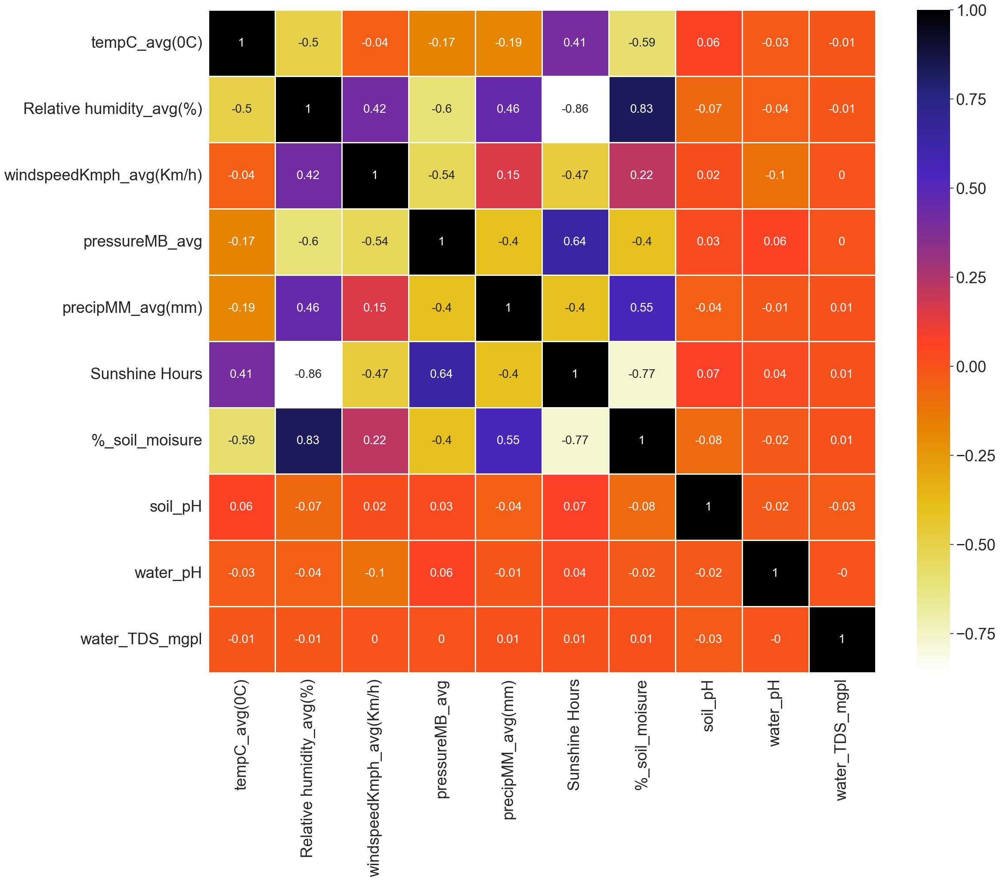

In [131]:
#Using Pearson Correlation
plt.figure(figsize=(25,20))
cor = X_train.corr()
sns.set(font_scale=2.4)

sns.heatmap(round(cor,2), annot=True, cmap=plt.cm.CMRmap_r, linewidths=1, linecolor='white',annot_kws={"size": 20})
plt.savefig('heatmap.jpeg', dpi=500, bbox_inches='tight', facecolor='grey', edgecolor='blue',)
plt.show()

In [132]:
corr_features = correlation(X_train, 0.85)
len(set(corr_features))

1

In [133]:
corr_features

{'Sunshine Hours'}

In [134]:
X_train.drop(corr_features,axis=1)
X_test.drop(corr_features,axis=1)

,tempC_avg(0C),Relative humidity_avg(%),windspeedKmph_avg(Km/h),pressureMB_avg,precipMM_avg(mm),weatherDesc_7to8,weatherDesc_1to2,weatherDesc_6to7,%_soil_moisure,soil_pH,water_pH,water_TDS_mgpl
1246,26,75,12,1004,0.300000,Cloudy,Patchy rain possible,Light rain shower,55,6.56,6.65,1710.0
80,30,23,10,1007,0.000000,Clear,Sunny,Sunny,31,6.84,7.82,1710.0
528,25,83,21,1001,0.166667,Light rain shower,Light rain shower,Light drizzle,52,7.20,7.79,1708.0
3346,33,43,22,1003,0.166667,Sunny,Sunny,Patchy rain possible,35,7.10,7.10,1709.0
1900,33,35,10,1007,0.000000,Clear,Sunny,Sunny,33,7.46,7.20,1707.0
...,...,...,...,...,...,...,...,...,...,...,...,...
1633,25,76,13,1006,0.100000,Cloudy,Patchy rain possible,Cloudy,50,6.94,8.31,1709.0
480,31,35,13,1006,0.000000,Clear,Sunny,Sunny,31,7.03,7.83,1707.0
3101,28,53,9,1010,0.000000,Sunny,Partly cloudy,Clear,54,7.00,7.10,1709.0
3375,24,84,30,1002,0.200000,Light rain shower,Light rain shower,Light rain shower,60,7.00,7.40,1709.0


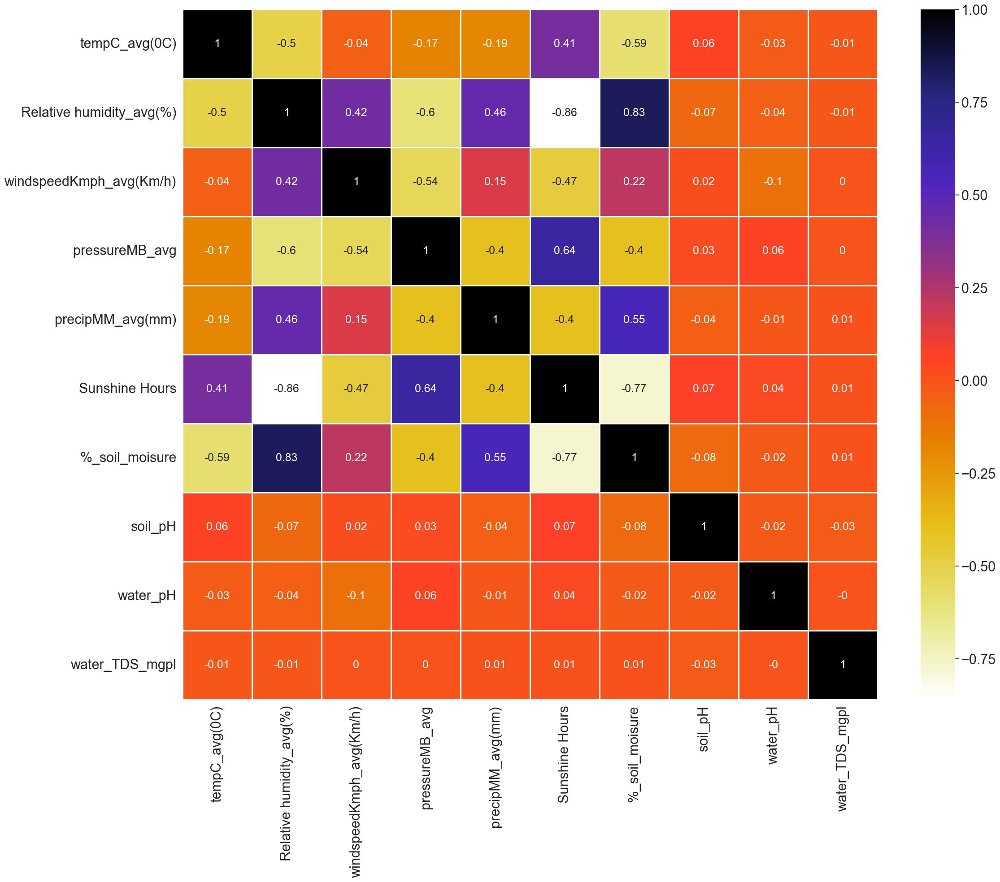

In [135]:
#Using Pearson Correlation
plt.figure(figsize=(25,20))
cor = X_train.corr()
sns.set(font_scale=2)

sns.heatmap(round(cor,2), annot=True, cmap=plt.cm.CMRmap_r, linewidths=1, linecolor='white',annot_kws={"size": 18})
# plt.savefig('heatmap1.jpeg', dpi=500, bbox_inches='tight', facecolor='grey', edgecolor='blue',)
plt.show()

# Test 2

In [136]:
X = df[['tempC_7to8', 'tempC_1to2', 'tempC_6to7', 'tempC_avg(0C)', 
        'Relative humidity_7to8', 'Relative humidity_1to2',
       'Relative humidity_6to7', 'Relative humidity_avg(%)',
       'windspeedKmph_7to8', 'windspeedKmph_1to2', 'windspeedKmph_6to7',
       'windspeedKmph_avg(Km/h)', 'pressureMB_7to8', 'pressureMB_1to2',
       'pressureMB_6to7', 'pressureMB_avg', 'precipMM_7to8', 'precipMM_1to2',
       'precipMM_6to7', 'precipMM_avg(mm)', 'weatherDesc_7to8',
       'weatherDesc_1to2', 'weatherDesc_6to7', 'Sunshine Hours',
       '%_soil_moisure', 'soil_pH', 'water_pH', 'water_TDS_mgpl']]

y = df['Label (Disease Yes/No)']

In [137]:
X.isnull().sum()

tempC_7to8                  0
tempC_1to2                  0
tempC_6to7                  0
tempC_avg(0C)               0
Relative humidity_7to8      0
Relative humidity_1to2      0
Relative humidity_6to7      0
Relative humidity_avg(%)    0
windspeedKmph_7to8          0
windspeedKmph_1to2          0
windspeedKmph_6to7          0
windspeedKmph_avg(Km/h)     0
pressureMB_7to8             0
pressureMB_1to2             0
pressureMB_6to7             0
pressureMB_avg              0
precipMM_7to8               0
precipMM_1to2               0
precipMM_6to7               0
precipMM_avg(mm)            0
weatherDesc_7to8            0
weatherDesc_1to2            0
weatherDesc_6to7            0
Sunshine Hours              0
%_soil_moisure              0
soil_pH                     0
water_pH                    0
water_TDS_mgpl              0
dtype: int64

In [138]:
# separate dataset into train and test
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, stratify=y) # random_state=0,

X_train.shape, X_test.shape

((2958, 28), (1269, 28))

In [139]:
X_train.corr()

,tempC_7to8,tempC_1to2,tempC_6to7,tempC_avg(0C),Relative humidity_7to8,Relative humidity_1to2,Relative humidity_6to7,Relative humidity_avg(%),windspeedKmph_7to8,windspeedKmph_1to2,...,pressureMB_avg,precipMM_7to8,precipMM_1to2,precipMM_6to7,precipMM_avg(mm),Sunshine Hours,%_soil_moisure,soil_pH,water_pH,water_TDS_mgpl
tempC_7to8,1.000000,0.788177,0.599272,0.886658,-0.355396,-0.314078,-0.238672,-0.307325,-0.149137,-0.070928,...,-0.273766,-0.099478,-0.045725,-0.068849,-0.090077,0.239570,-0.397912,0.022338,-0.004127,0.007157
tempC_1to2,0.788177,1.000000,0.682917,0.929758,-0.699495,-0.747402,-0.671492,-0.720477,-0.288449,-0.228135,...,0.086315,-0.217444,-0.331278,-0.250886,-0.336335,0.616129,-0.739423,0.037562,0.018408,0.011320
tempC_6to7,0.599272,0.682917,1.000000,0.847130,-0.226620,-0.299142,-0.353914,-0.301450,0.073717,0.173215,...,-0.290703,-0.062484,-0.111674,-0.055191,-0.090769,0.255066,-0.434902,0.091526,-0.021061,0.005162
tempC_avg(0C),0.886658,0.929758,0.847130,1.000000,-0.492220,-0.523619,-0.485628,-0.510915,-0.144235,-0.056580,...,-0.164418,-0.145063,-0.192734,-0.146086,-0.201410,0.427057,-0.596383,0.055867,-0.002071,0.009419
Relative humidity_7to8,-0.355396,-0.699495,-0.226620,-0.492220,1.000000,0.948538,0.923296,0.974938,0.456721,0.464381,...,-0.582173,0.241037,0.436869,0.341878,0.436860,-0.820993,0.771071,-0.031591,-0.047870,0.001580
Relative humidity_1to2,-0.314078,-0.747402,-0.299142,-0.523619,0.948538,1.000000,0.952747,0.986846,0.431644,0.406537,...,-0.585024,0.264689,0.516211,0.379602,0.494055,-0.864130,0.844542,-0.039436,-0.051650,-0.009419
Relative humidity_6to7,-0.238672,-0.671492,-0.353914,-0.485628,0.923296,0.952747,1.000000,0.978916,0.341045,0.332621,...,-0.563686,0.205548,0.473728,0.342639,0.438253,-0.833939,0.804384,-0.056243,-0.034299,-0.006012
Relative humidity_avg(%),-0.307325,-0.720477,-0.301450,-0.510915,0.974938,0.986846,0.978916,1.000000,0.416208,0.406870,...,-0.587966,0.241650,0.486116,0.361931,0.465866,-0.856690,0.823770,-0.043682,-0.045668,-0.005036
windspeedKmph_7to8,-0.149137,-0.288449,0.073717,-0.144235,0.456721,0.431644,0.341045,0.416208,1.000000,0.839531,...,-0.423002,0.179988,0.118618,0.094516,0.154616,-0.467546,0.255167,0.020391,-0.097225,-0.010604
windspeedKmph_1to2,-0.070928,-0.228135,0.173215,-0.056580,0.464381,0.406537,0.332621,0.406870,0.839531,1.000000,...,-0.515976,0.144573,0.097679,0.062486,0.116126,-0.451528,0.194847,0.032980,-0.088343,0.000241


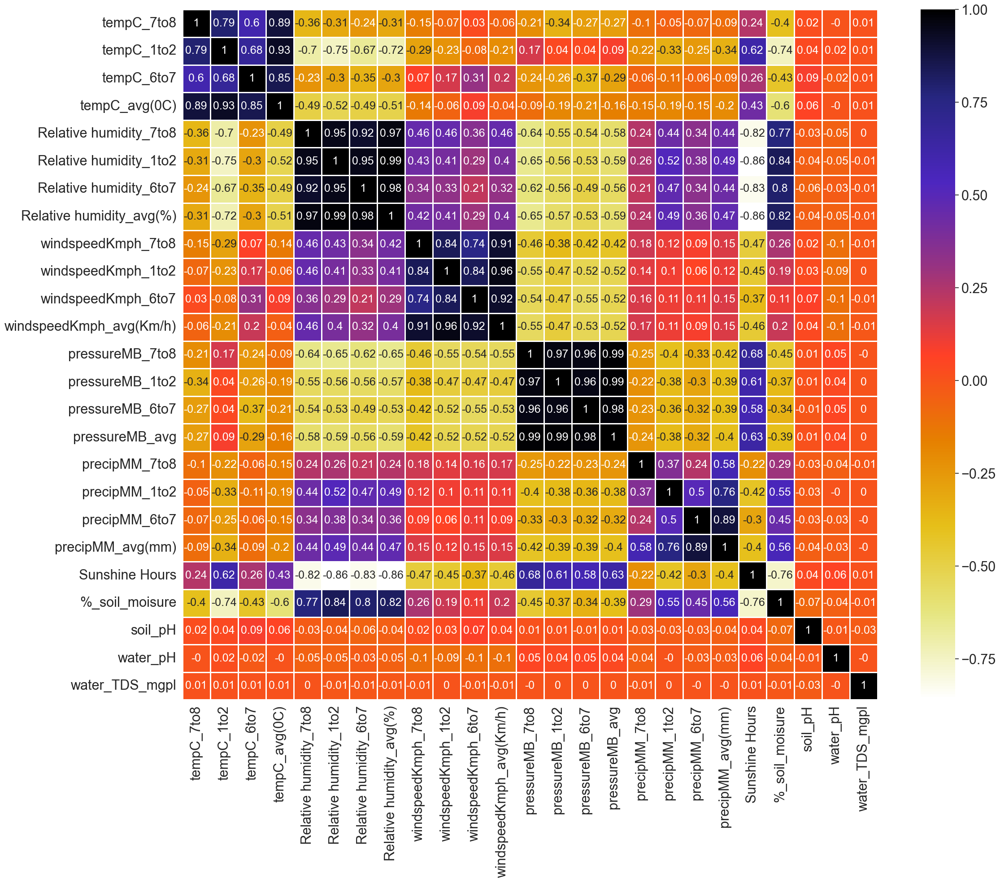

In [140]:
#Using Pearson Correlation
plt.figure(figsize=(25,20))
cor = X_train.corr()
sns.set(font_scale=2)

sns.heatmap(round(cor,2), annot=True, cmap=plt.cm.CMRmap_r, linewidths=1, linecolor='white',annot_kws={"size": 18})
plt.savefig('heatmap1.jpeg', dpi=500, bbox_inches='tight', facecolor='grey', edgecolor='blue',)
plt.show()

In [141]:
corr_features = correlation(X_train, 0.85)
len(set(corr_features))

10

In [142]:
corr_features

{'Relative humidity_1to2',
 'Relative humidity_6to7',
 'Relative humidity_avg(%)',
 'Sunshine Hours',
 'precipMM_avg(mm)',
 'pressureMB_1to2',
 'pressureMB_6to7',
 'pressureMB_avg',
 'tempC_avg(0C)',
 'windspeedKmph_avg(Km/h)'}

In [143]:
X_train.drop(corr_features,axis=1)
X_test.drop(corr_features,axis=1)

,tempC_7to8,tempC_1to2,tempC_6to7,Relative humidity_7to8,windspeedKmph_7to8,windspeedKmph_1to2,windspeedKmph_6to7,pressureMB_7to8,precipMM_7to8,precipMM_1to2,precipMM_6to7,weatherDesc_7to8,weatherDesc_1to2,weatherDesc_6to7,%_soil_moisure,soil_pH,water_pH,water_TDS_mgpl
2746,27,31,25,63,6,9,10,1010,0.0,0.0,0.1,Clear,Sunny,Sunny,48,7.10,6.73,1634.0
2871,24,32,25,31,9,5,2,1015,0.0,0.0,0.0,Sunny,Sunny,Clear,43,7.20,7.60,1709.0
1115,28,34,24,26,3,10,9,1015,0.0,0.0,0.0,Clear,Sunny,Sunny,41,6.87,8.39,1710.0
1350,25,29,22,40,10,12,11,1011,0.0,0.0,0.0,Clear,Sunny,Sunny,55,7.43,7.10,1710.0
1012,26,31,22,39,7,4,6,1012,0.0,0.0,0.0,Clear,Sunny,Sunny,48,7.41,8.20,1707.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1362,26,30,23,50,9,7,8,1017,0.0,0.0,0.0,Clear,Sunny,Sunny,45,6.64,7.63,1707.0
2729,27,30,27,77,12,5,3,1009,0.0,0.3,1.4,Partly cloudy,Light rain shower,Moderate or heavy rain shower,52,7.09,7.36,1707.0
617,25,28,21,64,4,7,6,1011,0.0,0.1,0.4,Clear,Patchy rain possible,Light rain shower,51,7.05,7.31,1707.0
3423,22,25,22,90,17,22,21,1005,0.0,0.2,0.0,Partly cloudy,Light rain shower,Mist,60,7.00,7.50,1708.0


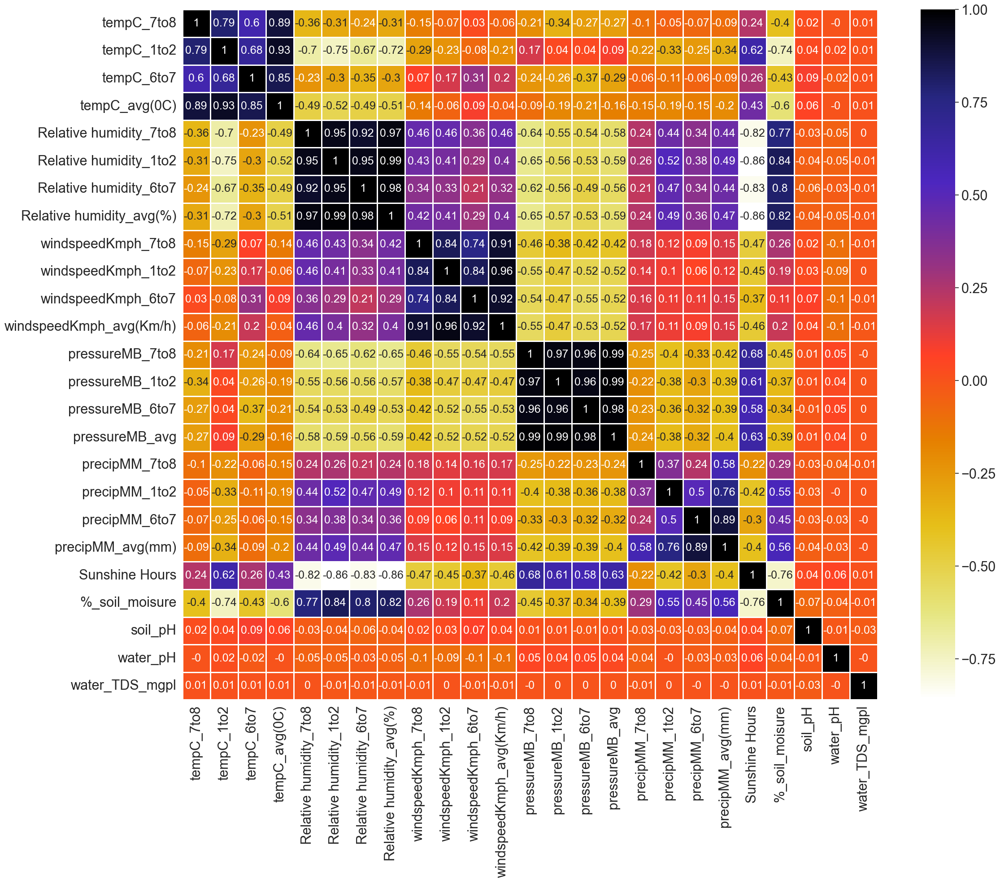

In [144]:
#Using Pearson Correlation
plt.figure(figsize=(25,20))
cor = X_train.corr()
sns.set(font_scale=2)

sns.heatmap(round(cor,2), annot=True, cmap=plt.cm.CMRmap_r, linewidths=1, linecolor='white',annot_kws={"size": 18})
# plt.savefig('heatmap1.jpeg', dpi=500, bbox_inches='tight', facecolor='grey', edgecolor='blue',)
plt.show()

# Feature Selection

- Information gain - mutual information

#### I(X ; Y) = H(X) – H(X | Y) Where I(X ; Y) is the mutual information for X and Y, H(X) is the entropy for X and H(X | Y) is the conditional entropy for X given Y. The result has the units of bits.

In [145]:
X = df[['tempC_avg(0C)', 'Relative humidity_avg(%)', 'windspeedKmph_avg(Km/h)', 'pressureMB_avg', 'precipMM_avg(mm)', 
        'Sunshine Hours', '%_soil_moisure', 'soil_pH', 'water_pH', 'water_TDS_mgpl']]
y = df['Label (Disease Yes/No)']

X.isnull().sum()

tempC_avg(0C)               0
Relative humidity_avg(%)    0
windspeedKmph_avg(Km/h)     0
pressureMB_avg              0
precipMM_avg(mm)            0
Sunshine Hours              0
%_soil_moisure              0
soil_pH                     0
water_pH                    0
water_TDS_mgpl              0
dtype: int64

In [146]:
# separate dataset into train and test
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, stratify=y) # random_state=0,

X_train.shape, X_test.shape

((2958, 10), (1269, 10))

In [147]:
from sklearn.feature_selection import mutual_info_classif
# determine the mutual information
mutual_info = mutual_info_classif(X_train, y_train)
mutual_info

array([0.0728999 , 0.30533772, 0.06284377, 0.18014918, 0.28765425,
       0.28934192, 0.27558199, 0.03028877, 0.00573482, 0.        ])

In [148]:
mutual_info = pd.Series(mutual_info)
mutual_info.index = X_train.columns
mutual_info.sort_values(ascending=False)

Relative humidity_avg(%)    0.305338
Sunshine Hours              0.289342
precipMM_avg(mm)            0.287654
%_soil_moisure              0.275582
pressureMB_avg              0.180149
tempC_avg(0C)               0.072900
windspeedKmph_avg(Km/h)     0.062844
soil_pH                     0.030289
water_pH                    0.005735
water_TDS_mgpl              0.000000
dtype: float64

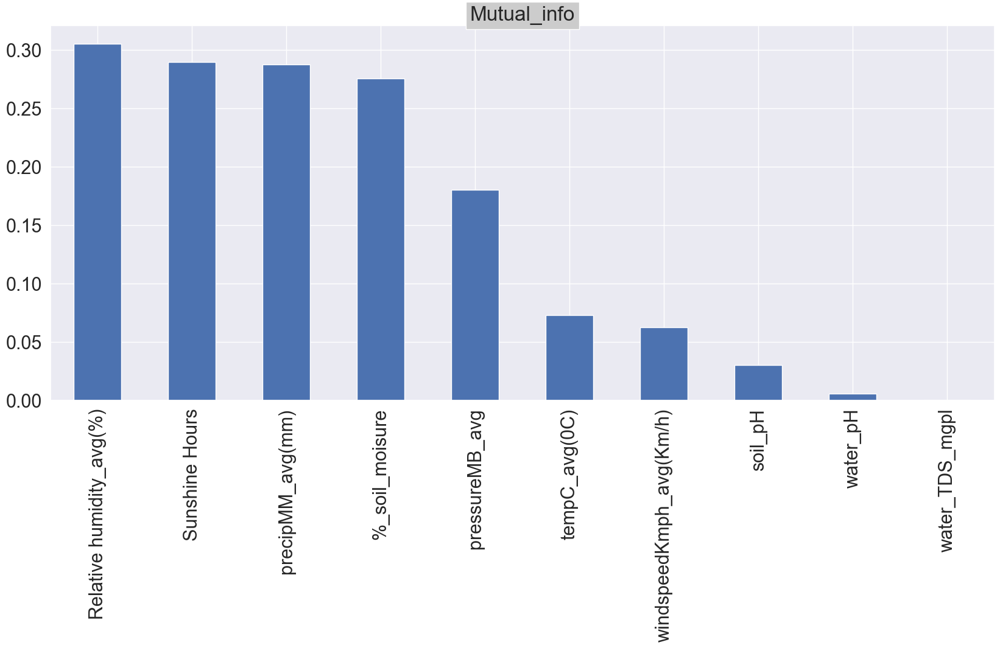

In [149]:
title('Mutual_info', bbox={'facecolor': '0.8', 'pad': 5})
#let's plot the ordered mutual_info values per feature
mutual_info.sort_values(ascending=False).plot.bar(figsize=(20, 8))
plt.savefig('mutual_info_classif.jpeg', dpi=500, bbox_inches='tight') # , facecolor='grey', edgecolor='blue',

In [150]:
from sklearn.feature_selection import SelectKBest

#No we Will select the  top 5 important features
sel_five_cols = SelectKBest(mutual_info_classif, k=5)
sel_five_cols.fit(X_train, y_train)
print(sel_five_cols)
X_train.columns[sel_five_cols.get_support()]

SelectKBest(k=5,
            score_func=<function mutual_info_classif at 0x000001DAE570C160>)


Index(['Relative humidity_avg(%)', 'pressureMB_avg', 'precipMM_avg(mm)',
       'Sunshine Hours', '%_soil_moisure'],
      dtype='object')

# Feature Selection

- Fisher Score - Chisquare Test 

In [151]:
X = df[['tempC_avg(0C)', 'Relative humidity_avg(%)', 'windspeedKmph_avg(Km/h)', 'pressureMB_avg', 'precipMM_avg(mm)', 
        'Sunshine Hours', '%_soil_moisure', 'soil_pH', 'water_pH', 'water_TDS_mgpl']]
y = df['Label (Disease Yes/No)']

X.isnull().sum()

tempC_avg(0C)               0
Relative humidity_avg(%)    0
windspeedKmph_avg(Km/h)     0
pressureMB_avg              0
precipMM_avg(mm)            0
Sunshine Hours              0
%_soil_moisure              0
soil_pH                     0
water_pH                    0
water_TDS_mgpl              0
dtype: int64

In [152]:
# separate dataset into train and test
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, stratify=y) # random_state=0,

X_train.shape, X_test.shape

((2958, 10), (1269, 10))

In [153]:
## Perform chi2 test
### chi2 returns 2 values
### Fscore and the pvalue
from sklearn.feature_selection import chi2
f_p_values=chi2(X_train,y_train)
f_p_values

(array([4.19531974e+01, 1.74634131e+04, 1.05478868e+03, 1.42813201e+01,
        3.82968996e+02, 1.01042151e+03, 2.50649593e+03, 1.83301545e-02,
        2.52494890e-01, 3.94685819e-02]),
 array([9.34843961e-011, 0.00000000e+000, 2.21561634e-231, 1.57419348e-004,
        2.80912263e-085, 9.75029118e-222, 0.00000000e+000, 8.92304399e-001,
        6.15323802e-001, 8.42523230e-001]))

In [154]:
p_values=pd.Series(f_p_values[1])
p_values.index=X_train.columns
p_values

tempC_avg(0C)                9.348440e-11
Relative humidity_avg(%)     0.000000e+00
windspeedKmph_avg(Km/h)     2.215616e-231
pressureMB_avg               1.574193e-04
precipMM_avg(mm)             2.809123e-85
Sunshine Hours              9.750291e-222
%_soil_moisure               0.000000e+00
soil_pH                      8.923044e-01
water_pH                     6.153238e-01
water_TDS_mgpl               8.425232e-01
dtype: float64

In [155]:
p_values.sort_index(ascending=False)

windspeedKmph_avg(Km/h)     2.215616e-231
water_pH                     6.153238e-01
water_TDS_mgpl               8.425232e-01
tempC_avg(0C)                9.348440e-11
soil_pH                      8.923044e-01
pressureMB_avg               1.574193e-04
precipMM_avg(mm)             2.809123e-85
Sunshine Hours              9.750291e-222
Relative humidity_avg(%)     0.000000e+00
%_soil_moisure               0.000000e+00
dtype: float64

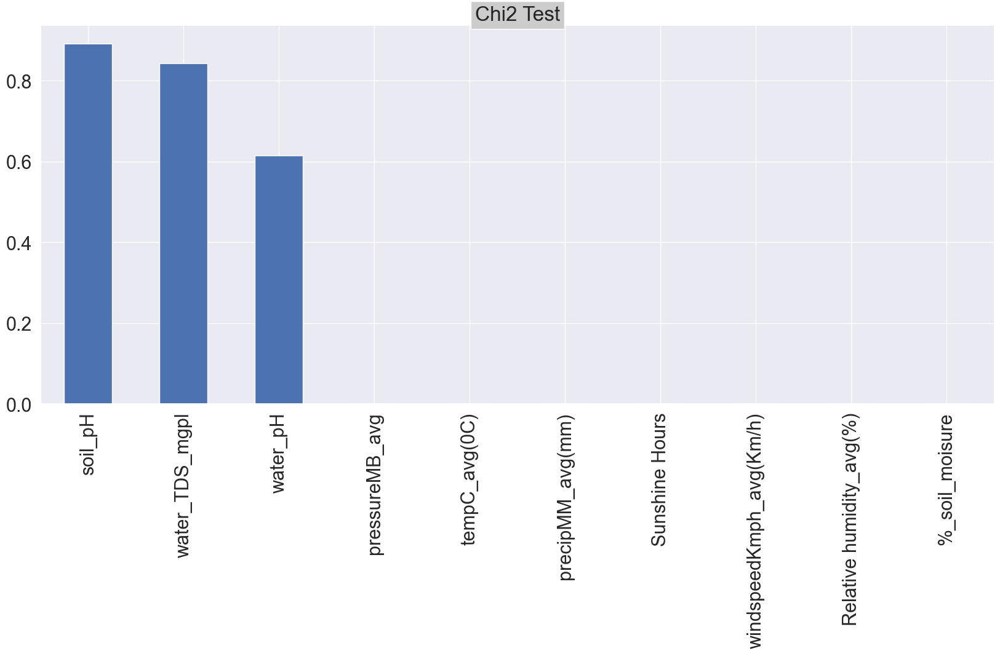

In [156]:
# giving labels to x-axis and y-axis
# sns.set(xlabel ='Labels', ylabel ='p_values')
title('Chi2 Test', bbox={'facecolor': '0.8', 'pad': 5})
#let's plot the ordered p_values per feature
p_values.sort_values(ascending=False).plot.bar(figsize=(20, 8))
plt.savefig('p_values.jpeg', dpi=500, bbox_inches='tight') # , facecolor='grey', edgecolor='blue',

# Test 2

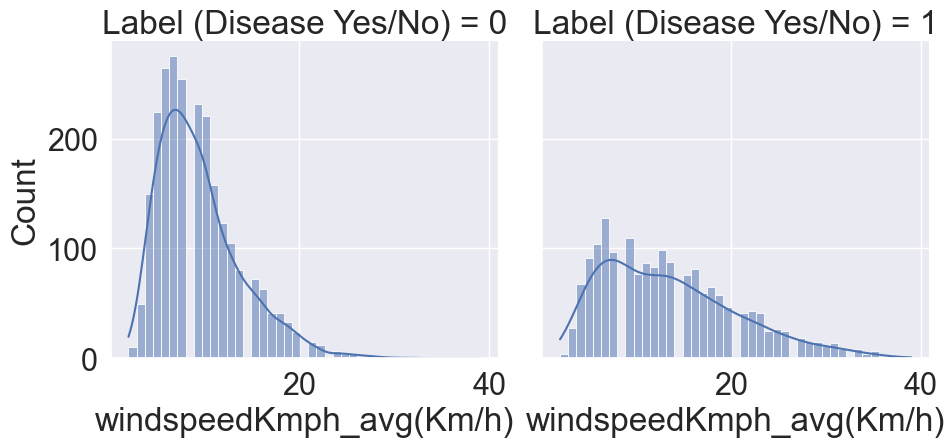

In [157]:
sns.displot(data=df, x="windspeedKmph_avg(Km/h)", col="Label (Disease Yes/No)", kde=True)
plt.show()

In [159]:
# plt.figure(figsize=(12,6))
# sns.catplot(data=df, kind="swarm", x="soil_pH", y="windspeedKmph_avg(Km/h)", hue="Label (Disease Yes/No)")
# plt.show()

<Figure size 1200x600 with 0 Axes>

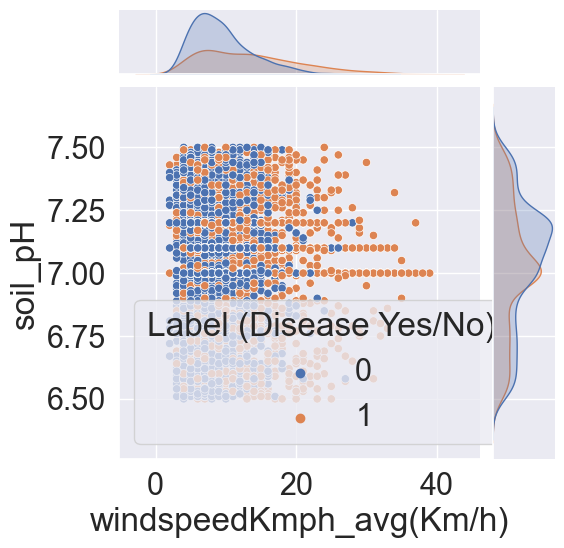

In [161]:
plt.figure(figsize=(12,6))
sns.jointplot(data=df, x="windspeedKmph_avg(Km/h)", y="soil_pH", hue="Label (Disease Yes/No)")

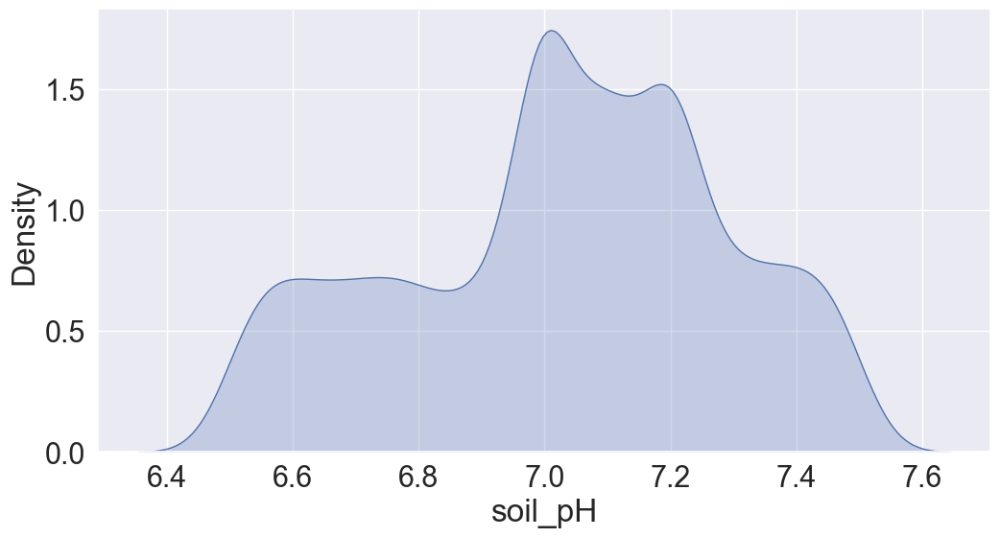

In [162]:
plt.figure(figsize=(12,6))
# plotting both distibutions on the same figure
# fig = sns.kdeplot(df['windspeedKmph_avg'], shade=True, color="r")
fig = sns.kdeplot(df['soil_pH'], shade=True, color="b")
plt.show()

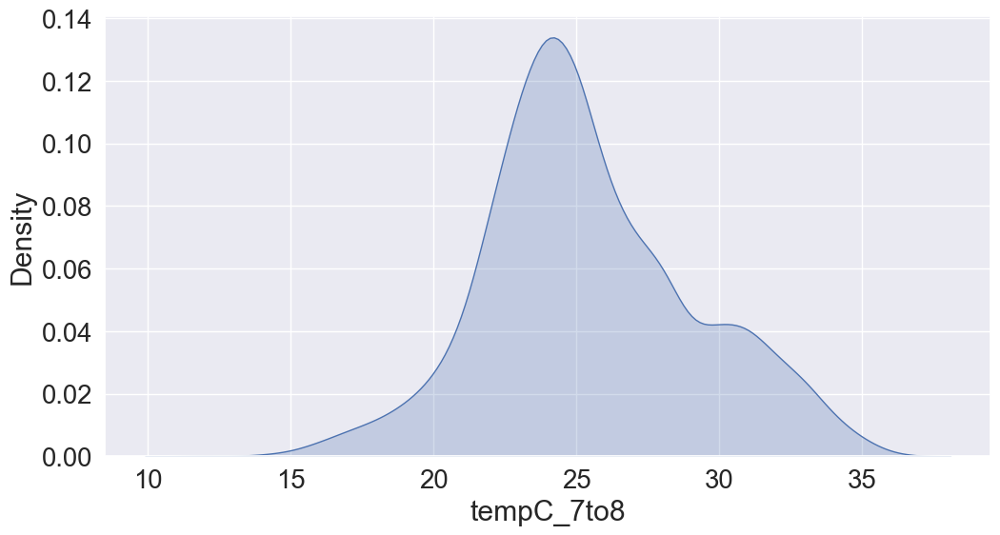

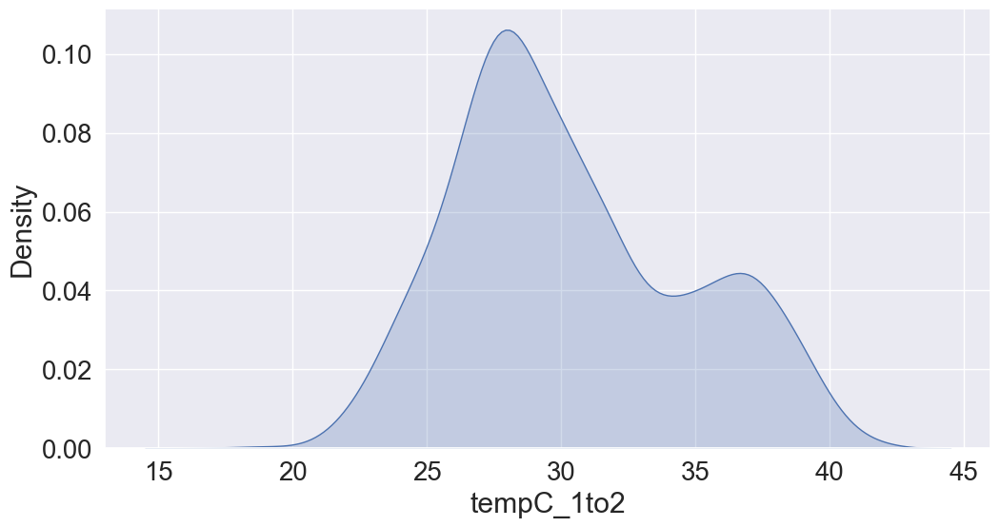

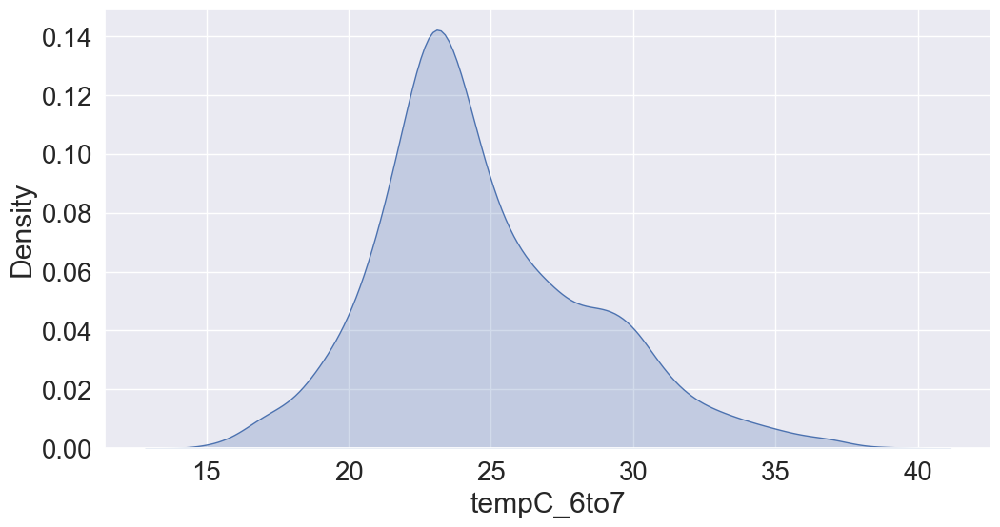

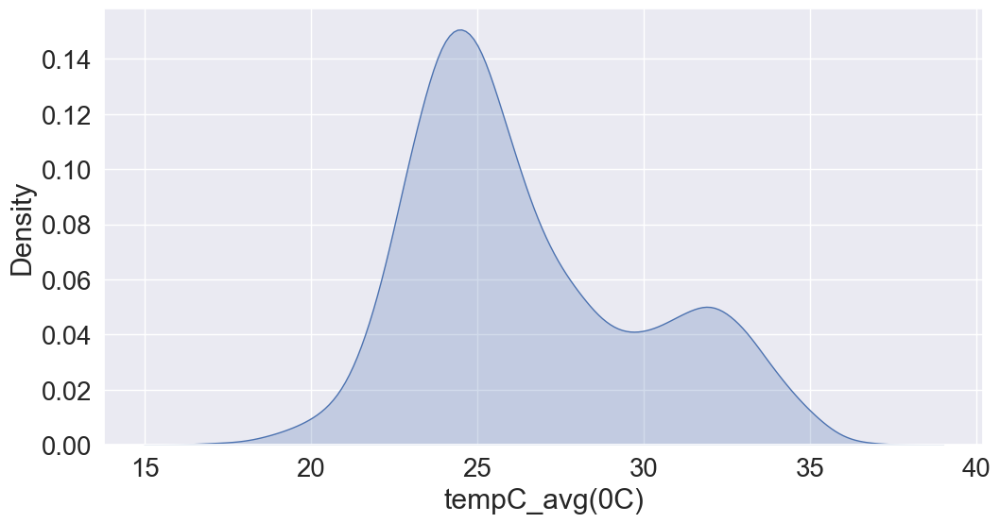

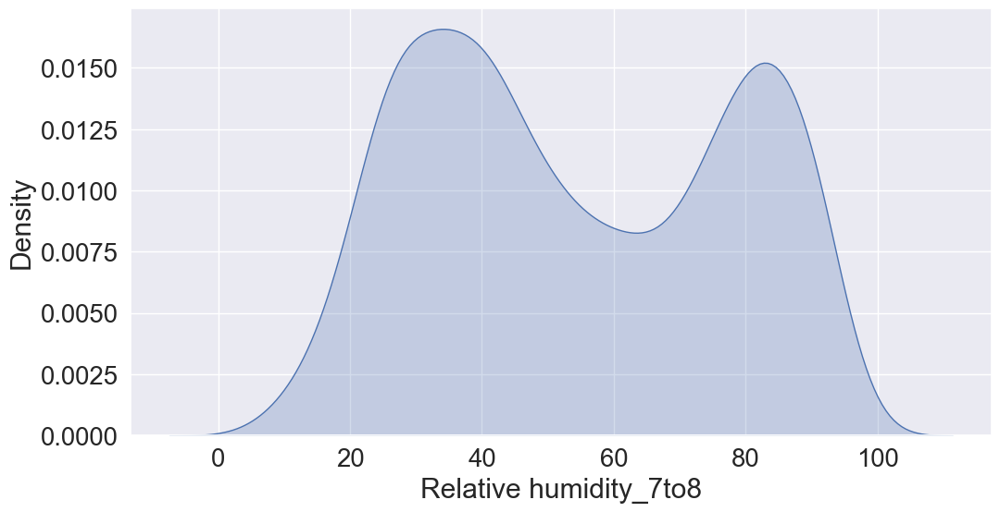

...

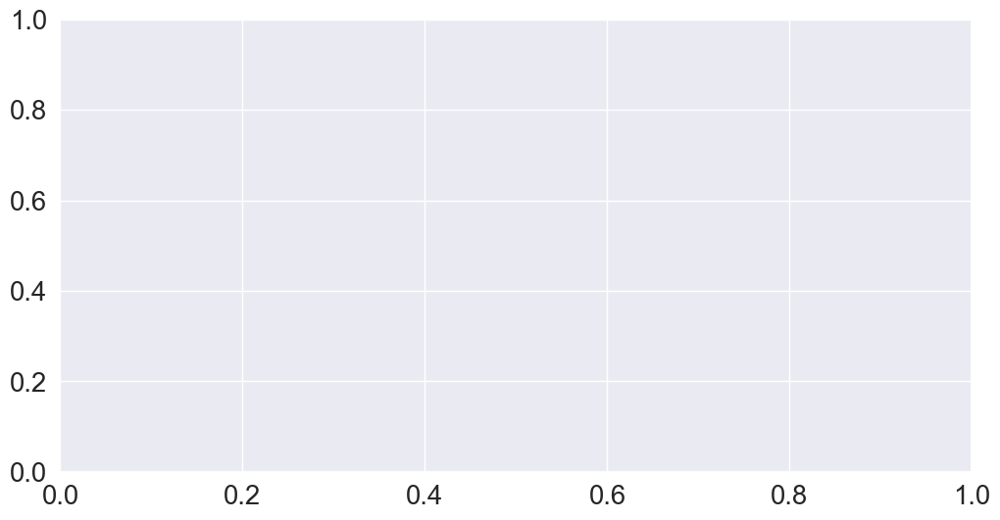

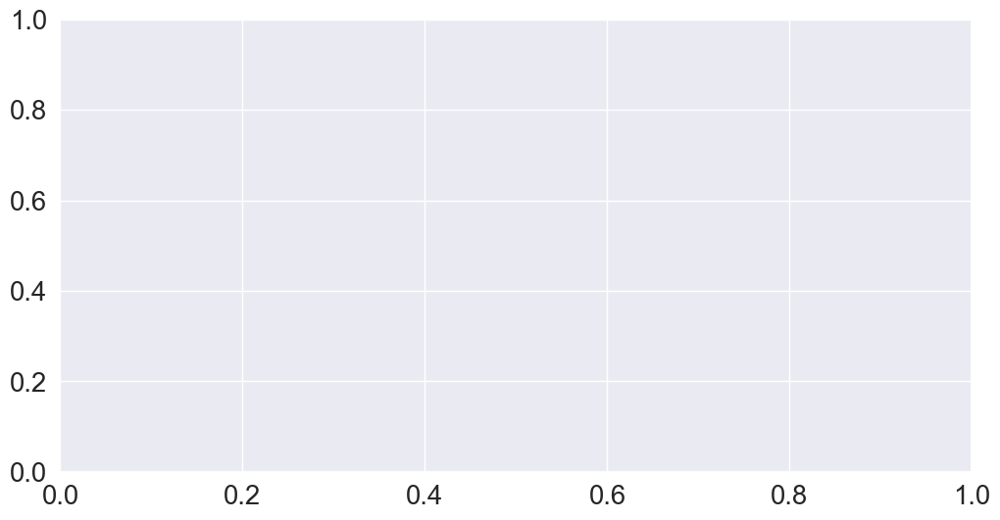

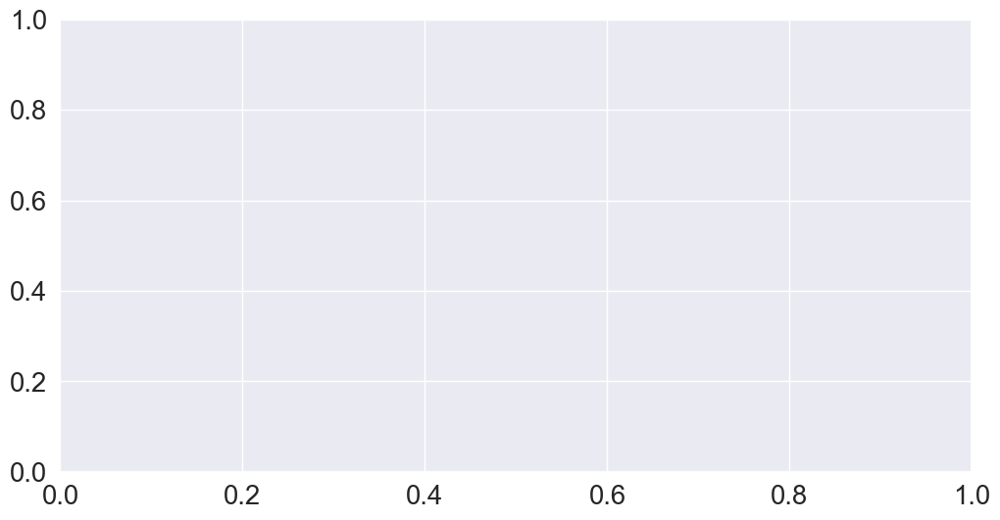

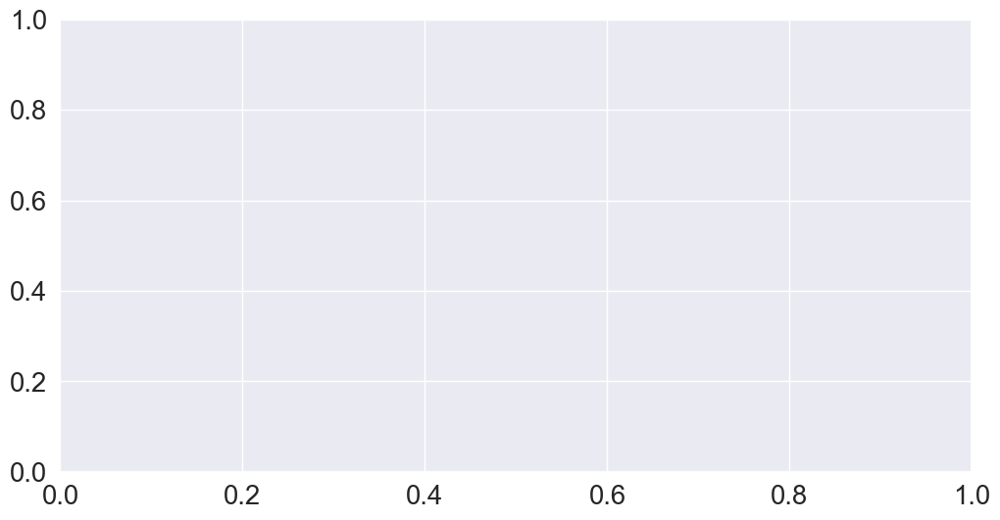

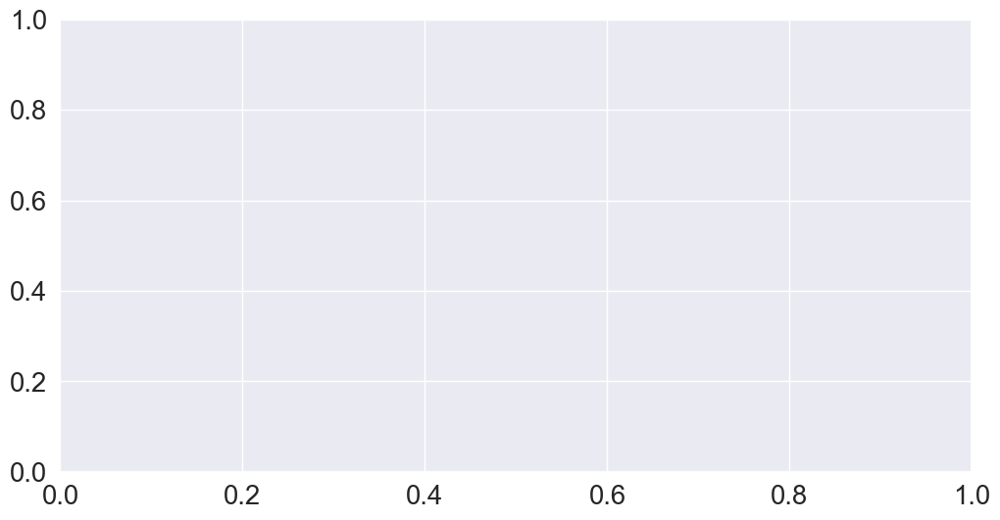

In [163]:
for col in df.columns[1:]:
    sns.set(font_scale=1.8)
    plt.figure(figsize=(12,6))
    try:
        # fig = sns.kdeplot(df['windspeedKmph_avg'], shade=True, color="r")
        fig = sns.kdeplot(df[col], shade=True, color="b")
        plt.show()
    except: pass

In [164]:
df['Fusarium Wilt'].value_counts()

Fusarium Wilt    103
Name: Fusarium Wilt, dtype: int64

In [165]:
df['Fusarium Wilt'] = np.where(df['Fusarium Wilt'] == 'Fusarium Wilt',1,0)

In [166]:
df['Fusarium Wilt'].unique()

array([0, 1])

In [167]:
df['Fusarium Wilt'].value_counts()

0    4124
1     103
Name: Fusarium Wilt, dtype: int64

In [168]:
df1 = df[['tempC_7to8', 'tempC_1to2', 'tempC_6to7', 'tempC_avg(0C)', 
          'Relative humidity_7to8', 'Relative humidity_1to2', 'Relative humidity_6to7', 'Relative humidity_avg(%)',
          'windspeedKmph_7to8', 'windspeedKmph_1to2', 'windspeedKmph_6to7', 'windspeedKmph_avg(Km/h)', 
          'pressureMB_7to8', 'pressureMB_1to2', 'pressureMB_6to7', 'pressureMB_avg', 
          'precipMM_7to8', 'precipMM_1to2', 'precipMM_6to7', 'precipMM_avg(mm)', 
          'weatherDesc_7to8', 'weatherDesc_1to2', 'weatherDesc_6to7', 
          'Sunshine Hours', '%_soil_moisure', 'soil_pH', 'water_pH', 'water_TDS_mgpl', 'Fusarium Wilt']]
df1.head()

,tempC_7to8,tempC_1to2,tempC_6to7,tempC_avg(0C),Relative humidity_7to8,Relative humidity_1to2,Relative humidity_6to7,Relative humidity_avg(%),windspeedKmph_7to8,windspeedKmph_1to2,...,precipMM_avg(mm),weatherDesc_7to8,weatherDesc_1to2,weatherDesc_6to7,Sunshine Hours,%_soil_moisure,soil_pH,water_pH,water_TDS_mgpl,Fusarium Wilt
0,20,30,20,23,42,33,59,44,9,2,...,0.0,Clear,Sunny,Sunny,9.8,45,6.91,7.18,1709.0,0
1,23,29,23,25,49,40,62,50,9,3,...,0.0,Clear,Partly cloudy,Partly cloudy,9.8,45,6.77,7.66,1707.0,0
2,24,27,21,24,61,50,78,63,4,8,...,0.0,Partly cloudy,Partly cloudy,Partly cloudy,9.8,41,6.76,7.44,1707.0,0
3,23,29,20,24,57,30,52,46,5,7,...,0.0,Clear,Sunny,Sunny,9.8,43,7.10,7.43,1708.0,0
4,22,30,21,24,48,34,54,45,6,2,...,0.0,Clear,Sunny,Sunny,9.8,44,6.53,8.05,1709.0,0


# Feature Selection

- With Correlation (pearson correlation) with Y

In [169]:
print(df1.isnull().sum())
print('\n')
df1['Sunshine Hours'].fillna(df1['Sunshine Hours'].mean(), inplace = True)
print(df1.isnull().sum())

tempC_7to8                  0
tempC_1to2                  0
tempC_6to7                  0
tempC_avg(0C)               0
Relative humidity_7to8      0
Relative humidity_1to2      0
Relative humidity_6to7      0
Relative humidity_avg(%)    0
windspeedKmph_7to8          0
windspeedKmph_1to2          0
windspeedKmph_6to7          0
windspeedKmph_avg(Km/h)     0
pressureMB_7to8             0
pressureMB_1to2             0
pressureMB_6to7             0
pressureMB_avg              0
precipMM_7to8               0
precipMM_1to2               0
precipMM_6to7               0
precipMM_avg(mm)            0
weatherDesc_7to8            0
weatherDesc_1to2            0
weatherDesc_6to7            0
Sunshine Hours              0
%_soil_moisure              0
soil_pH                     0
water_pH                    0
water_TDS_mgpl              0
Fusarium Wilt               0
dtype: int64


tempC_7to8                  0
tempC_1to2                  0
tempC_6to7                  0
tempC_avg(0C)            

C:\Users\munge\AppData\Local\Temp\ipykernel_20912\1414325398.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df1['Sunshine Hours'].fillna(df1['Sunshine Hours'].mean(), inplace = True)


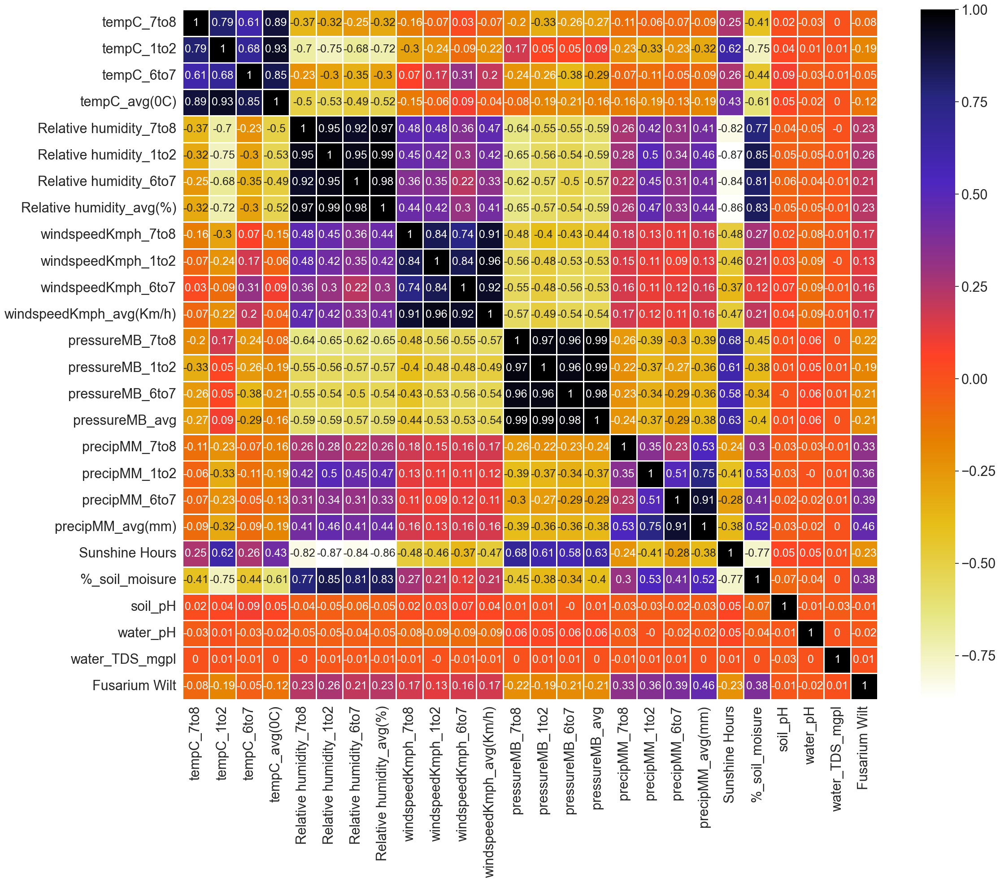

In [170]:
#Using Pearson Correlation
plt.figure(figsize=(25,20))
cor = df1.corr()
sns.set(font_scale=2)

sns.heatmap(round(cor,2), annot=True, cmap=plt.cm.CMRmap_r, linewidths=1, linecolor='white',annot_kws={"size": 18})
plt.savefig('heatmap1.jpeg', dpi=500, bbox_inches='tight', facecolor='grey', edgecolor='blue',)
plt.show()

In [171]:
X = df1[['tempC_7to8', 'tempC_1to2', 'tempC_6to7', 'tempC_avg(0C)', 
          'Relative humidity_7to8', 'Relative humidity_1to2', 'Relative humidity_6to7', 'Relative humidity_avg(%)',
          'windspeedKmph_7to8', 'windspeedKmph_1to2', 'windspeedKmph_6to7', 'windspeedKmph_avg(Km/h)', 
          'pressureMB_7to8', 'pressureMB_1to2', 'pressureMB_6to7', 'pressureMB_avg', 
          'precipMM_7to8', 'precipMM_1to2', 'precipMM_6to7', 'precipMM_avg(mm)', 
          'Sunshine Hours', '%_soil_moisure', 'soil_pH', 'water_pH', 'water_TDS_mgpl']]
y = df1['Fusarium Wilt']

X.isnull().sum()

tempC_7to8                  0
tempC_1to2                  0
tempC_6to7                  0
tempC_avg(0C)               0
Relative humidity_7to8      0
Relative humidity_1to2      0
Relative humidity_6to7      0
Relative humidity_avg(%)    0
windspeedKmph_7to8          0
windspeedKmph_1to2          0
windspeedKmph_6to7          0
windspeedKmph_avg(Km/h)     0
pressureMB_7to8             0
pressureMB_1to2             0
pressureMB_6to7             0
pressureMB_avg              0
precipMM_7to8               0
precipMM_1to2               0
precipMM_6to7               0
precipMM_avg(mm)            0
Sunshine Hours              0
%_soil_moisure              0
soil_pH                     0
water_pH                    0
water_TDS_mgpl              0
dtype: int64

In [172]:
# separate dataset into train and test
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, stratify=y) # random_state=0,

print(X_train.shape, X_test.shape)

from sklearn.feature_selection import mutual_info_classif
# determine the mutual information
mutual_info = mutual_info_classif(X_train, y_train)
mutual_info


(2958, 25) (1269, 25)


array([0.00876149, 0.03667278, 0.00672373, 0.01104662, 0.03691183,
       0.04274842, 0.02969274, 0.04248351, 0.01646266, 0.00693221,
       0.01535046, 0.01376677, 0.02821142, 0.02320659, 0.02695026,
       0.02917152, 0.02127762, 0.03268104, 0.03857514, 0.04716319,
       0.03047681, 0.10494537, 0.01498307, 0.00800181, 0.        ])

In [173]:
mutual_info = pd.Series(mutual_info)
mutual_info.index = X_train.columns
mutual_info.sort_values(ascending=False)

%_soil_moisure              0.104945
precipMM_avg(mm)            0.047163
Relative humidity_1to2      0.042748
Relative humidity_avg(%)    0.042484
precipMM_6to7               0.038575
Relative humidity_7to8      0.036912
tempC_1to2                  0.036673
precipMM_1to2               0.032681
Sunshine Hours              0.030477
Relative humidity_6to7      0.029693
pressureMB_avg              0.029172
pressureMB_7to8             0.028211
pressureMB_6to7             0.026950
pressureMB_1to2             0.023207
precipMM_7to8               0.021278
windspeedKmph_7to8          0.016463
windspeedKmph_6to7          0.015350
soil_pH                     0.014983
windspeedKmph_avg(Km/h)     0.013767
tempC_avg(0C)               0.011047
tempC_7to8                  0.008761
water_pH                    0.008002
windspeedKmph_1to2          0.006932
tempC_6to7                  0.006724
water_TDS_mgpl              0.000000
dtype: float64

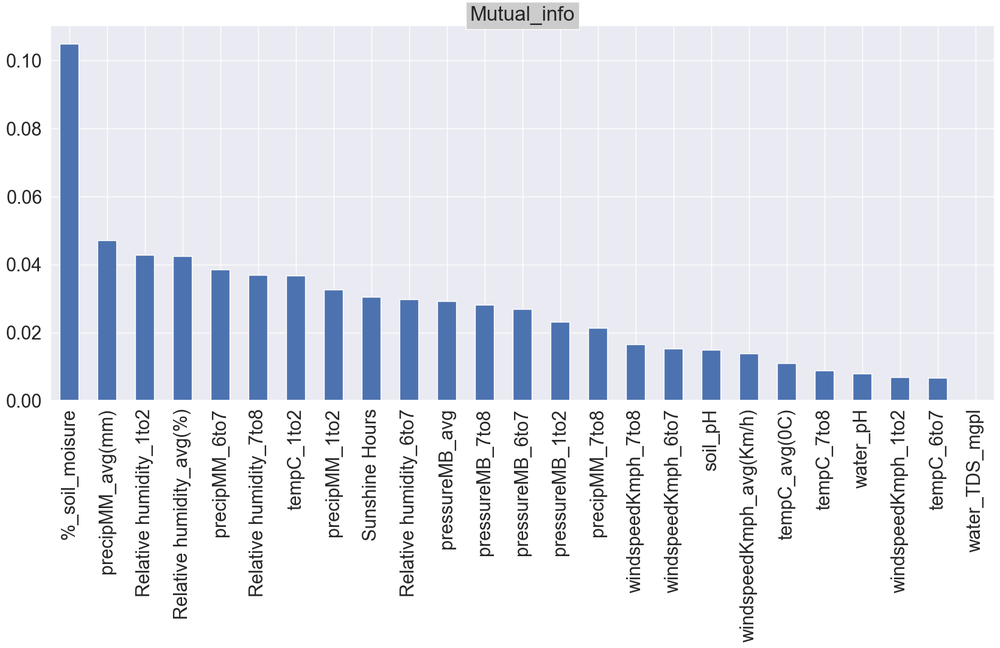

In [174]:
title('Mutual_info', bbox={'facecolor': '0.8', 'pad': 5})
#let's plot the ordered mutual_info values per feature
mutual_info.sort_values(ascending=False).plot.bar(figsize=(20, 8))
plt.savefig('mutual_info_classif1.jpeg', dpi=500, bbox_inches='tight') # , facecolor='grey', edgecolor='blue',

In [175]:
df2 = df[['tempC_avg(0C)', 'Relative humidity_avg(%)', 'windspeedKmph_avg(Km/h)', 'pressureMB_avg', 'precipMM_avg(mm)', 
 'weatherDesc_7to8', 'weatherDesc_1to2', 'weatherDesc_6to7', 'Sunshine Hours', '%_soil_moisure', 'soil_pH', 'water_pH', 
 'water_TDS_mgpl', 'Fusarium Wilt']]

df2

,tempC_avg(0C),Relative humidity_avg(%),windspeedKmph_avg(Km/h),pressureMB_avg,precipMM_avg(mm),weatherDesc_7to8,weatherDesc_1to2,weatherDesc_6to7,Sunshine Hours,%_soil_moisure,soil_pH,water_pH,water_TDS_mgpl,Fusarium Wilt
0,23,44,5,1013,0.000000,Clear,Sunny,Sunny,9.8,45,6.91,7.18,1709.0,0
1,25,50,5,1014,0.000000,Clear,Partly cloudy,Partly cloudy,9.8,45,6.77,7.66,1707.0,0
2,24,63,6,1015,0.000000,Partly cloudy,Partly cloudy,Partly cloudy,9.8,41,6.76,7.44,1707.0,0
3,24,46,6,1013,0.000000,Clear,Sunny,Sunny,9.8,43,7.10,7.43,1708.0,0
4,24,45,4,1011,0.000000,Clear,Sunny,Sunny,9.8,44,6.53,8.05,1709.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4222,26,46,6,1011,0.000000,Clear,Sunny,Sunny,9.7,41,7.17,7.69,1707.0,0
4223,26,43,9,1012,0.000000,Clear,Sunny,Sunny,9.7,42,7.46,8.22,1709.0,0
4224,22,38,15,1014,0.000000,Clear,Sunny,Sunny,9.7,44,7.38,7.92,1709.0,0
4225,22,52,15,1013,0.033333,Clear,Sunny,Light rain shower,9.6,41,7.01,7.16,1630.2,0


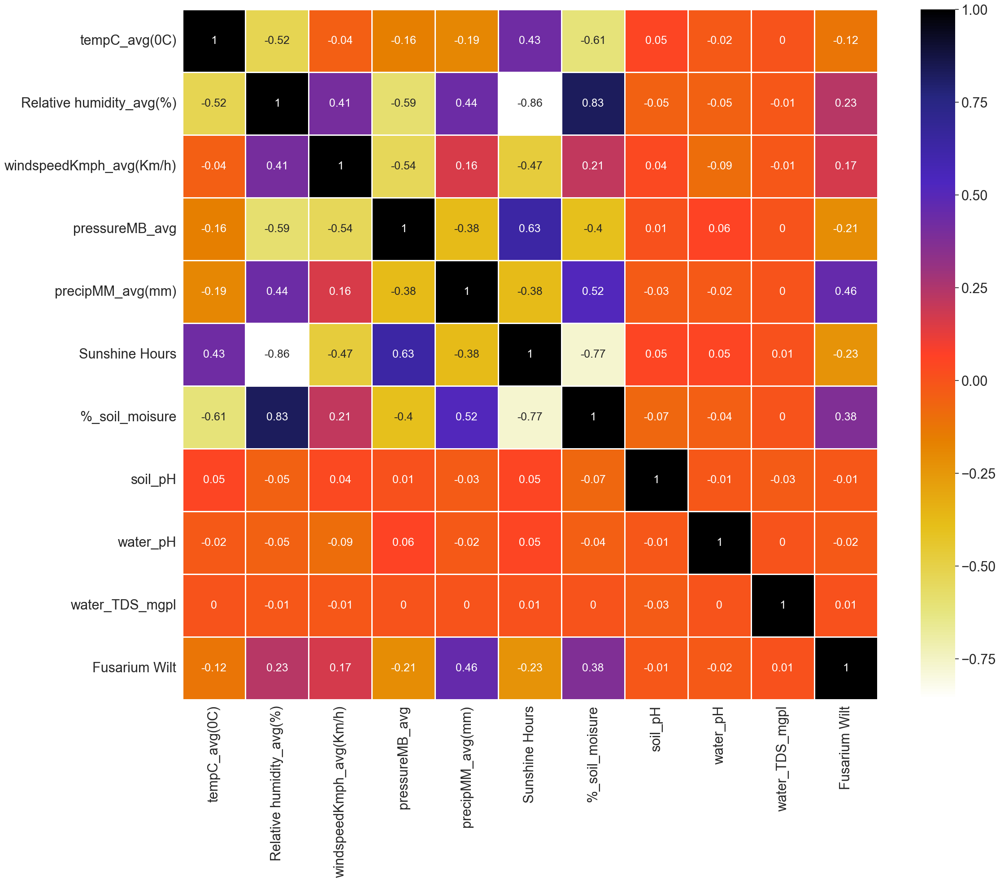

In [177]:
#Using Pearson Correlation
plt.figure(figsize=(25,20))
cor = df2.corr()
sns.set(font_scale=2)

sns.heatmap(round(cor,2), annot=True, cmap=plt.cm.CMRmap_r, linewidths=1, linecolor='white',annot_kws={"size": 18})
plt.savefig('heatmap2.jpeg', dpi=500, bbox_inches='tight', facecolor='grey', edgecolor='blue',)
plt.show()

In [178]:
X = df2[['tempC_avg(0C)', 'Relative humidity_avg(%)', 'windspeedKmph_avg(Km/h)', 'pressureMB_avg', 'precipMM_avg(mm)', 
 'Sunshine Hours', '%_soil_moisure', 'soil_pH', 'water_pH', 'water_TDS_mgpl']]
y = df2['Fusarium Wilt']

X.isnull().sum()

tempC_avg(0C)               0
Relative humidity_avg(%)    0
windspeedKmph_avg(Km/h)     0
pressureMB_avg              0
precipMM_avg(mm)            0
Sunshine Hours              0
%_soil_moisure              0
soil_pH                     0
water_pH                    0
water_TDS_mgpl              0
dtype: int64

In [179]:
# separate dataset into train and test
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, stratify=y) # random_state=0,

print(X_train.shape, X_test.shape)

from sklearn.feature_selection import mutual_info_classif
# determine the mutual information
mutual_info = mutual_info_classif(X_train, y_train)
print(mutual_info)

mutual_info = pd.Series(mutual_info)
mutual_info.index = X_train.columns
mutual_info.sort_values(ascending=False)

(2958, 10) (1269, 10)
[0.01410077 0.04101649 0.00901225 0.02028824 0.04121168 0.02324631
 0.10457491 0.01421664 0.00476389 0.        ]


%_soil_moisure              0.104575
precipMM_avg(mm)            0.041212
Relative humidity_avg(%)    0.041016
Sunshine Hours              0.023246
pressureMB_avg              0.020288
soil_pH                     0.014217
tempC_avg(0C)               0.014101
windspeedKmph_avg(Km/h)     0.009012
water_pH                    0.004764
water_TDS_mgpl              0.000000
dtype: float64

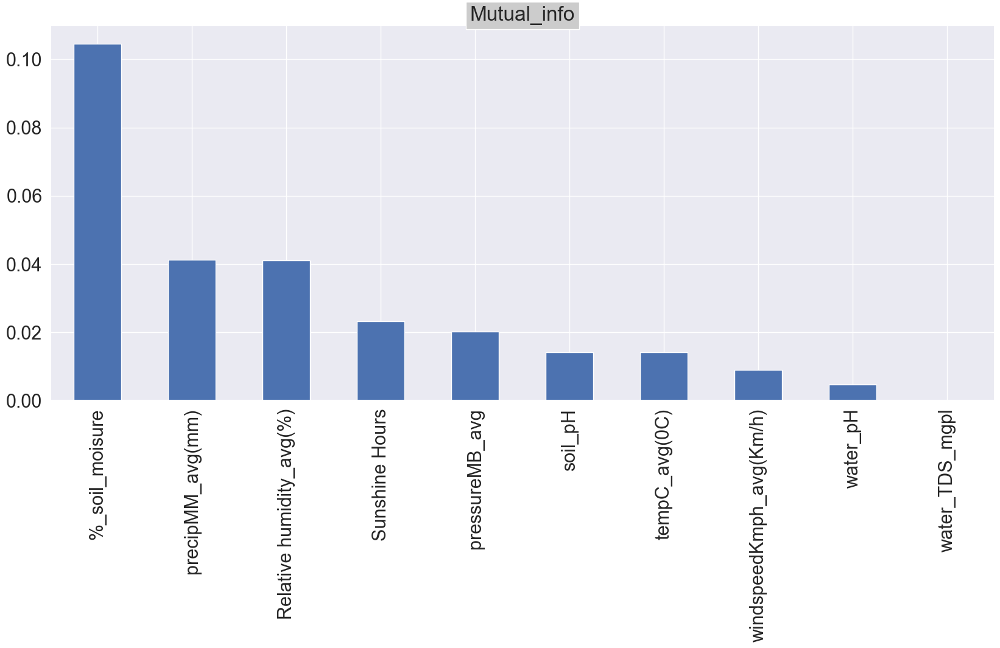

In [180]:
title('Mutual_info', bbox={'facecolor': '0.8', 'pad': 5})
#let's plot the ordered mutual_info values per feature
mutual_info.sort_values(ascending=False).plot.bar(figsize=(20, 8))
plt.savefig('mutual_info_classif2.jpeg', dpi=500, bbox_inches='tight') # , facecolor='grey', edgecolor='blue',    

# EDA 3

In [181]:
# load dataset
df = pd.read_excel(r'part6\Historical Weather Data 2010-2021.xlsx', sheet_name='201021')
df.head()

,observation,tempC_7to8,tempC_1to2,tempC_6to7,tempC_avg(0C),Relative humidity_7to8,Relative humidity_1to2,Relative humidity_6to7,Relative humidity_avg(%),windspeedKmph_7to8,...,%_soil_moisure,soil_pH,water_pH,water_TDS_mgpl,Label (Disease Yes/No),Type of Disease (Bacterial Blight/Telya),Anthracnose,Fruit Spot/ Rot,Fusarium Wilt,Fruit Borer / Blight Blora
0,2010-01-01,20,30,20,23,42,33,59,44,9,...,45,6.91,7.18,1709.0,NO,NaN,NaN,NaN,NaN,NaN
1,2010-01-02,23,29,23,25,49,40,62,50,9,...,45,6.77,7.66,1707.0,YES,Bacterial Blight,Anthracnose,NaN,NaN,NaN
2,2010-01-03,24,27,21,24,61,50,78,63,4,...,41,6.76,7.44,1707.0,NO,NaN,NaN,NaN,NaN,NaN
3,2010-01-04,23,29,20,24,57,30,52,46,5,...,43,7.10,7.43,1708.0,NO,NaN,NaN,NaN,NaN,NaN
4,2010-01-05,22,30,21,24,48,34,54,45,6,...,44,6.53,8.05,1709.0,NO,NaN,NaN,NaN,NaN,NaN


In [182]:
# dataframe raw information
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4227 entries, 0 to 4226
Data columns (total 35 columns):
 #   Column                                    Non-Null Count  Dtype         
---  ------                                    --------------  -----         
 0   observation                               4227 non-null   datetime64[ns]
 1   tempC_7to8                                4227 non-null   int64         
 2   tempC_1to2                                4227 non-null   int64         
 3   tempC_6to7                                4227 non-null   int64         
 4   tempC_avg(0C)                             4227 non-null   int64         
 5   Relative humidity_7to8                    4227 non-null   int64         
 6   Relative humidity_1to2                    4227 non-null   int64         
 7   Relative humidity_6to7                    4227 non-null   int64         
 8   Relative humidity_avg(%)                  4227 non-null   int64         
 9   windspeedKmph_7to8            

# Observation:
- null values with columns :- 

> 30  Type of Disease (Bacterial Blight/Telya)  1174 non-null   object        
> 31  Anthracnose                               676 non-null    object        
> 32  Fruit Spot/ Rot                           464 non-null    object        
> 33  Fusarium Wilt                             103 non-null    object        
> 34  Fruit Borer / Blight Blora                787 non-null    object

- categorical columns :- 

> 21  weatherDesc_7to8                          4227 non-null   object        
> 22  weatherDesc_1to2                          4227 non-null   object        
> 23  weatherDesc_6to7                          4227 non-null   object
> 29  Label (Disease Yes/No)                    4227 non-null   object        
> 30  Type of Disease (Bacterial Blight/Telya)  1174 non-null   object        
> 31  Anthracnose                               676 non-null    object        
> 32  Fruit Spot/ Rot                           464 non-null    object        
> 33  Fusarium Wilt                             103 non-null    object        
> 34  Fruit Borer / Blight Blora                787 non-null    object 


In [183]:
# to check only data type of columns
df.dtypes

observation                                 datetime64[ns]
tempC_7to8                                           int64
tempC_1to2                                           int64
tempC_6to7                                           int64
tempC_avg(0C)                                        int64
Relative humidity_7to8                               int64
Relative humidity_1to2                               int64
Relative humidity_6to7                               int64
Relative humidity_avg(%)                             int64
windspeedKmph_7to8                                   int64
windspeedKmph_1to2                                   int64
windspeedKmph_6to7                                   int64
windspeedKmph_avg(Km/h)                              int64
pressureMB_7to8                                      int64
pressureMB_1to2                                      int64
pressureMB_6to7                                      int64
pressureMB_avg                                       int

In [184]:
df['Label (Disease Yes/No)'].unique()

array(['NO', 'YES', 'yes', 'Yes'], dtype=object)

In [185]:
df['Label (Disease Yes/No)'].value_counts()

NO     2470
YES    1746
yes      10
Yes       1
Name: Label (Disease Yes/No), dtype: int64

In [186]:
df['Label (Disease Yes/No)'] = np.where(df['Label (Disease Yes/No)'] == 'NO',0,1)
df.head()

,observation,tempC_7to8,tempC_1to2,tempC_6to7,tempC_avg(0C),Relative humidity_7to8,Relative humidity_1to2,Relative humidity_6to7,Relative humidity_avg(%),windspeedKmph_7to8,...,%_soil_moisure,soil_pH,water_pH,water_TDS_mgpl,Label (Disease Yes/No),Type of Disease (Bacterial Blight/Telya),Anthracnose,Fruit Spot/ Rot,Fusarium Wilt,Fruit Borer / Blight Blora
0,2010-01-01,20,30,20,23,42,33,59,44,9,...,45,6.91,7.18,1709.0,0,NaN,NaN,NaN,NaN,NaN
1,2010-01-02,23,29,23,25,49,40,62,50,9,...,45,6.77,7.66,1707.0,1,Bacterial Blight,Anthracnose,NaN,NaN,NaN
2,2010-01-03,24,27,21,24,61,50,78,63,4,...,41,6.76,7.44,1707.0,0,NaN,NaN,NaN,NaN,NaN
3,2010-01-04,23,29,20,24,57,30,52,46,5,...,43,7.10,7.43,1708.0,0,NaN,NaN,NaN,NaN,NaN
4,2010-01-05,22,30,21,24,48,34,54,45,6,...,44,6.53,8.05,1709.0,0,NaN,NaN,NaN,NaN,NaN


In [187]:
df['Label (Disease Yes/No)'].value_counts()

0    2470
1    1757
Name: Label (Disease Yes/No), dtype: int64

# Observation:
- categorical variables converted to number.
- **Dummy Coding:** Dummy coding is a commonly used method for converting a categorical input variable into continuous variable. ‘Dummy’, as the name suggests is a duplicate variable which represents one level of a categorical variable. Presence of a level is represent by 1 and absence is represented by 0. For every level present, one dummy variable will be created.

In [189]:
round(df.describe(),2)

,tempC_7to8,tempC_1to2,tempC_6to7,tempC_avg(0C),Relative humidity_7to8,Relative humidity_1to2,Relative humidity_6to7,Relative humidity_avg(%),windspeedKmph_7to8,windspeedKmph_1to2,...,precipMM_7to8,precipMM_1to2,precipMM_6to7,precipMM_avg(mm),Sunshine Hours,%_soil_moisure,soil_pH,water_pH,water_TDS_mgpl,Label (Disease Yes/No)
count,4227.00,4227.00,4227.00,4227.00,4227.00,4227.00,4227.00,4227.00,4227.00,4227.00,...,4227.00,4227.00,4227.00,4227.00,4227.00,4227.00,4227.00,4227.00,4227.00,4227.00
mean,25.44,30.35,24.68,26.49,54.34,41.96,57.38,50.89,10.16,12.70,...,0.05,0.13,0.21,0.13,8.29,45.42,7.03,7.48,1703.47,0.42
std,3.71,4.41,3.80,3.56,23.71,25.75,25.95,24.64,5.86,7.13,...,0.29,0.34,0.79,0.38,2.61,10.34,0.26,0.50,19.38,0.49
min,12.00,17.00,15.00,17.00,6.00,4.00,8.00,6.00,1.00,1.00,...,0.00,0.00,0.00,0.00,3.80,30.00,6.50,6.50,1624.50,0.00
25%,23.00,27.00,22.00,24.00,34.00,19.00,34.00,29.00,6.00,7.00,...,0.00,0.00,0.00,0.00,5.40,35.00,6.85,7.12,1707.00,0.00
50%,25.00,29.00,24.00,26.00,51.00,33.00,52.00,45.00,9.00,12.00,...,0.00,0.00,0.00,0.00,9.60,44.00,7.04,7.50,1708.00,0.00
75%,28.00,33.00,27.00,29.00,78.00,67.00,85.50,77.00,13.00,17.00,...,0.00,0.10,0.10,0.10,10.40,52.00,7.20,7.80,1709.00,1.00
max,36.00,42.00,39.00,37.00,98.00,98.00,99.00,98.00,42.00,41.00,...,10.20,7.00,22.00,8.30,11.20,85.00,7.50,8.50,1710.00,1.00


In [190]:
# Find null values
df.isnull().sum()

observation                                    0
tempC_7to8                                     0
tempC_1to2                                     0
tempC_6to7                                     0
tempC_avg(0C)                                  0
Relative humidity_7to8                         0
Relative humidity_1to2                         0
Relative humidity_6to7                         0
Relative humidity_avg(%)                       0
windspeedKmph_7to8                             0
windspeedKmph_1to2                             0
windspeedKmph_6to7                             0
windspeedKmph_avg(Km/h)                        0
pressureMB_7to8                                0
pressureMB_1to2                                0
pressureMB_6to7                                0
pressureMB_avg                                 0
precipMM_7to8                                  0
precipMM_1to2                                  0
precipMM_6to7                                  0
precipMM_avg(mm)    

In [191]:
[feature for feature in df.columns if df[feature].isnull().sum()>1]

['Type of Disease (Bacterial Blight/Telya)',
 'Anthracnose',
 'Fruit Spot/ Rot',
 'Fusarium Wilt',
 'Fruit Borer / Blight Blora']

<Axes: >

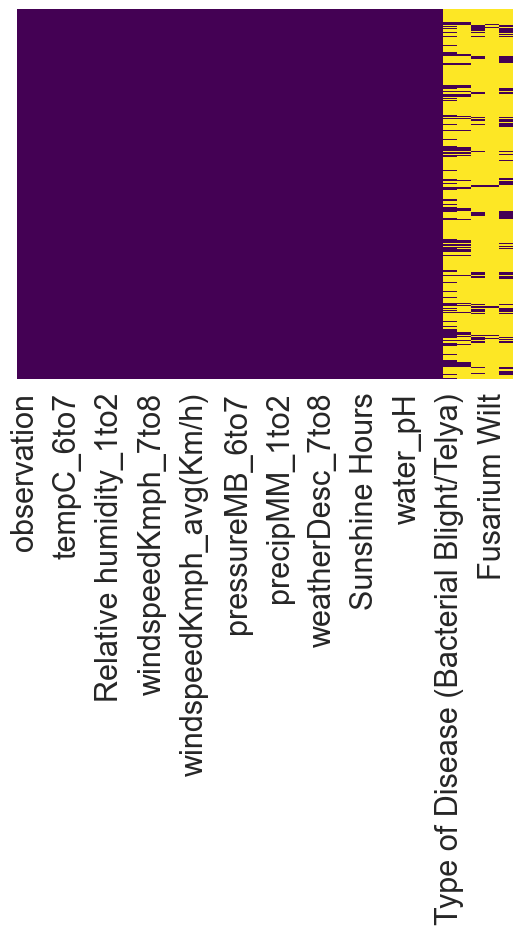

In [192]:
sns.heatmap(df.isnull(), yticklabels=False, cbar=False, cmap='viridis')

# Observation:

- ['Type of Disease (Bacterial Blight/Telya)', 'Anthracnose', 'Fruit Spot/ Rot', 'Fusarium Wilt', 'Fruit Borer / Blight Blora'] have null values.

- the columns / features all are dependent variable and null value is easily fill by 0.


# Convert or preprocess on the categorical variable (data type == object)

# Convert the following columns:
- weatherDesc_7to8, weatherDesc_1to2, weatherDesc_6to7
- priority: Heavy Rainfall (1), Moderate rainfall (2), less or irregular or patchy rainfall(3), cloudy weather (4) and sunny or clear weather (5-No disease)

- priority: ` Heavy Rainfall (1), Moderate rainfall (2), less or irregular or patchy rainfall(3), cloudy weather (4) and sunny or clear weather (5-No disease), 'Clear (5)', 'Cloudy(4) ', 'Fog (5)', 'Heavy rain (1)', 'Heavy rain at times (5)', 'Light drizzle (3)', 'Light rain(3)', 'Light rain shower(3)', 'Mist (3)', 'Moderate or heavy rain shower (1)', 'Moderate rain (2)', 'Moderate rain at times (2)', 'Overcast(3)', 'Partly cloudy(4)', 'Patchy light drizzle(3)', 'Patchy light rain(3)', 'Patchy light rain with thunder(3)', 'Patchy rain possible(3)', 'Sunny(5)', 'Thundery outbreaks possible(2)', 'Torrential rain shower (2)' `

- 'Clear', 'Cloudy', 'Fog', 'Heavy rain', 'Heavy rain at times', 'Light drizzle', 'Light rain', 'Light rain shower', 'Mist', 'Moderate or heavy rain shower', 'Moderate rain', 'Moderate rain at times', 'Overcast', 'Partly cloudy', 'Patchy light drizzle', 'Patchy light rain', 'Patchy light rain with thunder', 'Patchy rain possible', 'Sunny', 'Thundery outbreaks possible', 'Torrential rain shower'


In [194]:
df['weatherDesc_7to8'].unique(), len(df['weatherDesc_7to8'].unique())

(array(['Clear', 'Partly cloudy', 'Patchy light drizzle',
        'Patchy light rain with thunder', 'Patchy rain possible',
        'Light rain shower', 'Moderate or heavy rain shower', 'Cloudy',
        'Moderate rain', 'Light drizzle', 'Overcast', 'Light rain', 'Mist',
        'Torrential rain shower', 'Heavy rain', 'Patchy light rain',
        'Moderate rain at times', 'Heavy rain at times', 'Sunny',
        'Thundery outbreaks possible', 'Fog'], dtype=object),
 21)

In [195]:
df['weatherDesc_7to8'].value_counts()

Clear                             1895
Partly cloudy                      710
Sunny                              582
Light rain shower                  278
Cloudy                             228
Light drizzle                      139
Patchy rain possible               110
Light rain                          68
Overcast                            55
Moderate rain                       42
Patchy light drizzle                38
Moderate or heavy rain shower       28
Mist                                17
Moderate rain at times              10
Heavy rain                           9
Patchy light rain                    7
Fog                                  4
Patchy light rain with thunder       2
Torrential rain shower               2
Heavy rain at times                  2
Thundery outbreaks possible          1
Name: weatherDesc_7to8, dtype: int64

In [196]:
df['weatherDesc_1to2'].unique(), len(df['weatherDesc_1to2'].unique())

(array(['Sunny', 'Partly cloudy', 'Patchy rain possible',
        'Thundery outbreaks possible', 'Light rain shower',
        'Patchy light rain with thunder', 'Moderate or heavy rain shower',
        'Moderate rain', 'Moderate rain at times', 'Patchy light drizzle',
        'Heavy rain', 'Light drizzle', 'Light rain', 'Patchy light rain',
        'Torrential rain shower', 'Cloudy', 'Overcast',
        'Heavy rain at times'], dtype=object),
 18)

In [197]:
df['weatherDesc_1to2'].value_counts()

Sunny                             2215
Light rain shower                  620
Partly cloudy                      519
Patchy rain possible               417
Moderate or heavy rain shower      214
Light rain                          56
Moderate rain                       49
Cloudy                              20
Light drizzle                       20
Heavy rain                          17
Heavy rain at times                 13
Torrential rain shower              11
Patchy light drizzle                11
Patchy light rain                   10
Overcast                            10
Thundery outbreaks possible          9
Moderate rain at times               8
Patchy light rain with thunder       8
Name: weatherDesc_1to2, dtype: int64

In [198]:
df['weatherDesc_6to7'].unique(), len(df['weatherDesc_6to7'].unique())

(array(['Sunny', 'Partly cloudy', 'Patchy rain possible',
        'Patchy light rain with thunder', 'Overcast', 'Light rain',
        'Moderate rain', 'Heavy rain', 'Patchy light rain',
        'Light rain shower', 'Moderate rain at times', 'Cloudy',
        'Moderate or heavy rain shower', 'Patchy light drizzle', 'Mist',
        'Light drizzle', 'Fog', 'Torrential rain shower',
        'Heavy rain at times', 'Clear'], dtype=object),
 20)

In [199]:
df['weatherDesc_6to7'].value_counts()

Sunny                             1743
Clear                              552
Partly cloudy                      511
Light rain shower                  408
Patchy rain possible               335
Cloudy                             119
Light drizzle                      109
Moderate or heavy rain shower      104
Light rain                          89
Mist                                68
Moderate rain                       38
Overcast                            38
Patchy light drizzle                26
Heavy rain                          19
Torrential rain shower              18
Moderate rain at times              17
Patchy light rain                   11
Patchy light rain with thunder      11
Fog                                  6
Heavy rain at times                  5
Name: weatherDesc_6to7, dtype: int64

In [200]:
weatherDesc = list(set(list(df['weatherDesc_7to8'].unique()) + list(df['weatherDesc_1to2'].unique()) + list(df['weatherDesc_6to7'].unique())))
weatherDesc.sort()
print(weatherDesc, len(weatherDesc))

['Clear', 'Cloudy', 'Fog', 'Heavy rain', 'Heavy rain at times', 'Light drizzle', 'Light rain', 'Light rain shower', 'Mist', 'Moderate or heavy rain shower', 'Moderate rain', 'Moderate rain at times', 'Overcast', 'Partly cloudy', 'Patchy light drizzle', 'Patchy light rain', 'Patchy light rain with thunder', 'Patchy rain possible', 'Sunny', 'Thundery outbreaks possible', 'Torrential rain shower'] 21


# Observation : 

- As the values and prioritys are give, so Convert the categorical variable using `replacing values` method.

> df['col'].replace(['a', 'b'], [0, 1], inplace=True)

In [201]:
keys = ['Clear', 'Cloudy', 'Fog', 'Heavy rain', 'Heavy rain at times', 'Light drizzle', 'Light rain', 'Light rain shower', 
        'Mist', 'Moderate or heavy rain shower', 'Moderate rain', 'Moderate rain at times', 'Overcast', 'Partly cloudy', 
        'Patchy light drizzle', 'Patchy light rain', 'Patchy light rain with thunder', 'Patchy rain possible', 'Sunny', 
        'Thundery outbreaks possible', 'Torrential rain shower'] 
vals = [5,4,5,1,5,3,3,3,3,1,2,2,3,4,3,3,3,3,5,2,2]

df['weatherDesc_7to8'].replace(keys, vals, inplace=True)
df['weatherDesc_1to2'].replace(keys, vals, inplace=True)
df['weatherDesc_6to7'].replace(keys, vals, inplace=True)

In [202]:
priority_dict = {keys[i]:vals[i] for i in range(len(keys))}
priority_dict

{'Clear': 5,
 'Cloudy': 4,
 'Fog': 5,
 'Heavy rain': 1,
 'Heavy rain at times': 5,
 'Light drizzle': 3,
 'Light rain': 3,
 'Light rain shower': 3,
 'Mist': 3,
 'Moderate or heavy rain shower': 1,
 'Moderate rain': 2,
 'Moderate rain at times': 2,
 'Overcast': 3,
 'Partly cloudy': 4,
 'Patchy light drizzle': 3,
 'Patchy light rain': 3,
 'Patchy light rain with thunder': 3,
 'Patchy rain possible': 3,
 'Sunny': 5,
 'Thundery outbreaks possible': 2,
 'Torrential rain shower': 2}

In [203]:
df.iloc[:,21:24]

,weatherDesc_7to8,weatherDesc_1to2,weatherDesc_6to7
0,5,5,5
1,5,4,4
2,4,4,4
3,5,5,5
4,5,5,5
...,...,...,...
4222,5,5,5
4223,5,5,5
4224,5,5,5
4225,5,5,3


In [204]:
df['weatherDesc'] = [min(df['weatherDesc_7to8'][i],df['weatherDesc_1to2'][i],df['weatherDesc_6to7'][i]) for i in range(len(df))]

In [205]:
# Rearrange columns in any way you want.

columns = ['observation', 'tempC_7to8', 'tempC_1to2', 'tempC_6to7',
       'tempC_avg(0C)', 'Relative humidity_7to8', 'Relative humidity_1to2',
       'Relative humidity_6to7', 'Relative humidity_avg(%)',
       'windspeedKmph_7to8', 'windspeedKmph_1to2', 'windspeedKmph_6to7',
       'windspeedKmph_avg(Km/h)', 'pressureMB_7to8', 'pressureMB_1to2',
       'pressureMB_6to7', 'pressureMB_avg', 'precipMM_7to8', 'precipMM_1to2',
       'precipMM_6to7', 'precipMM_avg(mm)', 'weatherDesc_7to8',
       'weatherDesc_1to2', 'weatherDesc_6to7', 'weatherDesc', 'Sunshine Hours',
       '%_soil_moisure', 'soil_pH', 'water_pH', 'water_TDS_mgpl',
       'Label (Disease Yes/No)', 'Type of Disease (Bacterial Blight/Telya)',
       'Anthracnose', 'Fruit Spot/ Rot', 'Fusarium Wilt',
       'Fruit Borer / Blight Blora']
df = df[columns]
df.iloc[:,21:]

,weatherDesc_7to8,weatherDesc_1to2,weatherDesc_6to7,weatherDesc,Sunshine Hours,%_soil_moisure,soil_pH,water_pH,water_TDS_mgpl,Label (Disease Yes/No),Type of Disease (Bacterial Blight/Telya),Anthracnose,Fruit Spot/ Rot,Fusarium Wilt,Fruit Borer / Blight Blora
0,5,5,5,5,9.8,45,6.91,7.18,1709.0,0,NaN,NaN,NaN,NaN,NaN
1,5,4,4,4,9.8,45,6.77,7.66,1707.0,1,Bacterial Blight,Anthracnose,NaN,NaN,NaN
2,4,4,4,4,9.8,41,6.76,7.44,1707.0,0,NaN,NaN,NaN,NaN,NaN
3,5,5,5,5,9.8,43,7.10,7.43,1708.0,0,NaN,NaN,NaN,NaN,NaN
4,5,5,5,5,9.8,44,6.53,8.05,1709.0,0,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4222,5,5,5,5,9.7,41,7.17,7.69,1707.0,1,Bacterial Blight,NaN,NaN,NaN,NaN
4223,5,5,5,5,9.7,42,7.46,8.22,1709.0,1,Bacterial Blight,NaN,NaN,NaN,NaN
4224,5,5,5,5,9.7,44,7.38,7.92,1709.0,0,NaN,NaN,NaN,NaN,NaN
4225,5,5,3,3,9.6,41,7.01,7.16,1630.2,0,NaN,NaN,NaN,NaN,NaN


,weatherDesc_7to8,weatherDesc_1to2,weatherDesc_6to7,weatherDesc,Sunshine Hours,%_soil_moisure,soil_pH,water_pH,water_TDS_mgpl,Label (Disease Yes/No),Type of Disease (Bacterial Blight/Telya),Anthracnose,Fruit Spot/ Rot,Fusarium Wilt,Fruit Borer / Blight Blora
0,5,5,5,5,9.8,45,6.91,7.18,1709.0,0,NaN,NaN,NaN,NaN,NaN
1,5,4,4,4,9.8,45,6.77,7.66,1707.0,1,Bacterial Blight,Anthracnose,NaN,NaN,NaN
2,4,4,4,4,9.8,41,6.76,7.44,1707.0,0,NaN,NaN,NaN,NaN,NaN
3,5,5,5,5,9.8,43,7.10,7.43,1708.0,0,NaN,NaN,NaN,NaN,NaN
4,5,5,5,5,9.8,44,6.53,8.05,1709.0,0,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4222,5,5,5,5,9.7,41,7.17,7.69,1707.0,1,Bacterial Blight,NaN,NaN,NaN,NaN
4223,5,5,5,5,9.7,42,7.46,8.22,1709.0,1,Bacterial Blight,NaN,NaN,NaN,NaN
4224,5,5,5,5,9.7,44,7.38,7.92,1709.0,0,NaN,NaN,NaN,NaN,NaN
4225,5,5,3,3,9.6,41,7.01,7.16,1630.2,0,NaN,NaN,NaN,NaN,NaN


In [206]:
df['weatherDesc'].value_counts()

5    2029
3    1229
4     527
1     331
2     111
Name: weatherDesc, dtype: int64

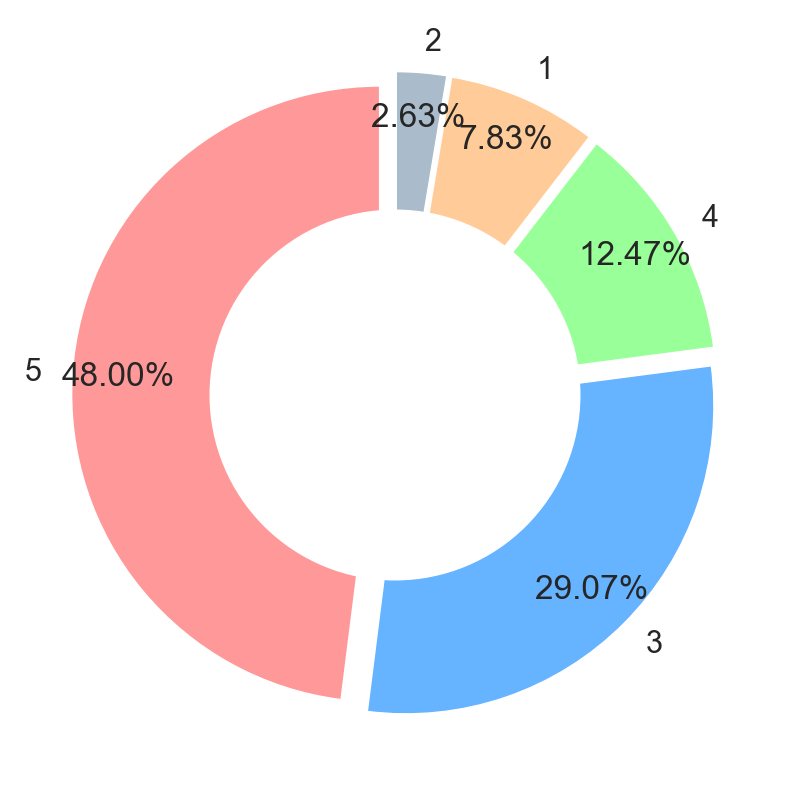

In [207]:
val = df['weatherDesc'].value_counts().values
ind_name = df['weatherDesc'].value_counts().index

# explosion
explode = (0.05, 0.05, 0.05, 0.05, 0.05)
#add colors
colors = ['#ff9999','#66b3ff','#99ff99','#ffcc99','#aabbcc']

plt.figure(figsize=(12, 10), dpi=100)
plt.pie(val, labels=ind_name, pctdistance=0.85, colors=colors,
        explode=explode, autopct='%1.2f%%', startangle=90) # , shadow=True

# draw circle
centre_circle = plt.Circle((0, 0), 0.60, fc='white')
fig = plt.gcf()
  
# Adding Circle in Pie chart
fig.gca().add_artist(centre_circle)

# Observation :

- `48%` time we have `Clear` weather.
- `29.07%` time we have `Light Rain` weather.
- `12.47%` time we have `Cloudy` weather.
- `7.83%` time we have `Heavy Rain` weather.
- `2.63%` time we have `Moderate Rain` weather.

In [208]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4227 entries, 0 to 4226
Data columns (total 36 columns):
 #   Column                                    Non-Null Count  Dtype         
---  ------                                    --------------  -----         
 0   observation                               4227 non-null   datetime64[ns]
 1   tempC_7to8                                4227 non-null   int64         
 2   tempC_1to2                                4227 non-null   int64         
 3   tempC_6to7                                4227 non-null   int64         
 4   tempC_avg(0C)                             4227 non-null   int64         
 5   Relative humidity_7to8                    4227 non-null   int64         
 6   Relative humidity_1to2                    4227 non-null   int64         
 7   Relative humidity_6to7                    4227 non-null   int64         
 8   Relative humidity_avg(%)                  4227 non-null   int64         
 9   windspeedKmph_7to8            

# Handle Missing Value's

In [209]:
df['Type of Disease (Bacterial Blight/Telya)'].fillna(0, inplace=True)
df['Anthracnose'].fillna(0, inplace=True)
df['Fruit Spot/ Rot'].fillna(0, inplace=True)
df['Fusarium Wilt'].fillna(0, inplace=True)
df['Fruit Borer / Blight Blora'].fillna(0, inplace=True)
df.head()

,observation,tempC_7to8,tempC_1to2,tempC_6to7,tempC_avg(0C),Relative humidity_7to8,Relative humidity_1to2,Relative humidity_6to7,Relative humidity_avg(%),windspeedKmph_7to8,...,%_soil_moisure,soil_pH,water_pH,water_TDS_mgpl,Label (Disease Yes/No),Type of Disease (Bacterial Blight/Telya),Anthracnose,Fruit Spot/ Rot,Fusarium Wilt,Fruit Borer / Blight Blora
0,2010-01-01,20,30,20,23,42,33,59,44,9,...,45,6.91,7.18,1709.0,0,0,0,0,0,0
1,2010-01-02,23,29,23,25,49,40,62,50,9,...,45,6.77,7.66,1707.0,1,Bacterial Blight,Anthracnose,0,0,0
2,2010-01-03,24,27,21,24,61,50,78,63,4,...,41,6.76,7.44,1707.0,0,0,0,0,0,0
3,2010-01-04,23,29,20,24,57,30,52,46,5,...,43,7.10,7.43,1708.0,0,0,0,0,0,0
4,2010-01-05,22,30,21,24,48,34,54,45,6,...,44,6.53,8.05,1709.0,0,0,0,0,0,0


In [210]:
df['Type of Disease (Bacterial Blight/Telya)'].unique(), len(df['Type of Disease (Bacterial Blight/Telya)'].unique())

(array([0, 'Bacterial Blight', 'Bacterial Blight (Telya)'], dtype=object), 3)

In [211]:
df['Type of Disease (Bacterial Blight/Telya)'].value_counts()

0                           3053
Bacterial Blight             875
Bacterial Blight (Telya)     299
Name: Type of Disease (Bacterial Blight/Telya), dtype: int64

In [212]:
df['Type of Disease (Bacterial Blight/Telya)'] = np.where(df['Type of Disease (Bacterial Blight/Telya)'] == 0,0,1)

In [213]:
df['Anthracnose'].unique(), len(df['Anthracnose'].unique())

(array([0, 'Anthracnose', 'Anthrocnose', 'Anthocnose', 'Antrocnose'],
       dtype=object),
 5)

In [214]:
df['Anthracnose'].value_counts()

0              3551
Anthrocnose     438
Anthracnose     219
Anthocnose       17
Antrocnose        2
Name: Anthracnose, dtype: int64

In [215]:
df['Anthracnose'] = np.where(df['Anthracnose'] == 0,0,1)

In [216]:
df['Fruit Spot/ Rot'].unique(), len(df['Fruit Spot/ Rot'].unique())

(array([0, 'Fruit Spot/ Rot', 'Fruit Spot /Rot', 'Fruit Spot/Rot',
        'Fruit Spot / Rot', 'Fruit Spot/ rot'], dtype=object),
 6)

In [217]:
df['Fruit Spot/ Rot'].value_counts()

0                   3763
Fruit Spot/ Rot      327
Fruit Spot/ rot       46
Fruit Spot /Rot       40
Fruit Spot / Rot      39
Fruit Spot/Rot        12
Name: Fruit Spot/ Rot, dtype: int64

In [218]:
df['Fruit Spot/ Rot'] = np.where(df['Fruit Spot/ Rot'] == 0,0,1)

In [219]:
df['Fusarium Wilt'].unique(), len(df['Fusarium Wilt'].unique())

(array([0, 'Fusarium Wilt'], dtype=object), 2)

In [220]:
df['Fusarium Wilt'].value_counts()

0                4124
Fusarium Wilt     103
Name: Fusarium Wilt, dtype: int64

In [221]:
df['Fusarium Wilt'] = np.where(df['Fusarium Wilt'] == 0,0,1)

In [222]:
df['Fruit Borer / Blight Blora'].unique(), len(df['Fruit Borer / Blight Blora'].unique())

(array([0, 'Fruit Borer / Blight Blora', 'Blight Blora'], dtype=object), 3)

In [223]:
df['Fruit Borer / Blight Blora'].value_counts()

0                             3440
Fruit Borer / Blight Blora     784
Blight Blora                     3
Name: Fruit Borer / Blight Blora, dtype: int64

In [224]:
df['Fruit Borer / Blight Blora'] = np.where(df['Fruit Borer / Blight Blora'] == 0,0,1)

In [225]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4227 entries, 0 to 4226
Data columns (total 36 columns):
 #   Column                                    Non-Null Count  Dtype         
---  ------                                    --------------  -----         
 0   observation                               4227 non-null   datetime64[ns]
 1   tempC_7to8                                4227 non-null   int64         
 2   tempC_1to2                                4227 non-null   int64         
 3   tempC_6to7                                4227 non-null   int64         
 4   tempC_avg(0C)                             4227 non-null   int64         
 5   Relative humidity_7to8                    4227 non-null   int64         
 6   Relative humidity_1to2                    4227 non-null   int64         
 7   Relative humidity_6to7                    4227 non-null   int64         
 8   Relative humidity_avg(%)                  4227 non-null   int64         
 9   windspeedKmph_7to8            

In [226]:
# Consider the observation columns and convert it into  date, month, year
int(df['observation'].astype('str').str.split('-')[0][2]), int(df['observation'].astype('str').str.split('-')[0][1]), int(df['observation'].astype('str').str.split('-')[0][0])

(1, 1, 2010)

In [227]:
df['date'] = [int(str(df['observation'][i]).split(' ')[0].split('-')[2]) for i in range(len(df))]
df['month'] = [int(str(df['observation'][i]).split(' ')[0].split('-')[1]) for i in range(len(df))]
df['year'] = [int(str(df['observation'][i]).split(' ')[0].split('-')[0]) for i in range(len(df))]

In [228]:
df.columns

Index(['observation', 'tempC_7to8', 'tempC_1to2', 'tempC_6to7',
       'tempC_avg(0C)', 'Relative humidity_7to8', 'Relative humidity_1to2',
       'Relative humidity_6to7', 'Relative humidity_avg(%)',
       'windspeedKmph_7to8', 'windspeedKmph_1to2', 'windspeedKmph_6to7',
       'windspeedKmph_avg(Km/h)', 'pressureMB_7to8', 'pressureMB_1to2',
       'pressureMB_6to7', 'pressureMB_avg', 'precipMM_7to8', 'precipMM_1to2',
       'precipMM_6to7', 'precipMM_avg(mm)', 'weatherDesc_7to8',
       'weatherDesc_1to2', 'weatherDesc_6to7', 'weatherDesc', 'Sunshine Hours',
       '%_soil_moisure', 'soil_pH', 'water_pH', 'water_TDS_mgpl',
       'Label (Disease Yes/No)', 'Type of Disease (Bacterial Blight/Telya)',
       'Anthracnose', 'Fruit Spot/ Rot', 'Fusarium Wilt',
       'Fruit Borer / Blight Blora', 'date', 'month', 'year'],
      dtype='object')

In [229]:
# Rearrange columns in any way you want.

columns = ['observation', 'date', 'month', 'year', 'tempC_7to8', 'tempC_1to2', 'tempC_6to7',
       'tempC_avg(0C)', 'Relative humidity_7to8', 'Relative humidity_1to2',
       'Relative humidity_6to7', 'Relative humidity_avg(%)',
       'windspeedKmph_7to8', 'windspeedKmph_1to2', 'windspeedKmph_6to7',
       'windspeedKmph_avg(Km/h)', 'pressureMB_7to8', 'pressureMB_1to2',
       'pressureMB_6to7', 'pressureMB_avg', 'precipMM_7to8', 'precipMM_1to2',
       'precipMM_6to7', 'precipMM_avg(mm)', 'weatherDesc_7to8',
       'weatherDesc_1to2', 'weatherDesc_6to7', 'weatherDesc', 'Sunshine Hours',
       '%_soil_moisure', 'soil_pH', 'water_pH', 'water_TDS_mgpl',
       'Label (Disease Yes/No)', 'Type of Disease (Bacterial Blight/Telya)',
       'Anthracnose', 'Fruit Spot/ Rot', 'Fusarium Wilt',
       'Fruit Borer / Blight Blora']
df = df[columns]
df.head()

,observation,date,month,year,tempC_7to8,tempC_1to2,tempC_6to7,tempC_avg(0C),Relative humidity_7to8,Relative humidity_1to2,...,%_soil_moisure,soil_pH,water_pH,water_TDS_mgpl,Label (Disease Yes/No),Type of Disease (Bacterial Blight/Telya),Anthracnose,Fruit Spot/ Rot,Fusarium Wilt,Fruit Borer / Blight Blora
0,2010-01-01,1,1,2010,20,30,20,23,42,33,...,45,6.91,7.18,1709.0,0,0,0,0,0,0
1,2010-01-02,2,1,2010,23,29,23,25,49,40,...,45,6.77,7.66,1707.0,1,1,1,0,0,0
2,2010-01-03,3,1,2010,24,27,21,24,61,50,...,41,6.76,7.44,1707.0,0,0,0,0,0,0
3,2010-01-04,4,1,2010,23,29,20,24,57,30,...,43,7.10,7.43,1708.0,0,0,0,0,0,0
4,2010-01-05,5,1,2010,22,30,21,24,48,34,...,44,6.53,8.05,1709.0,0,0,0,0,0,0


In [ ]:
df.to_csv('part6\Historical Weather Data 2010-2021_preprocessed.csv', index=False)

# After Pre-processing

In [231]:
df = pd.read_csv('part6\Historical Weather Data 2010-2021_preprocessed.csv')
df.head()

,observation,date,month,year,tempC_7to8,tempC_1to2,tempC_6to7,tempC_avg(0C),Relative humidity_7to8,Relative humidity_1to2,...,%_soil_moisure,soil_pH,water_pH,water_TDS_mgpl,Label (Disease Yes/No),Type of Disease (Bacterial Blight/Telya),Anthracnose,Fruit Spot/ Rot,Fusarium Wilt,Fruit Borer / Blight Blora
0,2010-01-01,1,1,2010,20,30,20,23,42,33,...,45,6.91,7.18,1709.0,0,0,0,0,0,0
1,2010-01-02,2,1,2010,23,29,23,25,49,40,...,45,6.77,7.66,1707.0,1,1,1,0,0,0
2,2010-01-03,3,1,2010,24,27,21,24,61,50,...,41,6.76,7.44,1707.0,0,0,0,0,0,0
3,2010-01-04,4,1,2010,23,29,20,24,57,30,...,43,7.10,7.43,1708.0,0,0,0,0,0,0
4,2010-01-05,5,1,2010,22,30,21,24,48,34,...,44,6.53,8.05,1709.0,0,0,0,0,0,0


In [232]:
# Correlation between columns
corr_matrix = round(df.corr(),2)
corr_matrix

,date,month,year,tempC_7to8,tempC_1to2,tempC_6to7,tempC_avg(0C),Relative humidity_7to8,Relative humidity_1to2,Relative humidity_6to7,...,%_soil_moisure,soil_pH,water_pH,water_TDS_mgpl,Label (Disease Yes/No),Type of Disease (Bacterial Blight/Telya),Anthracnose,Fruit Spot/ Rot,Fusarium Wilt,Fruit Borer / Blight Blora
date,1.00,0.01,-0.00,0.00,0.01,0.01,0.01,-0.01,-0.00,-0.01,...,0.02,-0.01,0.01,-0.18,-0.00,-0.01,-0.01,0.04,-0.02,0.03
month,0.01,1.00,-0.02,-0.18,-0.41,-0.29,-0.33,0.41,0.44,0.45,...,0.41,-0.07,-0.01,-0.01,0.26,0.14,0.15,0.15,0.06,0.22
year,-0.00,-0.02,1.00,-0.26,-0.11,0.29,-0.03,0.11,0.03,-0.09,...,-0.01,0.08,-0.06,0.00,0.01,0.02,0.01,-0.01,0.06,-0.05
tempC_7to8,0.00,-0.18,-0.26,1.00,0.79,0.61,0.89,-0.37,-0.32,-0.25,...,-0.41,0.02,-0.03,0.00,-0.07,0.10,0.05,-0.16,-0.08,-0.21
tempC_1to2,0.01,-0.41,-0.11,0.79,1.00,0.68,0.93,-0.70,-0.75,-0.68,...,-0.75,0.04,0.01,0.01,-0.39,-0.06,-0.11,-0.41,-0.19,-0.51
tempC_6to7,0.01,-0.29,0.29,0.61,0.68,1.00,0.85,-0.23,-0.30,-0.35,...,-0.44,0.09,-0.03,-0.01,-0.01,0.14,0.04,-0.15,-0.05,-0.21
tempC_avg(0C),0.01,-0.33,-0.03,0.89,0.93,0.85,1.00,-0.50,-0.53,-0.49,...,-0.61,0.05,-0.02,0.00,-0.19,0.07,-0.01,-0.27,-0.12,-0.36
Relative humidity_7to8,-0.01,0.41,0.11,-0.37,-0.70,-0.23,-0.50,1.00,0.95,0.92,...,0.77,-0.04,-0.05,-0.00,0.70,0.34,0.33,0.49,0.23,0.63
Relative humidity_1to2,-0.00,0.44,0.03,-0.32,-0.75,-0.30,-0.53,0.95,1.00,0.95,...,0.85,-0.05,-0.05,-0.01,0.71,0.30,0.30,0.56,0.26,0.70
Relative humidity_6to7,-0.01,0.45,-0.09,-0.25,-0.68,-0.35,-0.49,0.92,0.95,1.00,...,0.81,-0.06,-0.04,-0.01,0.70,0.35,0.37,0.47,0.21,0.63


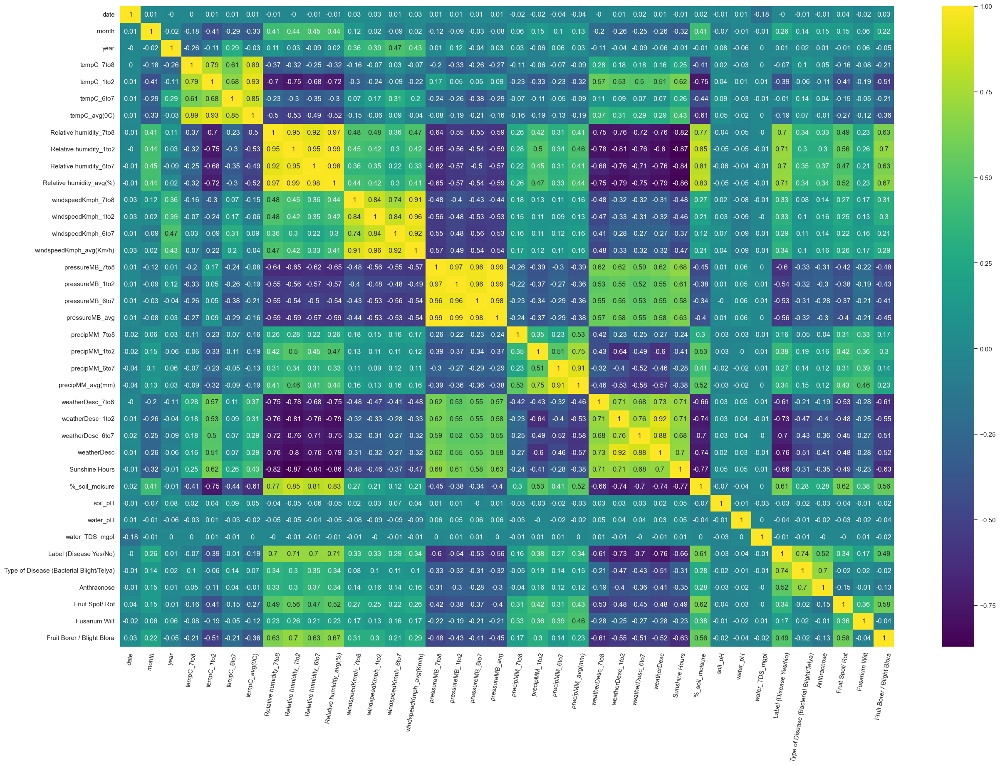

In [233]:
sns.set(rc={'figure.figsize':(30,20)})

# plotting the heatmap
hm = sns.heatmap(data = corr_matrix, annot=True, cmap="viridis" ,fmt='g')
hm.set_xticklabels(labels=list(corr_matrix.columns), rotation=80)

plt.savefig('heatmap_corr_matrix.png', dpi=200, pad_inches=0.15)

# displaying the plotted heatmap
plt.show()

# Find relation between features

# Feature Selection

- Dropping constant features

> # a b c d 
> # 23 4 6 7
> # 12 3 6 7
> # 10 2 6 7 

In [234]:
col_list = list(df.select_dtypes(include=['int','float', 'category'])) # 'category',
col_list[:-6] # nat taking dependent variable

['date',
 'month',
 'year',
 'tempC_7to8',
 'tempC_1to2',
 'tempC_6to7',
 'tempC_avg(0C)',
 'Relative humidity_7to8',
 'Relative humidity_1to2',
 'Relative humidity_6to7',
 'Relative humidity_avg(%)',
 'windspeedKmph_7to8',
 'windspeedKmph_1to2',
 'windspeedKmph_6to7',
 'windspeedKmph_avg(Km/h)',
 'pressureMB_7to8',
 'pressureMB_1to2',
 'pressureMB_6to7',
 'pressureMB_avg',
 'precipMM_7to8',
 'precipMM_1to2',
 'precipMM_6to7',
 'precipMM_avg(mm)',
 'weatherDesc_7to8',
 'weatherDesc_1to2',
 'weatherDesc_6to7',
 'weatherDesc',
 'Sunshine Hours',
 '%_soil_moisure',
 'soil_pH',
 'water_pH',
 'water_TDS_mgpl']

In [236]:
df1 = df[col_list[:-6]]
df1.head()

,date,month,year,tempC_7to8,tempC_1to2,tempC_6to7,tempC_avg(0C),Relative humidity_7to8,Relative humidity_1to2,Relative humidity_6to7,...,precipMM_avg(mm),weatherDesc_7to8,weatherDesc_1to2,weatherDesc_6to7,weatherDesc,Sunshine Hours,%_soil_moisure,soil_pH,water_pH,water_TDS_mgpl
0,1,1,2010,20,30,20,23,42,33,59,...,0.0,5,5,5,5,9.8,45,6.91,7.18,1709.0
1,2,1,2010,23,29,23,25,49,40,62,...,0.0,5,4,4,4,9.8,45,6.77,7.66,1707.0
2,3,1,2010,24,27,21,24,61,50,78,...,0.0,4,4,4,4,9.8,41,6.76,7.44,1707.0
3,4,1,2010,23,29,20,24,57,30,52,...,0.0,5,5,5,5,9.8,43,7.10,7.43,1708.0
4,5,1,2010,22,30,21,24,48,34,54,...,0.0,5,5,5,5,9.8,44,6.53,8.05,1709.0


In [237]:
from sklearn.feature_selection import VarianceThreshold
var_thres=VarianceThreshold(threshold=(.8 * (1 - .8))) # It will zero variance features, 0.1
var_thres.fit(df1)

VarianceThreshold(threshold=0.15999999999999998)

In [238]:
var_thres.get_support()

array([ True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True, False, False,  True, False,  True,  True,  True,  True,
        True,  True, False,  True,  True])

In [239]:
### Finding non-constant features
sum(var_thres.get_support())

28

In [240]:
# Lets Find non-constant features 
len(df1.columns[var_thres.get_support()])

28

In [241]:
# Lets Find constant features 
constant_columns = [column for column in df1.columns if column not in df1.columns[var_thres.get_support()]]
print(len(constant_columns))

4


In [242]:
# Lets Find constant features 
for column in constant_columns:
    print(column)

precipMM_7to8
precipMM_1to2
precipMM_avg(mm)
soil_pH


Correlation between Label (Disease Yes/No) and precipMM_7to8 is : 0.1584285054900719


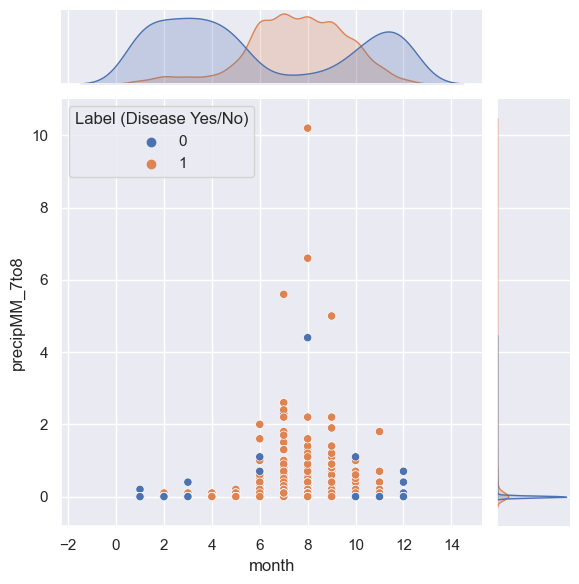

Correlation between Label (Disease Yes/No) and precipMM_1to2 is : 0.37915658987652084


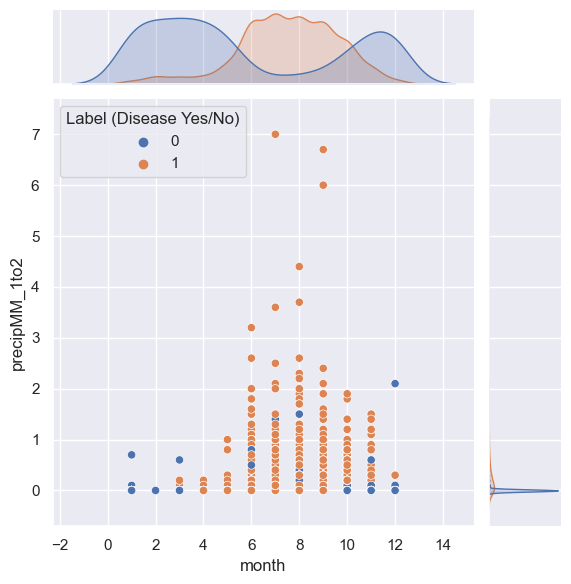

Correlation between Label (Disease Yes/No) and precipMM_avg(mm) is : 0.34403760546232753


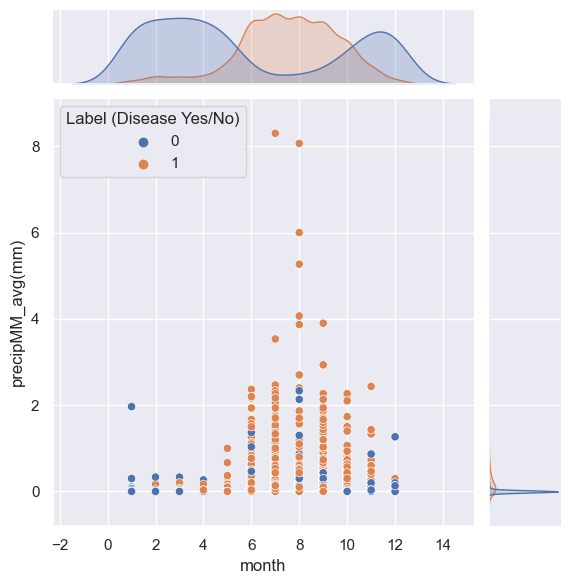

Correlation between Label (Disease Yes/No) and soil_pH is : -0.03214731357571692


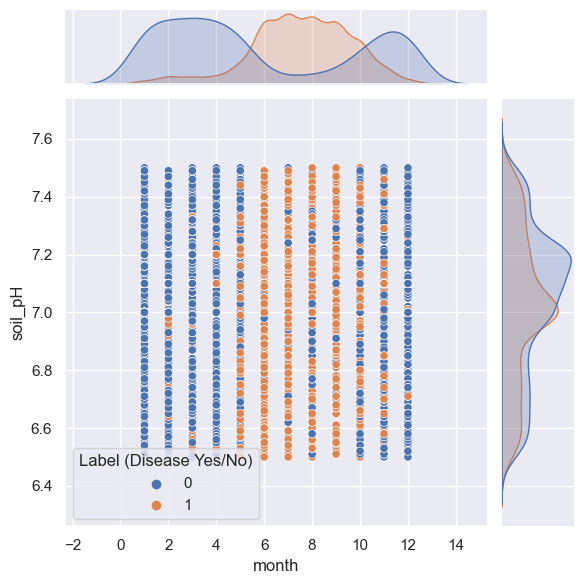

In [243]:
sns.set(rc={'figure.figsize':(30,20)})

for column in constant_columns:
    print(f'Correlation between Label (Disease Yes/No) and {column} is : {df["Label (Disease Yes/No)"].corr(df[column])}')
    sns.jointplot(x = df["month"], y = df[column], hue=df['Label (Disease Yes/No)'], kind='scatter')
    plt.show()


# Observation :

- Remove the constant features (precipMM_7to8, precipMM_1to2, precipMM_avg(mm), soil_pH), becouse they both are giving the almost sane info. 

# Feature Selection

- With Correlation (pearson correlation)

In [244]:
X = df[['date', 'month', 'year', 'tempC_7to8', 'tempC_1to2',
       'tempC_6to7', 'tempC_avg(0C)', 'Relative humidity_7to8',
       'Relative humidity_1to2', 'Relative humidity_6to7',
       'Relative humidity_avg(%)', 'windspeedKmph_7to8', 'windspeedKmph_1to2',
       'windspeedKmph_6to7', 'windspeedKmph_avg(Km/h)', 'pressureMB_7to8',
       'pressureMB_1to2', 'pressureMB_6to7', 'pressureMB_avg', 'precipMM_7to8',
       'precipMM_1to2', 'precipMM_6to7', 'precipMM_avg(mm)',
       'weatherDesc_7to8', 'weatherDesc_1to2', 'weatherDesc_6to7',
       'weatherDesc', 'Sunshine Hours', '%_soil_moisure', 'soil_pH',
       'water_pH', 'water_TDS_mgpl']]
y = df['Label (Disease Yes/No)']

# To check the correlation between columns

- Make data unsupervised dataset (X).
- Check the correlation between each columns set.

In [ ]:
X.to_csv('part6\X_data.csv', index=False)
y.to_csv('part6\y_data.csv', index=False)

In [245]:
df_X = pd.read_csv('part6\X_data.csv')
df_y = pd.read_csv('part6\y_data.csv')

# Unsupervised: Do not use the target variable (Correlation)

- Numerical Input, Numerical Output
    - Pearson’s correlation coefficient (linear)
    - Spearman’s rank coefficient (nonlinear)

- Numerical Input, Categorical Output
    - ANOVA correlation coefficient (linear)
    - Kendall’s rank coefficient (nonlinear)
    
    
# Check the correlation between columns.

- main columns : 'date', 'month', 'year', 'tempC', 'Relative humidity', 'windspeedKmph', 'pressureMB', 'precipMM', 'weatherDesc', 'Sunshine Hours','%_soil_moisure', 'soil_pH', 'water_pH', 'water_TDS_mgpl'

In [246]:
X = df[['tempC_avg(0C)', 'Relative humidity_avg(%)', 'windspeedKmph_avg(Km/h)', 
        'pressureMB_avg', 'precipMM_avg(mm)', 'weatherDesc', 'Sunshine Hours', '%_soil_moisure', 'soil_pH', 
        'water_pH', 'water_TDS_mgpl']]
corr_matrix = round(X.corr(),2)
corr_matrix

,tempC_avg(0C),Relative humidity_avg(%),windspeedKmph_avg(Km/h),pressureMB_avg,precipMM_avg(mm),weatherDesc,Sunshine Hours,%_soil_moisure,soil_pH,water_pH,water_TDS_mgpl
tempC_avg(0C),1.00,-0.52,-0.04,-0.16,-0.19,0.29,0.43,-0.61,0.05,-0.02,0.00
Relative humidity_avg(%),-0.52,1.00,0.41,-0.59,0.44,-0.79,-0.86,0.83,-0.05,-0.05,-0.01
windspeedKmph_avg(Km/h),-0.04,0.41,1.00,-0.54,0.16,-0.32,-0.47,0.21,0.04,-0.09,-0.01
pressureMB_avg,-0.16,-0.59,-0.54,1.00,-0.38,0.58,0.63,-0.40,0.01,0.06,0.00
precipMM_avg(mm),-0.19,0.44,0.16,-0.38,1.00,-0.57,-0.38,0.52,-0.03,-0.02,0.00
weatherDesc,0.29,-0.79,-0.32,0.58,-0.57,1.00,0.70,-0.74,0.02,0.03,-0.01
Sunshine Hours,0.43,-0.86,-0.47,0.63,-0.38,0.70,1.00,-0.77,0.05,0.05,0.01
%_soil_moisure,-0.61,0.83,0.21,-0.40,0.52,-0.74,-0.77,1.00,-0.07,-0.04,0.00
soil_pH,0.05,-0.05,0.04,0.01,-0.03,0.02,0.05,-0.07,1.00,-0.01,-0.03
water_pH,-0.02,-0.05,-0.09,0.06,-0.02,0.03,0.05,-0.04,-0.01,1.00,0.00


### In statistics, positive correlation describes the relationship between two variables that change together, while an inverse correlation describes the relationship between two variables which change in opposing directions. Inverse correlation is sometimes described as negative correlation.

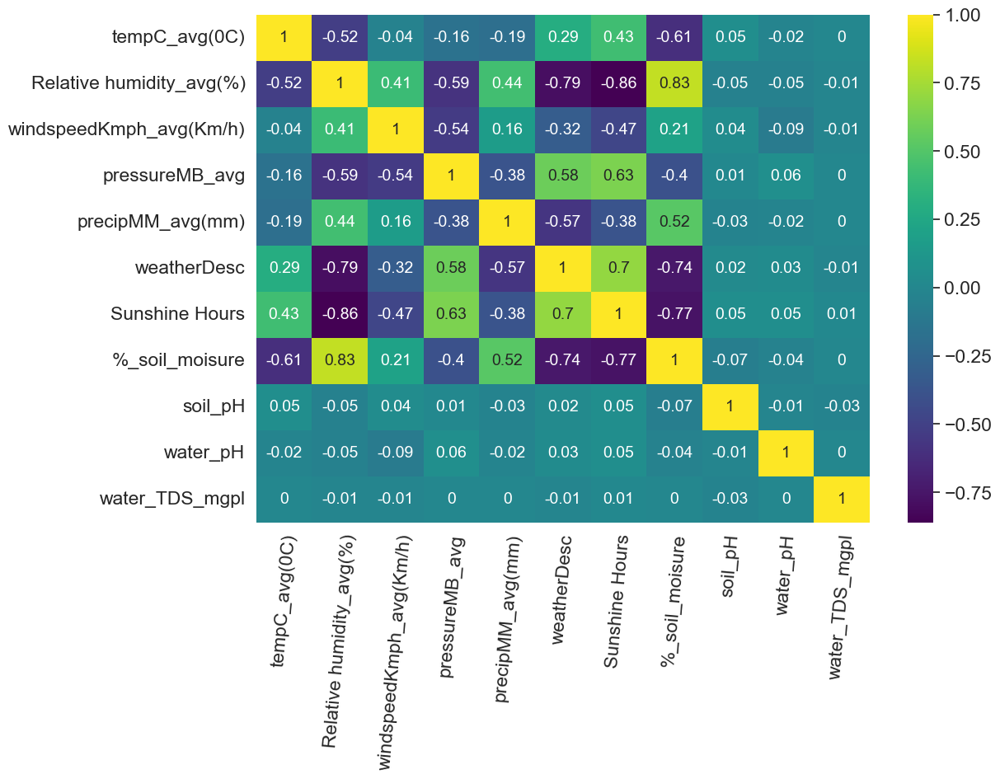

In [247]:
sns.set(rc={'figure.figsize':(12,8)})
sns.set(font_scale=1.5)

# plotting the heatmap
hm = sns.heatmap(data = corr_matrix, annot=True, cmap="viridis" ,fmt='g', annot_kws={"size": 14})
hm.set_xticklabels(labels=list(corr_matrix.columns), rotation=85)

plt.savefig('heatmap_corr_matrix_date_to_temp.png', dpi=200, pad_inches=0.15)

# displaying the plotted heatmap
plt.show()

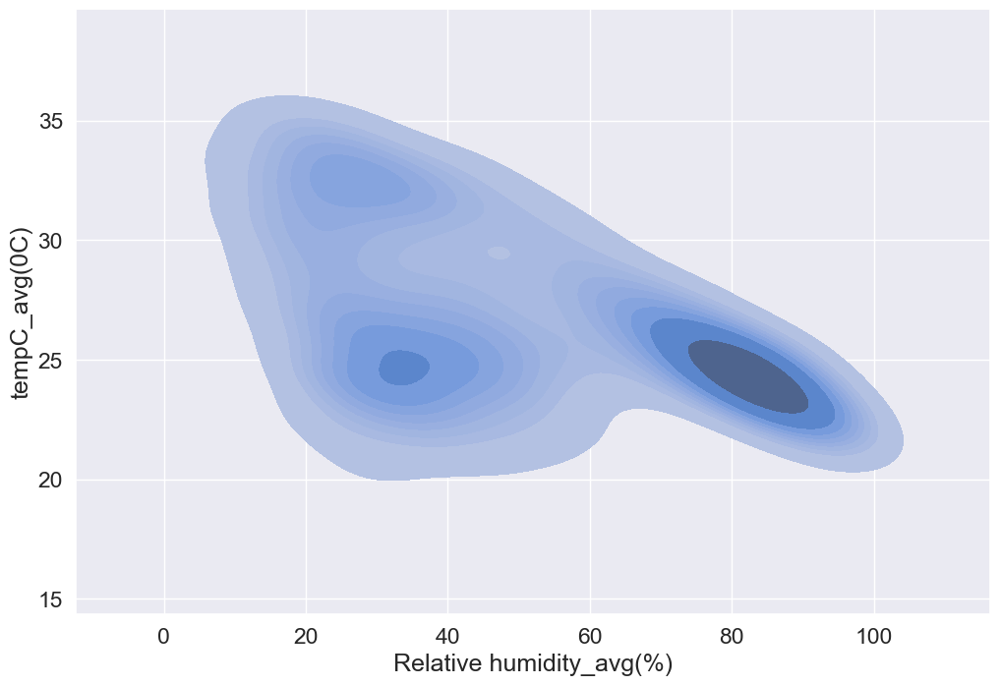

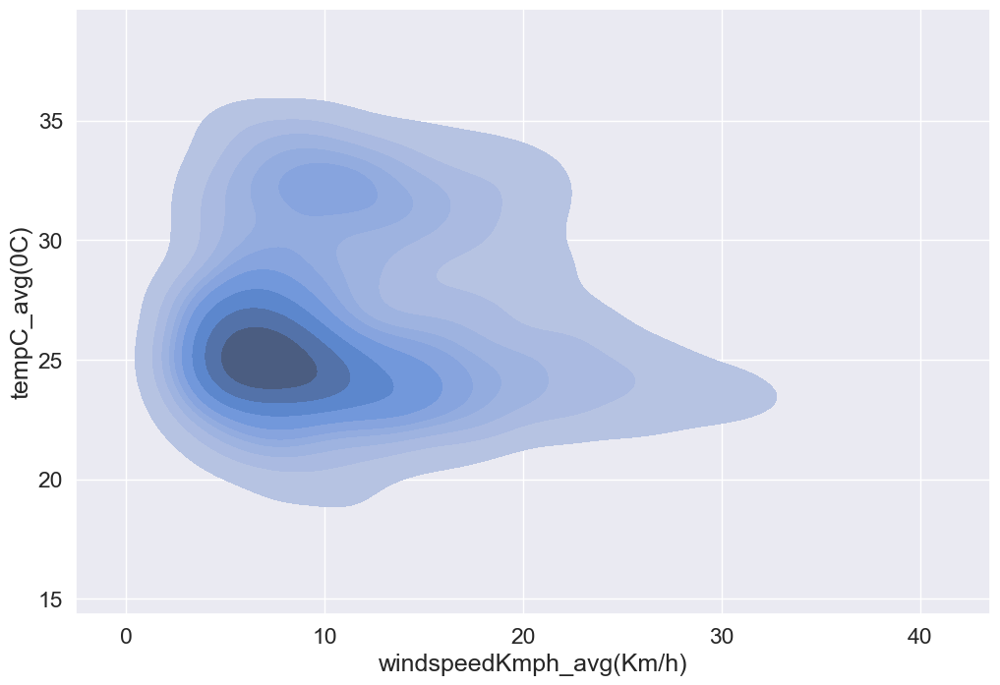

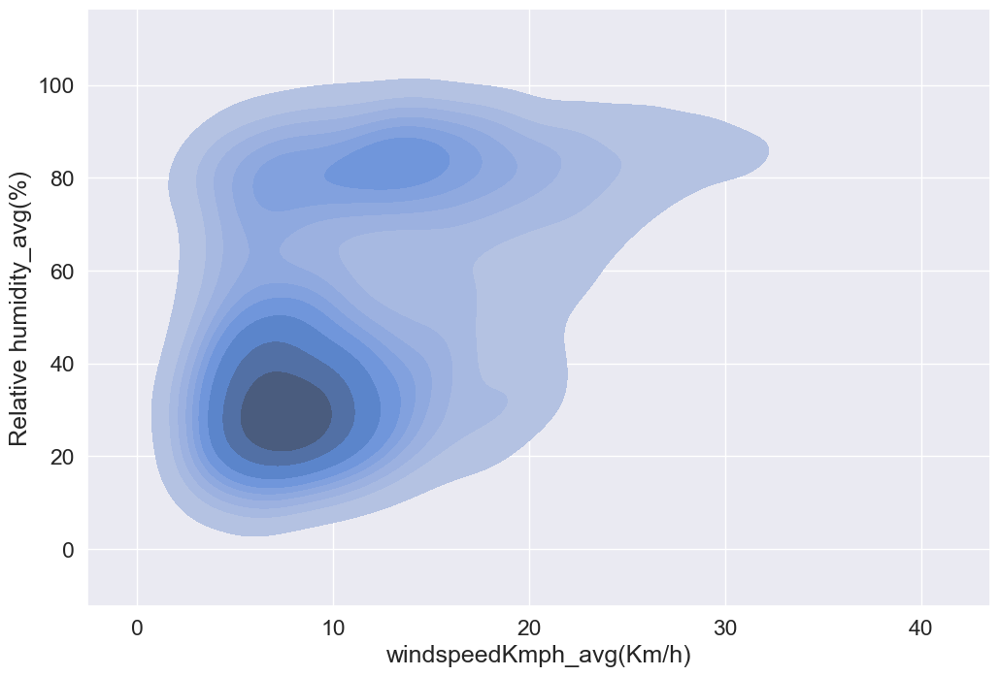

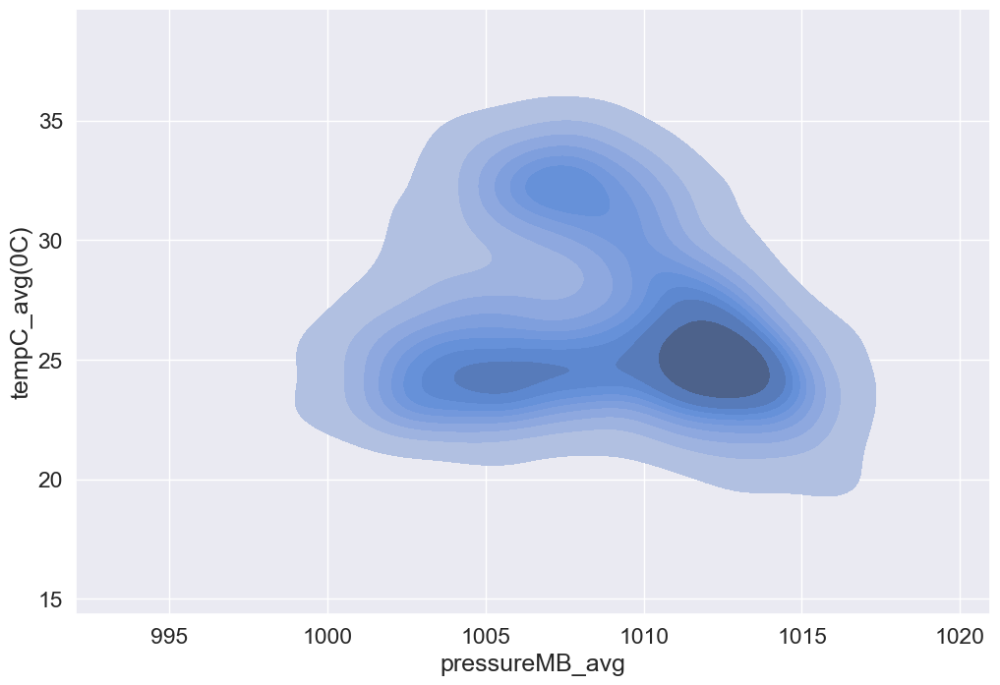

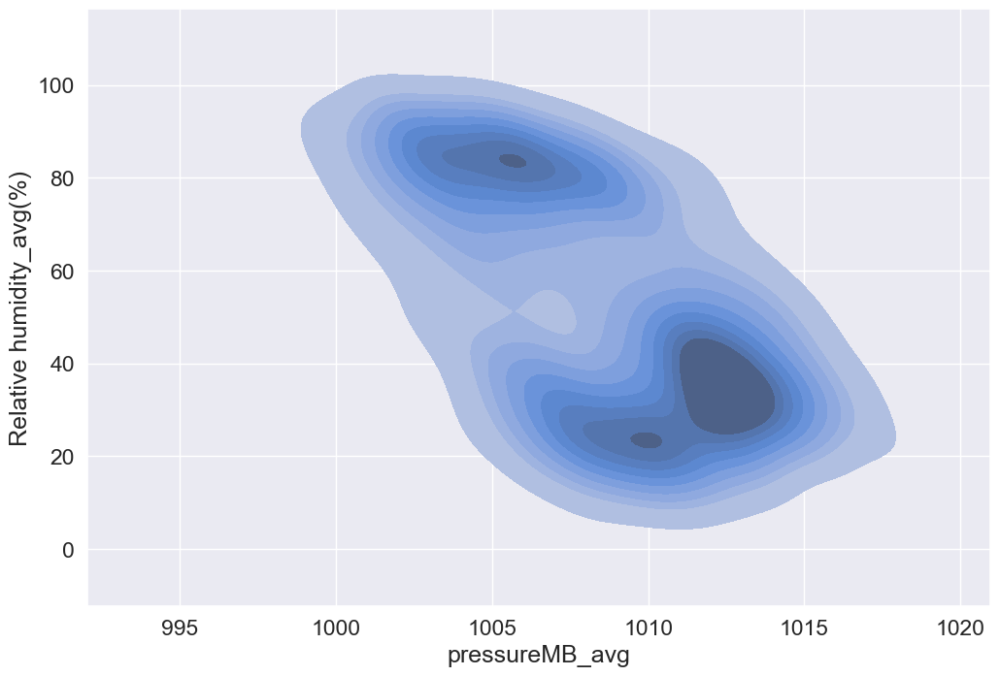

...

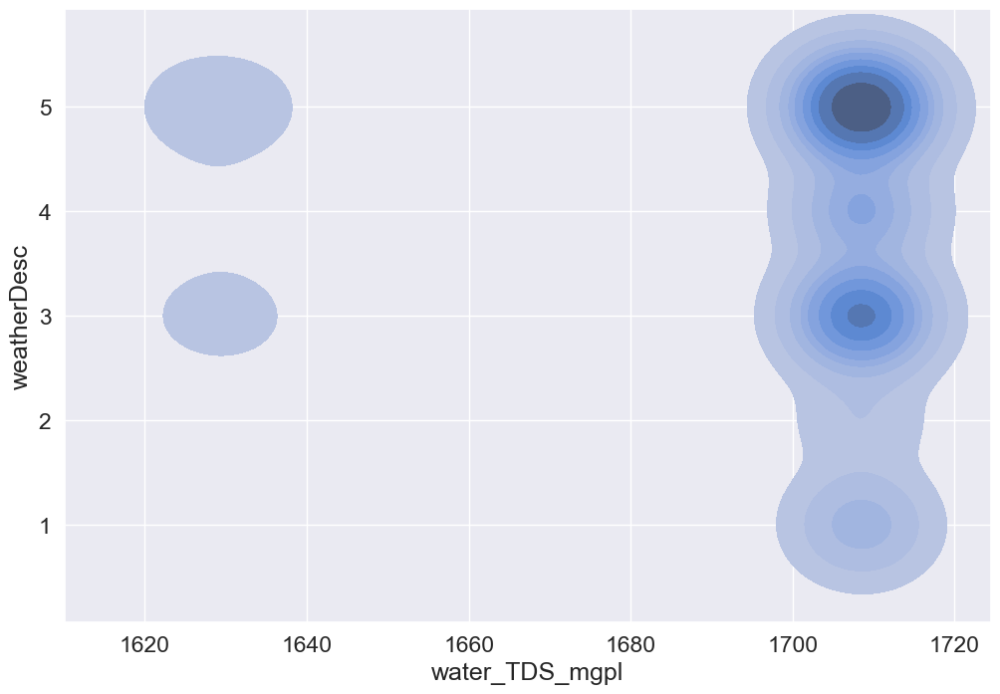

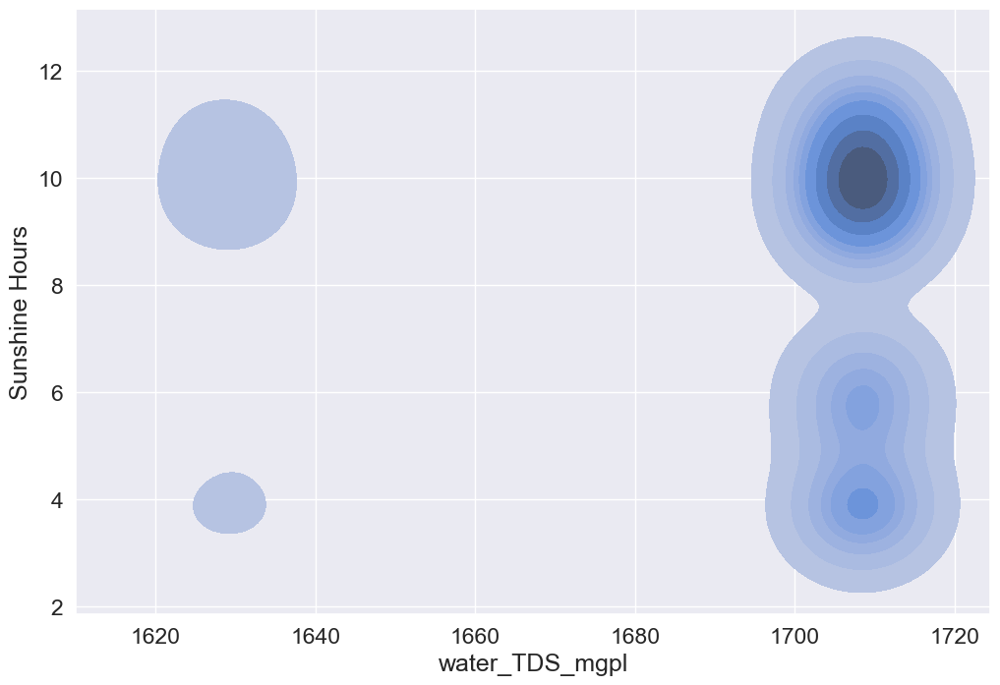

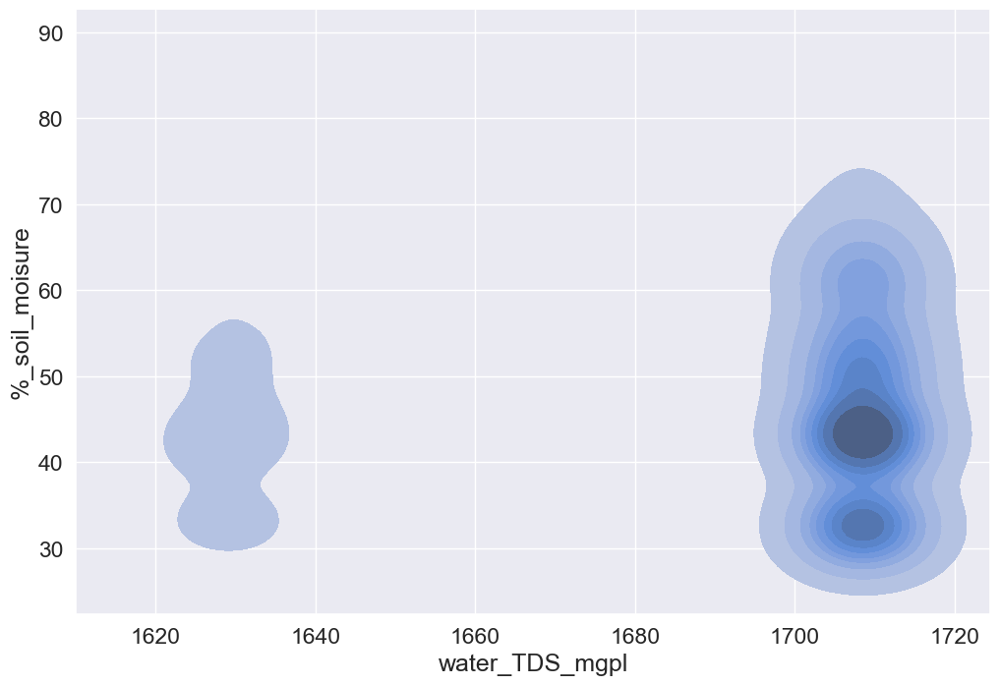

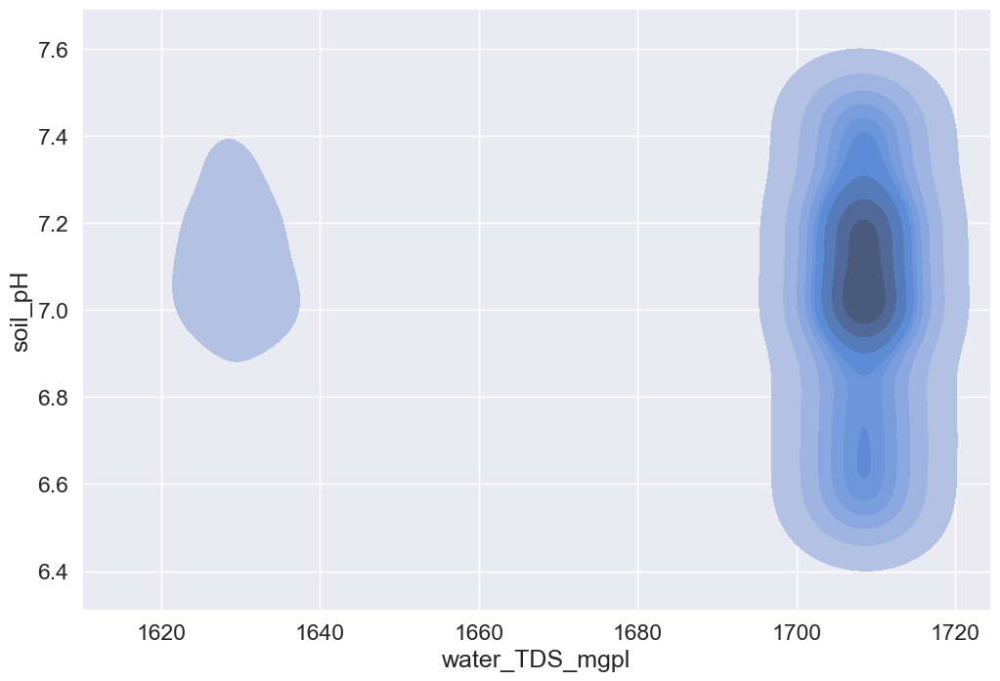

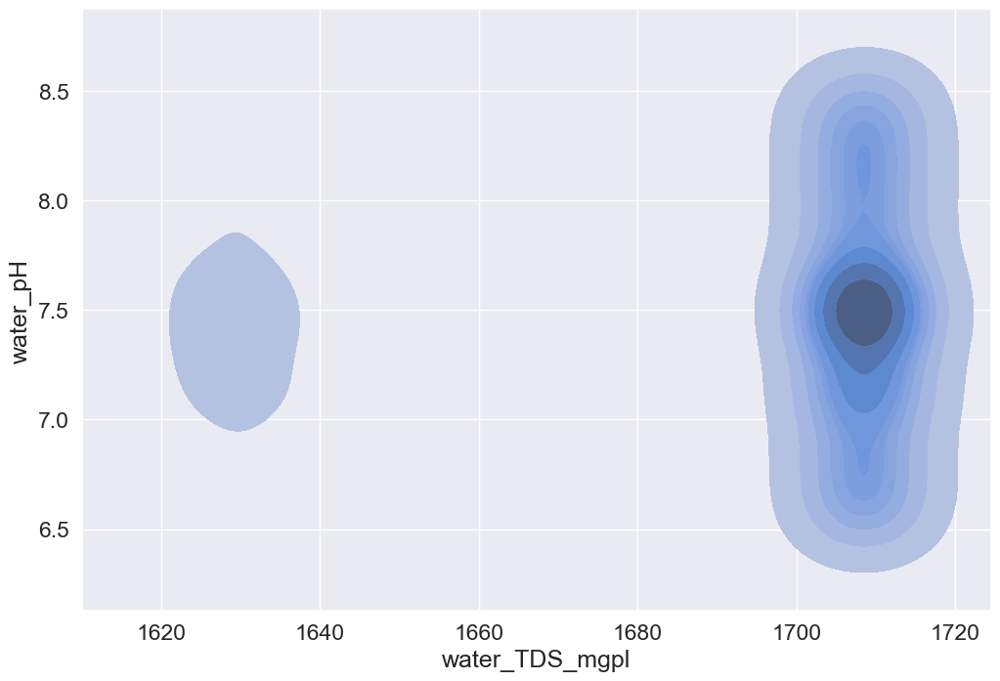

In [253]:
col1 = ['tempC_avg(0C)', 'Relative humidity_avg(%)', 'windspeedKmph_avg(Km/h)', 
        'pressureMB_avg', 'precipMM_avg(mm)', 'weatherDesc', 'Sunshine Hours', '%_soil_moisure', 'soil_pH', 
        'water_pH', 'water_TDS_mgpl']

for i in range(len(col1)):
    for j in range(i):
        fig = sns.kdeplot(data=X, x=col1[i], y=col1[j], shade=True, color="blue") 
        plt.show()

In [ ]:
for i in range(len(col1)):
    for j in range(i):
        fig = sns.kdeplot(X[col1[i]], X[col1[j]], shade=True, hue= df['Label (Disease Yes/No)'], color="b")
        plt.show()